# 0.0 IMPORTS

In [2]:
import pandas as pd
import inflection
import math
import numpy as np
import seaborn as sns
import datetime
import xgboost as xgb
import random
import warnings
import pickle
from matplotlib import pyplot as plt
from IPython.core.display import HTML
from IPython.display import Image
from scipy import stats as ss
from sklearn.feature_selection import SelectKBest, mutual_info_regression, f_regression
from sklearn.preprocessing import RobustScaler, MinMaxScaler, LabelEncoder
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression, Lasso
from boruta import BorutaPy
from flask import Flask, request, Response
from platform import python_version
print(python_version())

3.8.11


## 0.1 Helper Funcions

In [3]:
def mean_absolute_percentage_error(y, yhat):
    return np.mean(np.abs((y - yhat)/y))

def mean_percentage_error(y, yhat):
    return np.mean((y - yhat)/y)

def ml_error(model_name, y, yhat):
    mae = mean_absolute_error(y, yhat)
    mape = mean_absolute_percentage_error(y, yhat)
    rmse = np.sqrt(mean_squared_error(y, yhat))
    r2 = r2_score(y, yhat)
    
    return pd.DataFrame({'Model Name': model_name,
                        'MAE': round(mae,2),
                        'MAPE': round(mape,2),
                        'RMSE': round(rmse,2),
                        'R2' : round(r2,4)
                        }, index=[0])

def ml_error_(y_test, yhat_test, y_train, yhat_train):
    rmse_test = np.sqrt(mean_squared_error(y_test, yhat_test))
    r2_test = r2_score(y_test, yhat_test)
    rmse_train = np.sqrt(mean_squared_error(y_train, yhat_train))
    r2_train = r2_score(y_train, yhat_train)
    
    return pd.DataFrame({
                        'R2_TRAIN' : round(r2_train,4),
                        'R2_TEST' : round(r2_test,4),
                        'RMSE_TRAIN': round(rmse_train,2),
                        'RMSE_TEST': round(rmse_test,2)
                        }, index=[0])

def cramer_v(x,y):
    cm = pd.crosstab(x, y).values #no curso ele usa a função .as_matrix() que foi descontinuada.
    chi2 = ss.chi2_contingency(cm)[0]
    n = cm.sum()
    r, k = cm.shape
    chi2corr =  max(0, chi2 - (k-1)*(r-1)/(n-1))
    kcorr = k - (k-1)**2/(n-1)
    rcorr = r - (k-1)**2/(n-1)
    return np.sqrt((chi2corr/n)/(min(kcorr-1,rcorr-1)))
#0 a 1 - Quanto mais perto do 0 menor a correlação / 1 maior a correlação

def jupyter_settings():
    %matplotlib inline
    %pylab inline
    
    plt.style.use('bmh')
    plt.rcParams['figure.figsize'] = [25,12]
    plt.rcParams['font.size'] = 24
    
    display(HTML('<style>.container {width:100 !import;}</style>'))
    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.set_option('display.expand_frame_repr', False)
    
    sns.set()

jupyter_settings()

def cross_validation(x_training, kfold, model_name, model, verbose=False):
    mae_list = []
    mape_list = []
    rmse_list = []
    r2_list = []
    for k in reversed(range(1, kfold+1)):
        if verbose:
            print('\n KFold Number: {}'.format(k))
        # start and end date for validation
        validation_start_date = x_training['date'].max() - datetime.timedelta(days=k*6*7)
        validation_end_date = x_training['date'].max() - datetime.timedelta(days=(k-1)*6*7)

        # filtering dataset
        training = x_training[x_training['date'] < validation_start_date]
        validation = x_training[(x_training['date'] >= validation_start_date) & (x_training['date'] <= validation_end_date)]

        # training and validation dataset
        # training
        xtraining = training.drop(['date', 'sales'], axis=1)
        ytraining = training['sales']
        # validation
        xvalidation = validation.drop(['date', 'sales'], axis=1)
        yvalidation = validation['sales']

        # model
        m = model.fit(xtraining, ytraining)

        # prediction
        yhat = m.predict(xvalidation)

        # performance
        m_result = ml_error(model_name, np.expm1(yvalidation), np.expm1(yhat))

        # store performance of each kfold iteration
        mae_list.append(m_result['MAE'])
        mape_list.append(m_result['MAPE'])
        rmse_list.append(m_result['RMSE'])
        r2_list.append(m_result['R2'])

    return pd.DataFrame({'Model Name': model_name, 
                         'MAE CV': np.round(np.mean(mae_list), 2).astype('str') + '+/-' + np.round(np.std(mae_list), 2).astype('str'),
                         'MAPE CV': np.round(np.mean(mape_list), 2).astype('str') + '+/-' + np.round(np.std(mape_list), 2).astype('str'),
                         'RMSE CV': np.round(np.mean(rmse_list), 2).astype('str') + '+/-' + np.round(np.std(rmse_list), 2).astype('str'),
                         'R2 CV': np.round(np.mean(r2_list), 2).astype('str') + '+/-' + np.round(np.std(r2_list), 2).astype('str')},
                      index=[0])

def res_plot(y_test, yhat):
    res = pd.DataFrame(np.expm1(y_test))
    res['y_hat'] = np.expm1(yhat)
    res['residual'] = res['sales'] - res['y_hat']
    return sns.scatterplot(data=res, x='y_hat', y='residual')

Populating the interactive namespace from numpy and matplotlib


C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\IPython\core\magics\pylab.py:159: UserWarning: pylab import has clobbered these variables: ['random']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


## 0.2 Loading data

### 0.2.1 ANALYSING DF_STORE

#### STORE TYPE A

In [20]:
st_a = pd.read_csv('dataset/store.csv', low_memory=False)
st_a = st_a[st_a['StoreType']=='a']
st_a.shape

(602, 10)

##### NA

In [86]:
st_a.isna().sum()

Store                          0
StoreType                      0
Assortment                     0
CompetitionDistance            1
CompetitionOpenSinceMonth    176
CompetitionOpenSinceYear     176
Promo2                         0
Promo2SinceWeek              313
Promo2SinceYear              313
PromoInterval                313
dtype: int64

In [139]:
st_a.groupby('Assortment').count()

,Store,StoreType,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
Assortment,,,,,,,,,
a,381,381,381,295,295,381,187,187,187
c,221,221,220,131,131,221,102,102,102


In [117]:
st_a[st_a['CompetitionOpenSinceMonth'].isna()]

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
11,12,a,c,1070.0,NaN,NaN,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
15,16,a,c,3270.0,NaN,NaN,0,NaN,NaN,NaN
18,19,a,c,3240.0,NaN,NaN,1,22.0,2011.0,"Mar,Jun,Sept,Dec"
21,22,a,a,1040.0,NaN,NaN,1,22.0,2012.0,"Jan,Apr,Jul,Oct"
31,32,a,a,2910.0,NaN,NaN,1,45.0,2009.0,"Feb,May,Aug,Nov"
39,40,a,a,180.0,NaN,NaN,1,45.0,2009.0,"Feb,May,Aug,Nov"
41,42,a,c,290.0,NaN,NaN,1,40.0,2011.0,"Jan,Apr,Jul,Oct"
61,62,a,a,2050.0,NaN,NaN,0,NaN,NaN,NaN
67,68,a,c,250.0,NaN,NaN,1,35.0,2012.0,"Mar,Jun,Sept,Dec"
73,74,a,a,330.0,NaN,NaN,0,NaN,NaN,NaN


In [119]:
st_a[st_a['Promo2']== 1]

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
10,11,a,c,960.0,11.0,2011.0,1,1.0,2012.0,"Jan,Apr,Jul,Oct"
11,12,a,c,1070.0,NaN,NaN,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
13,14,a,a,1300.0,3.0,2014.0,1,40.0,2011.0,"Jan,Apr,Jul,Oct"
16,17,a,a,50.0,12.0,2005.0,1,26.0,2010.0,"Jan,Apr,Jul,Oct"
18,19,a,c,3240.0,NaN,NaN,1,22.0,2011.0,"Mar,Jun,Sept,Dec"
21,22,a,a,1040.0,NaN,NaN,1,22.0,2012.0,"Jan,Apr,Jul,Oct"
23,24,a,c,4590.0,3.0,2000.0,1,40.0,2011.0,"Jan,Apr,Jul,Oct"
26,27,a,a,60.0,1.0,2005.0,1,5.0,2011.0,"Jan,Apr,Jul,Oct"


In [112]:
st_a.dtypes

Store                          int64
StoreType                     object
Assortment                    object
CompetitionDistance          float64
CompetitionOpenSinceMonth    float64
CompetitionOpenSinceYear     float64
Promo2                         int64
Promo2SinceWeek              float64
Promo2SinceYear              float64
PromoInterval                 object
dtype: object

##### COMPETITION SINCE > 2013

In [21]:
st_a_exc_na = st_a[st_a['CompetitionOpenSinceMonth'].notna()].copy()
st_a_exc_na['CompetitionOpenSinceMonth'] = st_a_exc_na['CompetitionOpenSinceMonth'].astype('int64')
st_a_exc_na['CompetitionOpenSinceYear'] = st_a_exc_na['CompetitionOpenSinceYear'].astype('int64')
st_a_exc_na['c-year-month'] = st_a_exc_na['CompetitionOpenSinceYear'].astype('str') + '/' + st_a_exc_na['CompetitionOpenSinceMonth'].astype('str')

In [22]:
st_a_exc_na = st_a_exc_na[st_a_exc_na['CompetitionOpenSinceYear'] >= 2013]
st_a_exc_na['c-year-month'].unique()

array(['2015/4', '2013/12', '2013/4', '2014/10', '2014/3', '2014/2',
       '2013/5', '2013/7', '2013/9', '2014/8', '2013/8', '2015/7',
       '2014/4', '2015/5', '2013/3', '2013/2', '2015/6', '2014/7',
       '2015/3', '2014/11', '2014/9', '2014/6', '2014/12', '2013/11',
       '2015/8', '2015/2', '2013/10'], dtype=object)

In [23]:
c_open_ym = ['2015/4', '2013/12', '2013/4', '2014/10', '2014/3', '2014/2',
            '2013/5', '2013/7', '2013/9', '2014/8', '2013/8', '2015/7',
            '2014/4', '2015/5', '2013/3', '2013/2', '2015/6', '2014/7',
            '2015/3', '2014/11', '2014/9', '2014/6', '2014/12', '2013/11',
            '2015/8', '2015/2', '2013/10']

st_a_exc_na = st_a_exc_na[st_a_exc_na['c-year-month'].isin(c_open_ym)]
st_a_comp = st_a_exc_na['Store'].unique()

In [176]:
st_a_comp

array([   5,    6,    7,    8,   14,   28,   30,   33,   47,   51,   53,
         84,   95,  106,  110,  116,  122,  133,  137,  138,  166,  170,
        181,  191,  219,  263,  264,  266,  268,  269,  270,  276,  286,
        301,  304,  315,  336,  355,  375,  380,  391,  395,  403,  413,
        416,  432,  447,  449,  452,  488,  489,  490,  506,  513,  524,
        539,  551,  563,  581,  608,  630,  635,  646,  647,  675,  683,
        685,  688,  715,  718,  745,  752,  770,  774,  784,  788,  819,
        837,  872,  882,  901,  902,  905,  918,  929,  947,  954,  956,
        958,  963,  967,  970,  983,  986, 1003, 1013, 1020, 1034, 1040,
       1045, 1053, 1072, 1075, 1086, 1099, 1111], dtype=int64)

#### STORE TYPE B

In [25]:
st_b = pd.read_csv('dataset/store.csv', low_memory=False)
st_b = st_b[st_b['StoreType']=='b']
st_b.shape

(17, 10)

##### NA

In [122]:
st_b.isna().sum()

Store                         0
StoreType                     0
Assortment                    0
CompetitionDistance           0
CompetitionOpenSinceMonth     8
CompetitionOpenSinceYear      8
Promo2                        0
Promo2SinceWeek              12
Promo2SinceYear              12
PromoInterval                12
dtype: int64

In [140]:
st_b.groupby('Assortment').count()

,Store,StoreType,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
Assortment,,,,,,,,,
a,7,7,7,6,6,7,1,1,1
b,9,9,9,3,3,9,4,4,4
c,1,1,1,0,0,1,0,0,0


In [123]:
st_b[st_b['CompetitionOpenSinceMonth'].isna()]

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
258,259,b,b,210.0,NaN,NaN,0,NaN,NaN,NaN
273,274,b,b,3640.0,NaN,NaN,1,10.0,2013.0,"Jan,Apr,Jul,Oct"
334,335,b,a,90.0,NaN,NaN,1,31.0,2013.0,"Jan,Apr,Jul,Oct"
352,353,b,b,900.0,NaN,NaN,1,14.0,2013.0,"Feb,May,Aug,Nov"
511,512,b,b,590.0,NaN,NaN,1,5.0,2013.0,"Mar,Jun,Sept,Dec"
561,562,b,c,1210.0,NaN,NaN,0,NaN,NaN,NaN
768,769,b,b,840.0,NaN,NaN,1,48.0,2012.0,"Jan,Apr,Jul,Oct"
947,948,b,b,1430.0,NaN,NaN,0,NaN,NaN,NaN


In [126]:
st_b[st_b['Promo2']== 1]

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
273,274,b,b,3640.0,NaN,NaN,1,10.0,2013.0,"Jan,Apr,Jul,Oct"
334,335,b,a,90.0,NaN,NaN,1,31.0,2013.0,"Jan,Apr,Jul,Oct"
352,353,b,b,900.0,NaN,NaN,1,14.0,2013.0,"Feb,May,Aug,Nov"
511,512,b,b,590.0,NaN,NaN,1,5.0,2013.0,"Mar,Jun,Sept,Dec"
768,769,b,b,840.0,NaN,NaN,1,48.0,2012.0,"Jan,Apr,Jul,Oct"


##### COMPETITION SINCE > 2013

In [26]:
st_b_exc_na = st_b[st_b['CompetitionOpenSinceMonth'].notna()].copy()
st_b_exc_na['CompetitionOpenSinceMonth'] = st_b_exc_na['CompetitionOpenSinceMonth'].astype('int64')
st_b_exc_na['CompetitionOpenSinceYear'] = st_b_exc_na['CompetitionOpenSinceYear'].astype('int64')
st_b_exc_na['c-year-month'] = st_b_exc_na['CompetitionOpenSinceYear'].astype('str') + '/' + st_b_exc_na['CompetitionOpenSinceMonth'].astype('str')
st_b_exc_na = st_b_exc_na[st_b_exc_na['CompetitionOpenSinceYear'] >= 2013]
st_b_exc_na['c-year-month'].unique()

array(['2013/5', '2014/5'], dtype=object)

In [27]:
c_open_ym = ['2013/5', '2014/5']

st_b_exc_na = st_b_exc_na[st_b_exc_na['c-year-month'].isin(c_open_ym)]
st_b_comp = st_b_exc_na['Store'].unique()

#### STORE TYPE C

In [28]:
st_c = pd.read_csv('dataset/store.csv', low_memory=False)
st_c = st_c[st_c['StoreType']=='c']
st_c.shape

(148, 10)

##### NA

In [128]:
st_c.isna().sum()

Store                         0
StoreType                     0
Assortment                    0
CompetitionDistance           0
CompetitionOpenSinceMonth    41
CompetitionOpenSinceYear     41
Promo2                        0
Promo2SinceWeek              73
Promo2SinceYear              73
PromoInterval                73
dtype: int64

In [141]:
st_c.groupby('Assortment').count()

,Store,StoreType,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
Assortment,,,,,,,,,
a,77,77,77,56,56,77,39,39,39
c,71,71,71,51,51,71,36,36,36


In [129]:
st_c[st_c['CompetitionOpenSinceMonth'].isna()]

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
68,69,c,c,1130.0,NaN,NaN,1,40.0,2011.0,"Jan,Apr,Jul,Oct"
69,70,c,c,4840.0,NaN,NaN,0,NaN,NaN,NaN
90,91,c,a,2410.0,NaN,NaN,1,35.0,2011.0,"Jan,Apr,Jul,Oct"
91,92,c,a,240.0,NaN,NaN,1,45.0,2009.0,"Feb,May,Aug,Nov"
113,114,c,a,4510.0,NaN,NaN,1,48.0,2011.0,"Mar,Jun,Sept,Dec"
129,130,c,a,900.0,NaN,NaN,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
140,141,c,c,1540.0,NaN,NaN,1,22.0,2012.0,"Mar,Jun,Sept,Dec"
174,175,c,a,4130.0,NaN,NaN,0,NaN,NaN,NaN
215,216,c,a,190.0,NaN,NaN,1,45.0,2009.0,"Feb,May,Aug,Nov"
216,217,c,a,3150.0,NaN,NaN,0,NaN,NaN,NaN


In [132]:
st_c[st_c['Promo2']== 1]

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
20,21,c,c,550.0,10.0,1999.0,1,45.0,2009.0,"Jan,Apr,Jul,Oct"
45,46,c,a,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
62,63,c,c,3700.0,6.0,2010.0,1,18.0,2010.0,"Feb,May,Aug,Nov"
68,69,c,c,1130.0,NaN,NaN,1,40.0,2011.0,"Jan,Apr,Jul,Oct"
90,91,c,a,2410.0,NaN,NaN,1,35.0,2011.0,"Jan,Apr,Jul,Oct"
91,92,c,a,240.0,NaN,NaN,1,45.0,2009.0,"Feb,May,Aug,Nov"
98,99,c,c,2030.0,11.0,2003.0,1,22.0,2012.0,"Mar,Jun,Sept,Dec"
113,114,c,a,4510.0,NaN,NaN,1,48.0,2011.0,"Mar,Jun,Sept,Dec"
129,130,c,a,900.0,NaN,NaN,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
140,141,c,c,1540.0,NaN,NaN,1,22.0,2012.0,"Mar,Jun,Sept,Dec"


##### COMPETITION SINCE > 2013

In [29]:
st_c_exc_na = st_c[st_c['CompetitionOpenSinceMonth'].notna()].copy()
st_c_exc_na['CompetitionOpenSinceMonth'] = st_c_exc_na['CompetitionOpenSinceMonth'].astype('int64')
st_c_exc_na['CompetitionOpenSinceYear'] = st_c_exc_na['CompetitionOpenSinceYear'].astype('int64')
st_c_exc_na['c-year-month'] = st_c_exc_na['CompetitionOpenSinceYear'].astype('str') + '/' + st_c_exc_na['CompetitionOpenSinceMonth'].astype('str')
st_c_exc_na = st_c_exc_na[st_c_exc_na['CompetitionOpenSinceYear'] >= 2013]
st_c_exc_na['c-year-month'].unique()

array(['2014/12', '2015/7', '2015/3', '2013/4', '2013/11', '2014/5',
       '2013/7', '2015/6', '2013/12', '2013/9', '2015/1', '2013/8',
       '2015/4', '2015/2'], dtype=object)

In [30]:
c_open_ym = ['2014/12', '2015/7', '2015/3', '2013/4', '2013/11', '2014/5',
       '2013/7', '2015/6', '2013/12', '2013/9', '2015/1', '2013/8',
       '2015/4', '2015/2']

st_c_exc_na = st_c_exc_na[st_c_exc_na['c-year-month'].isin(c_open_ym)]
st_c_comp = st_c_exc_na['Store'].unique()

#### STORE TYPE D

In [31]:
st_d = pd.read_csv('dataset/store.csv', low_memory=False)
st_d = st_d[st_d['StoreType']=='d']
st_d.shape

(348, 10)

##### NA

In [134]:
st_d.isna().sum()

Store                          0
StoreType                      0
Assortment                     0
CompetitionDistance            2
CompetitionOpenSinceMonth    129
CompetitionOpenSinceYear     129
Promo2                         0
Promo2SinceWeek              146
Promo2SinceYear              146
PromoInterval                146
dtype: int64

In [142]:
st_d.groupby('Assortment').count()

,Store,StoreType,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
Assortment,,,,,,,,,
a,128,128,126,81,81,128,77,77,77
c,220,220,220,138,138,220,125,125,125


In [135]:
st_d[st_d['CompetitionOpenSinceMonth'].isna()]

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
12,13,d,a,310.0,NaN,NaN,1,45.0,2009.0,"Feb,May,Aug,Nov"
25,26,d,a,2300.0,NaN,NaN,0,NaN,NaN,NaN
28,29,d,c,2170.0,NaN,NaN,0,NaN,NaN,NaN
40,41,d,c,1180.0,NaN,NaN,1,31.0,2013.0,"Jan,Apr,Jul,Oct"
42,43,d,a,4880.0,NaN,NaN,1,37.0,2009.0,"Jan,Apr,Jul,Oct"
63,64,d,c,22560.0,NaN,NaN,1,14.0,2013.0,"Jan,Apr,Jul,Oct"
65,66,d,a,7660.0,NaN,NaN,1,37.0,2009.0,"Jan,Apr,Jul,Oct"
79,80,d,a,7910.0,NaN,NaN,0,NaN,NaN,NaN
93,94,d,c,14620.0,NaN,NaN,0,NaN,NaN,NaN
96,97,d,c,8980.0,NaN,NaN,0,NaN,NaN,NaN


In [137]:
st_d[st_d['Promo2']== 0]

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
22,23,d,a,4060.0,8.0,2005.0,0,NaN,NaN,NaN
25,26,d,a,2300.0,NaN,NaN,0,NaN,NaN,NaN
28,29,d,c,2170.0,NaN,NaN,0,NaN,NaN,NaN
30,31,d,c,9800.0,7.0,2012.0,0,NaN,NaN,NaN
37,38,d,a,1090.0,4.0,2007.0,0,NaN,NaN,NaN
44,45,d,a,9710.0,2.0,2014.0,0,NaN,NaN,NaN
48,49,d,c,18010.0,9.0,2007.0,0,NaN,NaN,NaN
49,50,d,a,6260.0,11.0,2009.0,0,NaN,NaN,NaN
56,57,d,c,420.0,6.0,2014.0,0,NaN,NaN,NaN
59,60,d,c,5540.0,10.0,2009.0,0,NaN,NaN,NaN


##### COMPETITION SINCE > 2013

In [32]:
st_d_exc_na = st_d[st_d['CompetitionOpenSinceMonth'].notna()].copy()
st_d_exc_na['CompetitionOpenSinceMonth'] = st_d_exc_na['CompetitionOpenSinceMonth'].astype('int64')
st_d_exc_na['CompetitionOpenSinceYear'] = st_d_exc_na['CompetitionOpenSinceYear'].astype('int64')
st_d_exc_na['c-year-month'] = st_d_exc_na['CompetitionOpenSinceYear'].astype('str') + '/' + st_d_exc_na['CompetitionOpenSinceMonth'].astype('str')
st_d_exc_na = st_d_exc_na[st_d_exc_na['CompetitionOpenSinceYear'] >= 2013]
st_d_exc_na['c-year-month'].unique()

array(['2014/2', '2014/4', '2014/8', '2014/6', '2013/12', '2015/5',
       '2014/12', '2014/10', '2013/3', '2014/7', '2014/3', '2013/7',
       '2013/9', '2014/9', '2015/4', '2014/5', '2015/6', '2015/3',
       '2014/1', '2014/11', '2013/4', '2013/11', '2013/10', '2013/2'],
      dtype=object)

In [33]:
c_open_ym = ['2014/2', '2014/4', '2014/8', '2014/6', '2013/12', '2015/5',
       '2014/12', '2014/10', '2013/3', '2014/7', '2014/3', '2013/7',
       '2013/9', '2014/9', '2015/4', '2014/5', '2015/6', '2015/3',
       '2014/1', '2014/11', '2013/4', '2013/11', '2013/10', '2013/2']

st_d_exc_na = st_d_exc_na[st_d_exc_na['c-year-month'].isin(c_open_ym)]
st_d_comp = st_d_exc_na['Store'].unique()

#### FILTERS

In [34]:
# STORES WITH COMPETITORS OPEN DURING ANALYZED PERIOD
st_comp = list(st_a_comp) + list(st_b_comp) + list(st_c_comp) + list(st_d_comp)

### 0.2.2 ANALYSING DF_SALES

In [120]:
df_sales = df_sales_raw.copy()

In [55]:
print(df_sales['Date'].min(), df_sales['Date'].max())

2013-01-01 2015-07-31


In [57]:
df_sales.isna().sum()

Store            0
DayOfWeek        0
Date             0
Sales            0
Customers        0
Open             0
Promo            0
StateHoliday     0
SchoolHoliday    0
dtype: int64

In [59]:
df_sales['Date'] = pd.to_datetime(df_sales['Date'])
# year
df_sales['year'] = df_sales['Date'].dt.year
# month
df_sales['month'] = df_sales['Date'].dt.month
# week of year
df_sales['week_of_year'] = df_sales['Date'].dt.isocalendar().week
df_sales['week_of_year'] = df_sales['week_of_year'].astype('str')

In [121]:
df_by = df_sales[['Date', 'Store']].groupby(['Date']).count()
df_by[df_by['Store'] < 1115]

,Store
Date,
2013-01-01,1114
2014-07-01,935
2014-07-02,935
2014-07-03,935
2014-07-04,935
2014-07-05,935
2014-07-06,935
2014-07-07,935
2014-07-08,935


In [75]:
df_missing = df_sales[(df_sales['Date'] >= '2014-07-01') & (df_sales['Date'] <= '2014-12-31')]

df_missing = pd.merge( df_missing, df_store_raw, how='left', on='Store')

In [87]:
print(
    'STORE A',
    df_missing[(df_missing['StoreType'] == 'a') & (df_missing['Date'] == '2014-07-01') & (df_missing['Assortment'] == 'a')]['Store'].shape,
    df_missing[(df_missing['StoreType'] == 'a') & (df_missing['Date'] == '2014-07-01') & (df_missing['Assortment'] == 'c')]['Store'].shape,
    '\nSTORE B',
    df_missing[(df_missing['StoreType'] == 'b') & (df_missing['Date'] == '2014-07-01') & (df_missing['Assortment'] == 'a')]['Store'].shape,
    df_missing[(df_missing['StoreType'] == 'b') & (df_missing['Date'] == '2014-07-01') & (df_missing['Assortment'] == 'b')]['Store'].shape,
    df_missing[(df_missing['StoreType'] == 'b') & (df_missing['Date'] == '2014-07-01') & (df_missing['Assortment'] == 'c')]['Store'].shape,
    '\nSTORE C',
    df_missing[(df_missing['StoreType'] == 'c') & (df_missing['Date'] == '2014-07-01') & (df_missing['Assortment'] == 'a')]['Store'].shape,
    df_missing[(df_missing['StoreType'] == 'c') & (df_missing['Date'] == '2014-07-01') & (df_missing['Assortment'] == 'c')]['Store'].shape,
    '\nSTORE D',
    df_missing[(df_missing['StoreType'] == 'd') & (df_missing['Date'] == '2014-07-01') & (df_missing['Assortment'] == 'a')]['Store'].shape,
    df_missing[(df_missing['StoreType'] == 'd') & (df_missing['Date'] == '2014-07-01') & (df_missing['Assortment'] == 'c')]['Store'].shape,
)
# MISSING INFORMATION ABOUT THIS SEMESTER IT SEEMS TO BE RANDOM

STORE A (313,) (205,) 
STORE B (7,) (8,) (1,) 
STORE C (68,) (66,) 
STORE D (90,) (177,)


### MERGING DATAFRAMES

In [107]:
df_sales_raw = pd.read_csv( 'dataset/train.csv', low_memory=False)
df_store_raw = pd.read_csv( 'dataset/store.csv', low_memory=False)

#merge - MAIN: SALES MERGING LEFT - Because all sales are related to a store.
df_raw = pd.merge( df_sales_raw, df_store_raw, how='left', on='Store')
df_raw.to_csv('dataset/C2/c02_00_rossman.csv', index=False)

In [129]:
df_raw.tail()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
1017204,1111,2,2013-01-01,0,0,0,0,a,1,a,a,1900.0,6.0,2014.0,1,31.0,2013.0,"Jan,Apr,Jul,Oct"
1017205,1112,2,2013-01-01,0,0,0,0,a,1,c,c,1880.0,4.0,2006.0,0,NaN,NaN,NaN
1017206,1113,2,2013-01-01,0,0,0,0,a,1,a,c,9260.0,NaN,NaN,0,NaN,NaN,NaN
1017207,1114,2,2013-01-01,0,0,0,0,a,1,a,c,870.0,NaN,NaN,0,NaN,NaN,NaN
1017208,1115,2,2013-01-01,0,0,0,0,a,1,d,c,5350.0,NaN,NaN,1,22.0,2012.0,"Mar,Jun,Sept,Dec"


# 1.0 DATA DESCRIPTION

In [3]:
# reading files - SALES + STORE
df1 = pd.read_csv('dataset/C2/c02_00_rossman.csv')

C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\IPython\core\interactiveshell.py:3441: DtypeWarning: Columns (7) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [4]:
df1.sample(30)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
315143,271,3,2014-10-08,10469,979,1,1,0,0,a,a,420.0,NaN,NaN,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
715524,480,6,2013-09-28,2566,318,1,0,0,0,a,a,300.0,11.0,2012.0,0,NaN,NaN,NaN
803244,115,4,2013-07-11,6415,493,1,0,0,0,d,c,5740.0,4.0,2007.0,1,40.0,2014.0,"Jan,Apr,Jul,Oct"
775312,58,1,2013-08-05,4817,426,1,0,0,1,a,c,7340.0,5.0,2008.0,1,27.0,2012.0,"Jan,Apr,Jul,Oct"
218558,19,5,2015-01-16,7958,790,1,1,0,0,a,c,3240.0,NaN,NaN,1,22.0,2011.0,"Mar,Jun,Sept,Dec"
309410,120,2,2014-10-14,5786,563,1,0,0,0,d,a,2290.0,12.0,2014.0,1,37.0,2009.0,"Jan,Apr,Jul,Oct"
534629,215,7,2014-03-09,0,0,0,0,0,0,d,a,150.0,NaN,NaN,1,45.0,2009.0,"Feb,May,Aug,Nov"
671277,833,4,2013-11-07,5327,496,1,1,0,0,d,c,3290.0,12.0,1999.0,1,35.0,2010.0,"Mar,Jun,Sept,Dec"
122195,661,1,2015-04-13,9196,705,1,1,0,0,d,c,2140.0,7.0,2013.0,0,NaN,NaN,NaN
410191,657,7,2014-06-29,0,0,0,0,0,0,c,c,80.0,1.0,2006.0,1,10.0,2014.0,"Jan,Apr,Jul,Oct"


In [5]:
# analyzing the columns of DF
df1.columns

Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'StoreType', 'Assortment',
       'CompetitionDistance', 'CompetitionOpenSinceMonth',
       'CompetitionOpenSinceYear', 'Promo2', 'Promo2SinceWeek',
       'Promo2SinceYear', 'PromoInterval'],
      dtype='object')

* Id - an Id that represents a (Store, Date) duple within the test set
* Store - a unique Id for each store
* Sales - the turnover for any given day (this is what you are predicting)
* Customers - the number of customers on a given day
* Open - an indicator for whether the store was open: 0 = closed, 1 = open
* StateHoliday - indicates a state holiday. Normally all stores, with few exceptions, are closed on state holidays. Note that all schools are closed on public holidays and weekends. a = public holiday, b = Easter holiday, c = Christmas, 0 = None
* SchoolHoliday - indicates if the (Store, Date) was affected by the closure of public schools
* StoreType - differentiates between 4 different store models: a, b, c, d
* Assortment - describes an assortment level: a = basic, b = extra, c = extended
* CompetitionDistance - distance in meters to the nearest competitor store
* CompetitionOpenSince[Month/Year] - gives the approximate year and month of the time the nearest competitor was opened
* Promo - indicates whether a store is running a promo on that day
* Promo2 - Promo2 is a continuing and consecutive promotion for some stores: 0 = store is not participating, 1 = store is participating
* Promo2Since[Year/Week] - describes the year and calendar week when the store started participating in Promo2
* PromoInterval - describes the consecutive intervals Promo2 is started, naming the months the promotion is started anew. E.g. "Feb,May,Aug,Nov" means each round starts in February, May, August, November of any given year for that store

## 1.1 Rename Colums

In [7]:
# storing columns names
cols_old = ['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'StoreType', 'Assortment',
       'CompetitionDistance', 'CompetitionOpenSinceMonth',
       'CompetitionOpenSinceYear', 'Promo2', 'Promo2SinceWeek',
       'Promo2SinceYear', 'PromoInterval']

# transforming to underscore the names and put into lowcase
snakecase = lambda x: inflection.underscore( x )

# creating a list with a new snakecase columns name and indicating the new one
cols_new = list( map( snakecase, cols_old ) )

#renaming columns name
df1.columns = cols_new

In [8]:
df1.columns

Index(['store', 'day_of_week', 'date', 'sales', 'customers', 'open', 'promo',
       'state_holiday', 'school_holiday', 'store_type', 'assortment',
       'competition_distance', 'competition_open_since_month',
       'competition_open_since_year', 'promo2', 'promo2_since_week',
       'promo2_since_year', 'promo_interval'],
      dtype='object')

## 1.2 Data Dimensions

In [9]:
print('Number of Rows: {}'.format (df1.shape[0]))
print('Number of Rows: {}'.format (df1.shape[1]))

Number of Rows: 1017209
Number of Rows: 18


## 1.3 Data Types

In [10]:
df1['date'] = pd.to_datetime(df1['date'])
df1.dtypes

store                                    int64
day_of_week                              int64
date                            datetime64[ns]
sales                                    int64
customers                                int64
open                                     int64
promo                                    int64
state_holiday                           object
school_holiday                           int64
store_type                              object
assortment                              object
competition_distance                   float64
competition_open_since_month           float64
competition_open_since_year            float64
promo2                                   int64
promo2_since_week                      float64
promo2_since_year                      float64
promo_interval                          object
dtype: object

## 1.4 Check NA

In [100]:
df_na = pd.DataFrame(df1.isna().sum(), columns=['NA'])
df_na['%'] = round(df_na['NA']/len(df1)*100, 2)
df_na

,NA,%
store,0,0.0
day_of_week,0,0.0
date,0,0.0
sales,0,0.0
customers,0,0.0
open,0,0.0
promo,0,0.0
state_holiday,0,0.0
school_holiday,0,0.0
store_type,0,0.0


In [ ]:
# 1. eliminar as linhas que possuem NA - rápido e fácil / jogar fora dados
# 2. utilizar algoritmos de ML (mediana, média, regressão) - quando não há entendimento de negócio
# 3. Análise sobre a lógica do negócio

## 1.5 Fillout NA

### 1.5.1. COMPETITION DISTANCE

#### COMPETITION DISTANCE - DOES DISTANCE MATTER TO SELL? A: IF THERE IS COMPETITION AROUND, SALES ARE LOWER (MEAN)

In [120]:
cd_na = df1[df1['competition_distance'].isna()]
cd_na.describe().T

,count,mean,std,min,25%,50%,75%,max
store,2642.0,577.716881,236.798871,291.0,291.00,622.0,879.00,879.0
day_of_week,2642.0,3.998864,1.997821,1.0,2.00,4.0,6.00,7.0
sales,2642.0,4535.892884,3159.272631,0.0,2883.25,4233.0,6164.25,21872.0
customers,2642.0,457.467827,316.888693,0.0,293.00,421.0,633.75,1847.0
open,2642.0,0.827403,0.377970,0.0,1.00,1.0,1.00,1.0
promo,2642.0,0.380772,0.485669,0.0,0.00,0.0,1.00,1.0
school_holiday,2642.0,0.172218,0.377641,0.0,0.00,0.0,0.00,1.0
competition_distance,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
competition_open_since_month,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
competition_open_since_year,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [119]:
cd_na = df1[df1['competition_distance'] > 0]
cd_na.describe().T

,count,mean,std,min,25%,50%,75%,max
store,1014567.0,558.379502,322.099505,1.0,280.0,558.0,837.0,1115.0
day_of_week,1014567.0,3.998339,1.997391,1.0,2.0,4.0,6.0,7.0
sales,1014567.0,5777.042614,3851.044855,0.0,3732.0,5748.0,7859.0,41551.0
customers,1014567.0,633.603424,464.648172,0.0,405.0,610.0,837.0,7388.0
open,1014567.0,0.830114,0.375533,0.0,1.0,1.0,1.0,1.0
promo,1014567.0,0.381516,0.485759,0.0,0.0,0.0,1.0,1.0
school_holiday,1014567.0,0.178663,0.383070,0.0,0.0,0.0,0.0,1.0
competition_distance,1014567.0,5430.085652,7715.323700,20.0,710.0,2330.0,6890.0,75860.0
competition_open_since_month,693861.0,7.222866,3.211832,1.0,4.0,8.0,10.0,12.0
competition_open_since_year,693861.0,2008.690228,5.992644,1900.0,2006.0,2010.0,2013.0,2015.0


#### COMPETITION DISTANCE - DOES HAVING COMPETITION MATTER TO SELL? A: STORES WHICH HAD PREVIOUSLY COMPETITION SELLS BETTER. STORES BETWEEN 2013-2015 WITH NEW COMPETITORS HAVE A WIDE RANGE OF SELL OF VALUES

In [35]:
df1['date'] = pd.to_datetime(df1['date'])
df1_wc = df1[df1['store'].isin(list(st_comp))]
df1_nc = df1[~df1['store'].isin(list(st_comp))]

In [245]:
df1_wc.head()

,store,day_of_week,date,sales,customers,open,promo,state_holiday,school_holiday,store_type,assortment,competition_distance,competition_open_since_month,competition_open_since_year,promo2,promo2_since_week,promo2_since_year,promo_interval
4,5,5,2015-07-31,4822,559,1,1,0,1,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN
5,6,5,2015-07-31,5651,589,1,1,0,1,a,a,310.0,12.0,2013.0,0,NaN,NaN,NaN
6,7,5,2015-07-31,15344,1414,1,1,0,1,a,c,24000.0,4.0,2013.0,0,NaN,NaN,NaN
7,8,5,2015-07-31,8492,833,1,1,0,1,a,a,7520.0,10.0,2014.0,0,NaN,NaN,NaN
13,14,5,2015-07-31,6544,710,1,1,0,1,a,a,1300.0,3.0,2014.0,1,40.0,2011.0,"Jan,Apr,Jul,Oct"


<AxesSubplot:xlabel='date', ylabel='rolling_average_sales'>

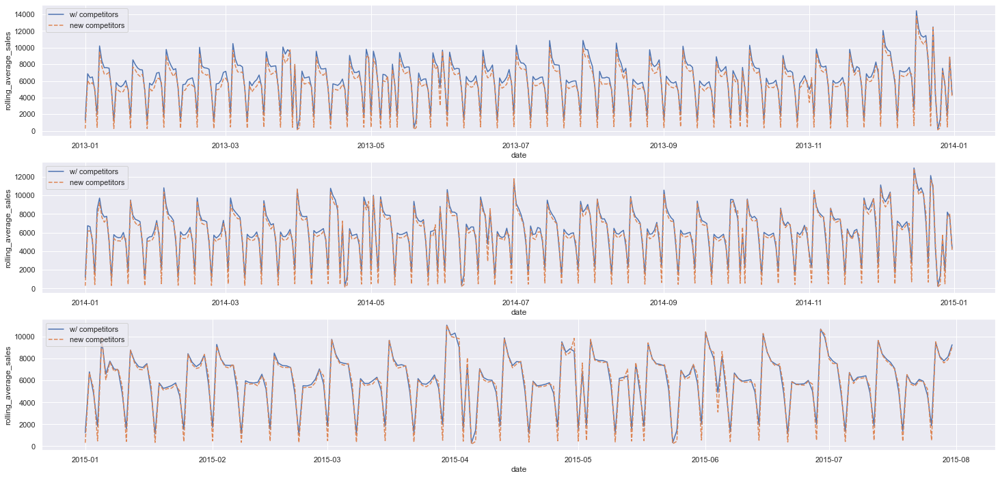

In [36]:
# IS THERE SOME DIFFERENCE IN THE SALES WHEN WE HAVE A COMPETITOR?
fig, axes = plt.subplots(3, 1)
wc = df1_wc[df1_wc['date'].dt.year.astype('int64') == 2013].copy()
nc = df1_nc[df1_nc['date'].dt.year.astype('int64') == 2013].copy()
wc['rolling_average_sales'] = wc['sales'].rolling(60).mean()
nc['rolling_average_sales'] = nc['sales'].rolling(60).mean()
sns.lineplot(x="date", y="rolling_average_sales", data=wc, ci=None, label='w/ competitors', ax=axes[0])
sns.lineplot(x="date", y="rolling_average_sales", data=nc, ci=None, label='new competitors', 
             linestyle="dashed", ax=axes[0])

wc = df1_wc[df1_wc['date'].dt.year.astype('int64') == 2014].copy()
nc = df1_nc[df1_nc['date'].dt.year.astype('int64') == 2014].copy()
wc['rolling_average_sales'] = wc['sales'].rolling(60).mean()
nc['rolling_average_sales'] = nc['sales'].rolling(60).mean()
sns.lineplot(x="date", y="rolling_average_sales", data=wc, ci=None, label='w/ competitors', ax=axes[1])
sns.lineplot(x="date", y="rolling_average_sales", data=nc, ci=None, label='new competitors', 
             linestyle="dashed", ax=axes[1])

wc = df1_wc[df1_wc['date'].dt.year.astype('int64') == 2015].copy()
nc = df1_nc[df1_nc['date'].dt.year.astype('int64') == 2015].copy()
wc['rolling_average_sales'] = wc['sales'].rolling(60).mean()
nc['rolling_average_sales'] = nc['sales'].rolling(60).mean()
sns.lineplot(x="date", y="rolling_average_sales", data=wc, ci=None, label='w/ competitors', ax=axes[2])
sns.lineplot(x="date", y="rolling_average_sales", data=nc, ci=None, label='new competitors', 
             linestyle="dashed", ax=axes[2])

<AxesSubplot:xlabel='date', ylabel='sales'>

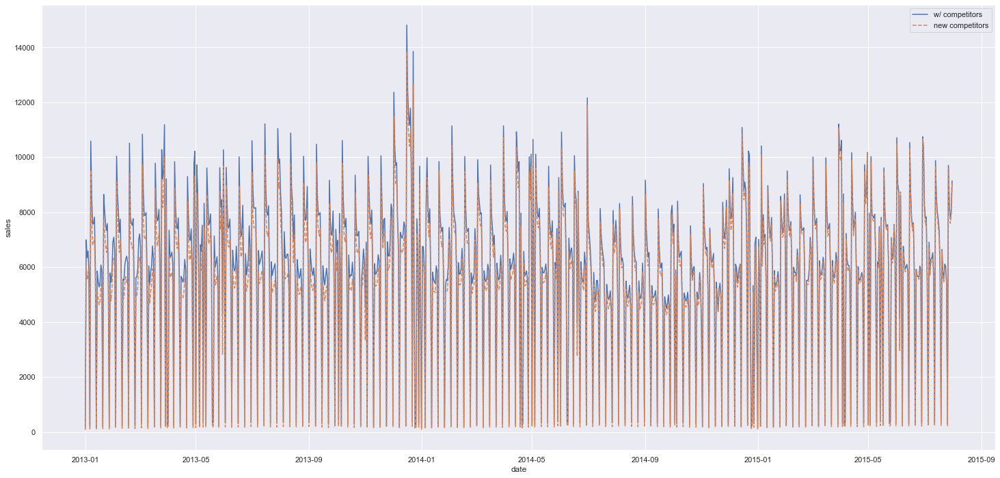

In [37]:
c_competitors = df1_wc[['date', 'sales']].groupby('date').sum().reset_index()
c_competitors['sales'] = c_competitors['sales'] / 191
n_competitors = df1_nc[['date', 'sales']].groupby('date').sum().reset_index()
n_competitors['sales'] = n_competitors['sales'] / 924
sns.lineplot(x="date", y="sales", data=c_competitors, label='w/ competitors')
sns.lineplot(x="date", y="sales", data=n_competitors, label='new competitors', linestyle="dashed")

In [41]:
print(c_competitors['sales'].mean(), n_competitors['sales'].mean())

5910.136103422595 5525.9339470685045


In [71]:
#aux1 = df1[df1['sales'] == 0]
#aux1 = aux1[aux1['open'] == 1]
#aux1 = aux1.groupby('store').count()
#aux1[aux1['sales'] > 1]

,day_of_week,date,sales,customers,open,promo,state_holiday,school_holiday,store_type,assortment,competition_distance,competition_open_since_month,competition_open_since_year,promo2,promo2_since_week,promo2_since_year,promo_interval
store,,,,,,,,,,,,,,,,,
25,2,2,2,2,2,2,2,2,2,2,2,2,2,2,0,0,0
28,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3
102,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
339,2,2,2,2,2,2,2,2,2,2,2,0,0,2,2,2,2
364,2,2,2,2,2,2,2,2,2,2,2,0,0,2,2,2,2
623,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
665,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
835,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
983,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2


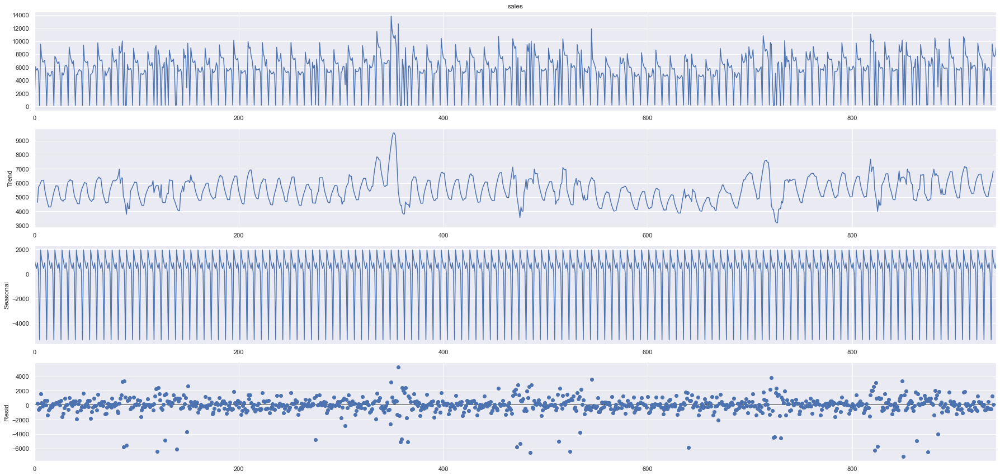

In [44]:
from matplotlib import pyplot
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(n_competitors['sales'], model='additive', period=7)
result.plot()
pyplot.show()

#### FILLING NA VALUES

In [42]:
print('MAX: ', df1['competition_distance'].max(), '\nMEAN: ', round(df1['competition_distance'].mean(), 2))

MAX:  75860.0 
MEAN:  5430.09


In [73]:
df1.columns

Index(['store', 'day_of_week', 'date', 'sales', 'customers', 'open', 'promo',
       'state_holiday', 'school_holiday', 'store_type', 'assortment',
       'competition_distance', 'competition_open_since_month',
       'competition_open_since_year', 'promo2', 'promo2_since_week',
       'promo2_since_year', 'promo_interval'],
      dtype='object')

In [84]:
aux1 = df1[df1['competition_distance'].isna()]
aux1['sales'].describe().T

count     2642.000000
mean      4535.892884
std       3159.272631
min          0.000000
25%       2883.250000
50%       4233.000000
75%       6164.250000
max      21872.000000
Name: sales, dtype: float64

<AxesSubplot:xlabel='competition_distance', ylabel='sales'>

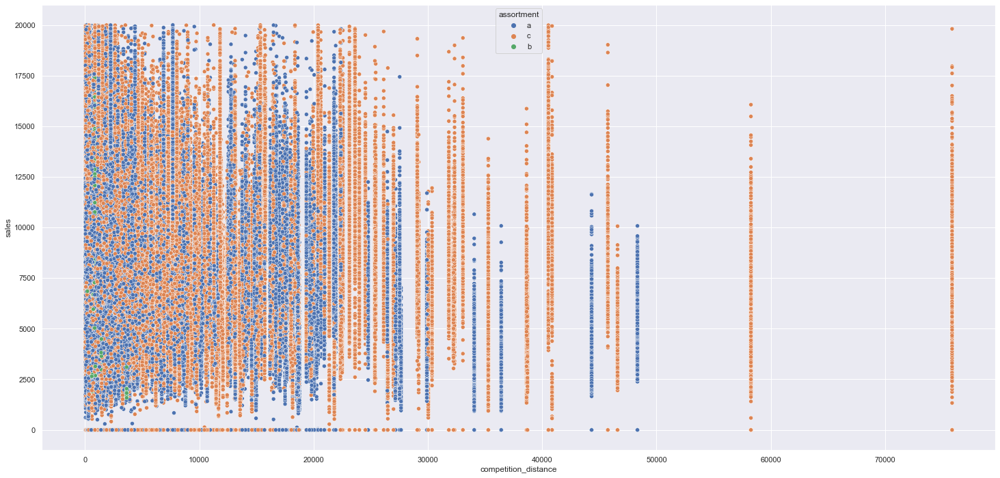

In [86]:
aux_d = df1[df1['sales'] < 20000]
sns.scatterplot(data=aux_d, x='competition_distance', y='sales', hue="assortment")

In [88]:
aux_s = aux_d[(aux_d['sales'] > 4000) & (aux_d['sales'] <= 5000)]
aux_s['competition_distance'].mean()

5352.015682619111

In [89]:
#C1 - 20.000 m
#C2 - it was used the mean distance, since the sales values is between 4000 to 5000 and the mean distance is 5352.
# competition_distance
df1['competition_distance'] = df1['competition_distance'].apply( lambda x: 5430.0 if math.isnan(x) else x)

### 1.5.2. COMPETITION OPEN SINCE MONTH / YEAR

In [12]:
aux1 = df1[df1['competition_open_since_month'].isna()]
len(aux1['store'].unique())

354

In [94]:
#We don´t have competidor opening date information in 323348 records, and almost 82% of database have competitors previously (before 2013).
#The only difference is the range of sells of store which have new competitors during the period analyed.
#Strategy - we are going to use the last day available
aux1 = df1['date'][0]

# competition_open_since_month
df1['competition_open_since_month'] = df1.apply(lambda x: aux1.month if math.isnan(x['competition_open_since_month']) else x['competition_open_since_month'], axis=1)

# competition_open_since_year
df1['competition_open_since_year'] = df1.apply(lambda x: aux1.year if math.isnan(x['competition_open_since_year']) else x['competition_open_since_year'], axis=1)

### 1.5.3. PROMO 2 SINCE WEEK / YEAR / PROMO INTERVAL

In [13]:
# All missing values occurs when the promo2 is 0.
len(df1[df1['promo2']== 0])

508031

In [97]:
# Verify if there was some miss typing in the information
len(df1[df1['promo2']== 0]) == len(df1[df1['promo2_since_week'].isna()])

True

In [98]:
aux_a = df1[df1['store_type'] == 'a']
aux_b = df1[df1['store_type'] == 'b']
aux_c = df1[df1['store_type'] == 'c']
aux_d = df1[df1['store_type'] == 'd']
df_t_store = pd.DataFrame([len(aux_a['store'].unique()),
                           len(aux_b['store'].unique()),
                           len(aux_c['store'].unique()),
                           len(aux_d['store'].unique()),
                           len(aux_a['store'].unique()) + len(aux_b['store'].unique()) + len(aux_c['store'].unique()) + len(aux_d['store'].unique())
                          ], index=['store_a', 'store_b', 'store_c', 'store_d', 'total'], columns=['store_type'])
df_t_store.T

,store_a,store_b,store_c,store_d,total
store_type,602,17,148,348,1115


In [20]:
# Distribution of NA by store_type
df_st_type = pd.DataFrame([aux_a.isna().sum(),
                           aux_b.isna().sum(),
                           aux_c.isna().sum(),
                           aux_d.isna().sum(),
                           aux_a.isna().sum() + aux_b.isna().sum() + aux_c.isna().sum() + aux_d.isna().sum()
                          ], index=['type a', 'type b', 'type c', 'type d', 'total'])
df_st_type.T

,type a,type b,type c,type d,total
store,0,0,0,0,0
day_of_week,0,0,0,0,0
date,0,0,0,0,0
sales,0,0,0,0,0
customers,0,0,0,0,0
open,0,0,0,0,0
promo,0,0,0,0,0
state_holiday,0,0,0,0,0
school_holiday,0,0,0,0,0
store_type,0,0,0,0,0


In [21]:
aux1 = df1[df1['promo2_since_week'].isna()]
len(aux1['store'].unique())

544

In [99]:
# CONCLUSION
# Since promo2 == 0 have all NA values, it means that the NaN values only refers that the information is not applicable.
# we are going to insert the 0 values to remove the NaN value
# promo2_since_week
df1['promo2_since_week'] = df1.apply(lambda x: 0 if math.isnan(x['promo2_since_week']) else x['promo2_since_week'], axis=1)

# promo2_since_year
df1['promo2_since_year'] = df1.apply(lambda x: 0 if math.isnan(x['promo2_since_year']) else x['promo2_since_year'], axis=1)

# promo_interval
df1['promo_interval'].fillna(0, inplace=True)

In [104]:
df1.sample(10)

,store,day_of_week,date,sales,customers,open,promo,state_holiday,school_holiday,store_type,assortment,competition_distance,competition_open_since_month,competition_open_since_year,promo2,promo2_since_week,promo2_since_year,promo_interval
441490,736,7,2014-06-01,0,0,0,0,0,0,c,c,1650.0,7,2015,1,14,2011,"Jan,Apr,Jul,Oct"
723434,585,6,2013-09-21,4027,681,1,0,0,0,d,c,440.0,4,2014,0,0,0,0
953074,535,3,2013-02-27,7413,874,1,0,0,0,a,a,3570.0,4,2007,0,0,0,0
829995,106,1,2013-06-17,12574,1062,1,1,0,0,a,a,1390.0,8,2013,0,0,0,0
922165,846,3,2013-03-27,11647,1056,1,1,0,1,a,c,8860.0,4,2004,1,37,2009,"Jan,Apr,Jul,Oct"
6819,130,6,2015-07-25,4353,453,1,0,0,0,c,a,900.0,7,2015,1,13,2010,"Jan,Apr,Jul,Oct"
90920,606,1,2015-05-11,5596,630,1,0,0,0,a,a,2260.0,11,2007,0,0,0,0
994018,224,1,2013-01-21,6111,432,1,1,0,0,d,c,7930.0,7,2015,1,1,2013,"Jan,Apr,Jul,Oct"
141736,132,4,2015-03-26,6337,574,1,0,0,0,d,c,1040.0,7,2015,1,27,2012,"Jan,Apr,Jul,Oct"
949386,192,6,2013-03-02,8040,565,1,0,0,0,d,c,2770.0,3,2008,1,40,2014,"Jan,Apr,Jul,Oct"


In [24]:
df1.isna().sum()

store                           0
day_of_week                     0
date                            0
sales                           0
customers                       0
open                            0
promo                           0
state_holiday                   0
school_holiday                  0
store_type                      0
assortment                      0
competition_distance            0
competition_open_since_month    0
competition_open_since_year     0
promo2                          0
promo2_since_week               0
promo2_since_year               0
promo_interval                  0
dtype: int64

## 1.6 Change Types

In [105]:
df1.dtypes

store                                    int64
day_of_week                             object
date                            datetime64[ns]
sales                                    int64
customers                                int64
open                                    object
promo                                   object
state_holiday                           object
school_holiday                          object
store_type                              object
assortment                              object
competition_distance                   float64
competition_open_since_month            object
competition_open_since_year             object
promo2                                  object
promo2_since_week                       object
promo2_since_year                       object
promo_interval                          object
dtype: object

In [103]:
df1['day_of_week'] = df1['day_of_week'].astype('str')
df1['open'] = df1['open'].astype('str')
df1['promo'] = df1['promo'].astype('str')
df1['state_holiday'] = df1['state_holiday'].astype('str')
df1['school_holiday'] = df1['school_holiday'].astype('str')
df1['competition_open_since_month'] = df1['competition_open_since_month'].astype('int64')
df1['competition_open_since_month'] = df1['competition_open_since_month'].astype('str')
df1['competition_open_since_year'] = df1['competition_open_since_year'].astype('int64')
df1['competition_open_since_year'] = df1['competition_open_since_year'].astype('str')
df1['promo2'] = df1['promo2'].astype('str')
df1['promo2_since_week'] = df1['promo2_since_week'].astype('int64')
df1['promo2_since_week'] = df1['promo2_since_week'].astype('str')
df1['promo2_since_year'] = df1['promo2_since_year'].astype('int64')
df1['promo2_since_year'] = df1['promo2_since_year'].astype('str')

## 1.7 Descriptive Statistical

In [106]:
num_attributes = df1.select_dtypes(include=('int64', 'float64'))
cat_attributes = df1.select_dtypes(exclude=('int64', 'float64', 'datetime64[ns]'))

### 1.7.1 Numerical Attibutes

In [107]:
ct1 = pd.DataFrame(num_attributes.apply(np.mean)).T
ct2 = pd.DataFrame(num_attributes.apply(np.median)).T

d1 = pd.DataFrame(num_attributes.apply(np.std)).T
d2 = pd.DataFrame(num_attributes.apply(min)).T
d3 = pd.DataFrame(num_attributes.apply(max)).T
d4 = pd.DataFrame(num_attributes.apply( lambda x: x.max() - x.min())).T
d5 = pd.DataFrame(num_attributes.apply( lambda x: x.skew())).T      
d6 = pd.DataFrame(num_attributes.apply( lambda x: x.kurtosis())).T

n = pd.concat([d2, d3, d4, ct1, ct2, d1, d5, d6]).T.reset_index()
n.columns = ['attibutes', 'min', 'max', 'range', 'mean', 'median', 'std', 'skew', 'kurtosis']
n

,attibutes,min,max,range,mean,median,std,skew,kurtosis
0,store,1.0,1115.0,1114.0,558.429727,558.0,321.908493,-0.000955,-1.200524
1,sales,0.0,41551.0,41551.0,5773.818972,5744.0,3849.924283,0.641460,1.778375
2,customers,0.0,7388.0,7388.0,633.145946,609.0,464.411506,1.598650,7.091773
3,competition_distance,20.0,75860.0,75840.0,5430.085430,2330.0,7705.293872,2.932345,13.041688


In [108]:
num_attributes.describe().T

,count,mean,std,min,25%,50%,75%,max
store,1017209.0,558.429727,321.908651,1.0,280.0,558.0,838.0,1115.0
sales,1017209.0,5773.818972,3849.926175,0.0,3727.0,5744.0,7856.0,41551.0
customers,1017209.0,633.145946,464.411734,0.0,405.0,609.0,837.0,7388.0
competition_distance,1017209.0,5430.085430,7705.297659,20.0,710.0,2330.0,6880.0,75860.0


* 'store' - Total of 1115 stores
* 'sales' - The Median and Mean are very close. But there is a high sale value that would be a outlier (further investigation)
* 'customers' - In average, there is 600 customer per day.
* 'competition_distance' - the graph is positive skewed.

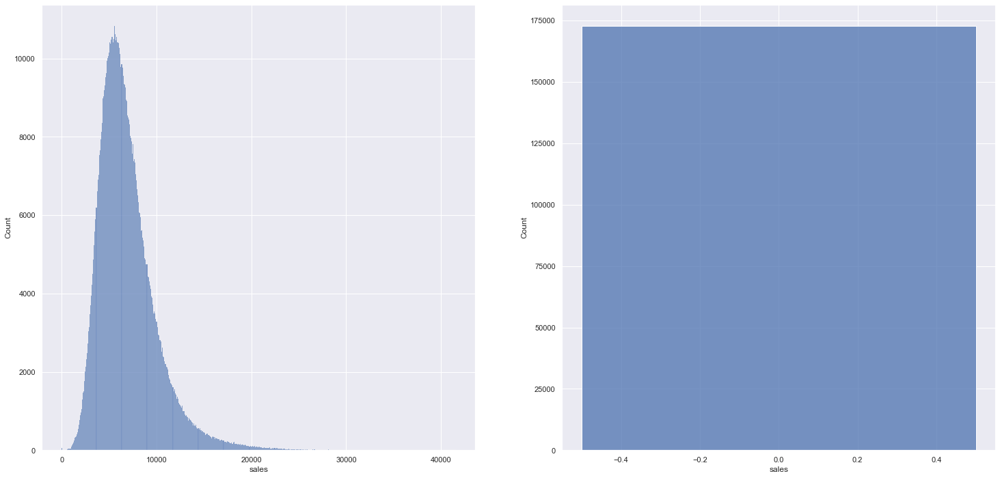

In [109]:
fig, axes = plt.subplots(1, 2)
aux1 = df1[(df1['sales']>=0) & (df1['open'] == '1')]
sns.histplot(aux1['sales'], ax=axes[0])
aux1 = df1[(df1['sales']>=0) & (df1['open'] == '0')]
sns.histplot(aux1['sales'], ax=axes[1]);

### 1.7.2 Categorical Attibutes

In [110]:
cat_attributes.apply( lambda x: x.unique().shape[0])

day_of_week                      7
open                             2
promo                            2
state_holiday                    4
school_holiday                   2
store_type                       4
assortment                       3
competition_open_since_month    12
competition_open_since_year     23
promo2                           2
promo2_since_week               25
promo2_since_year                8
promo_interval                   4
dtype: int64

In [72]:
cat_attributes.columns

Index(['day_of_week', 'open', 'promo', 'state_holiday', 'school_holiday',
       'store_type', 'assortment', 'competition_open_since_month',
       'competition_open_since_year', 'promo2', 'promo2_since_week',
       'promo2_since_year', 'promo_interval'],
      dtype='object')

#### Looking which day of week the stores are closed

In [111]:
aux1 = df1[df1['open'] == '0']
aux1.shape[0] / df1.shape[0]

0.16989330609540418

In [112]:
df1['state_holiday'].unique()

array(['0', 'a', 'b', 'c'], dtype=object)

<AxesSubplot:xlabel='day_of_week', ylabel='count'>

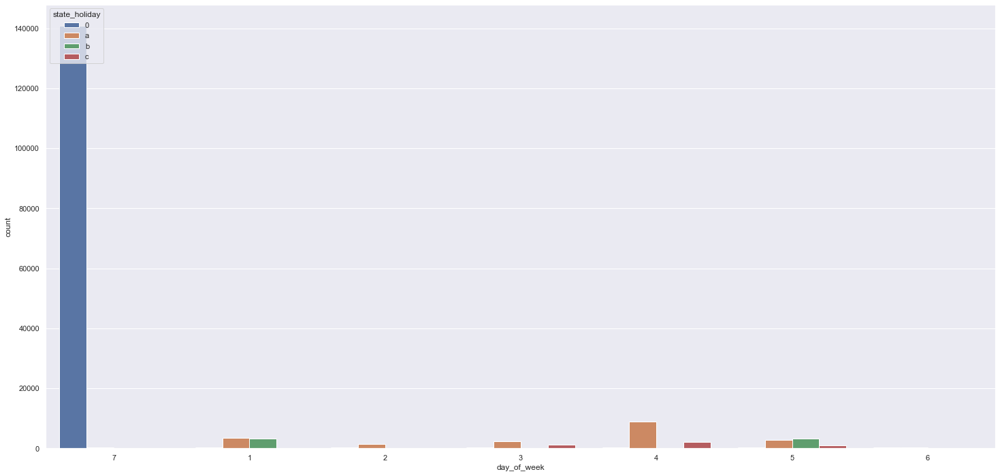

In [113]:
day_order = ['7','1','2','3','4','5','6']
sns.countplot(x='day_of_week', data=aux1, hue='state_holiday', order=day_order)

#### CATEGORICAL GRAPHS

<AxesSubplot:xlabel='promo', ylabel='sales'>

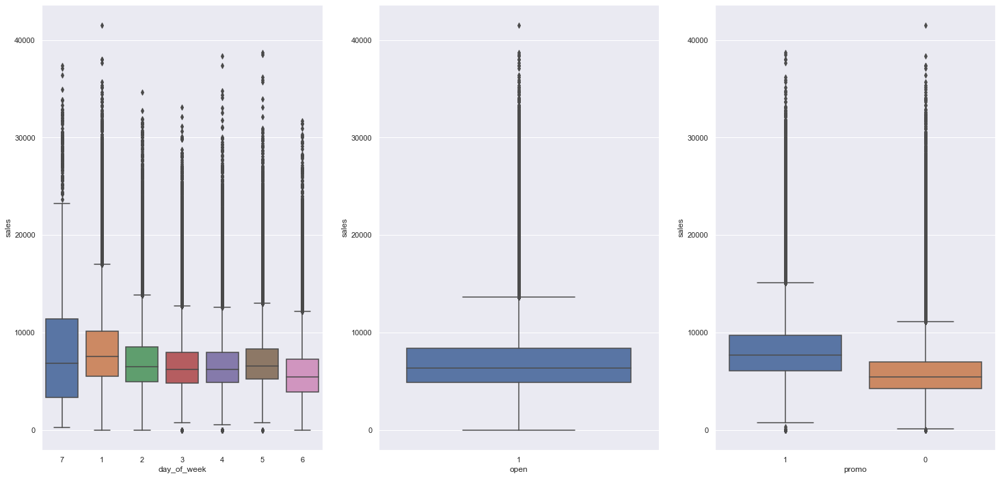

In [115]:
aux1=df1[(df1['open'] != '0')]
plt.subplot(1, 3, 1)
sns.boxplot(x='day_of_week' , y='sales', data=aux1, order=day_order)
plt.subplot(1, 3, 2)
sns.boxplot(x='open' , y='sales', data=aux1)
plt.subplot(1, 3, 3)
sns.boxplot(x='promo' , y='sales', data=aux1)

<AxesSubplot:xlabel='day_of_week', ylabel='sales'>

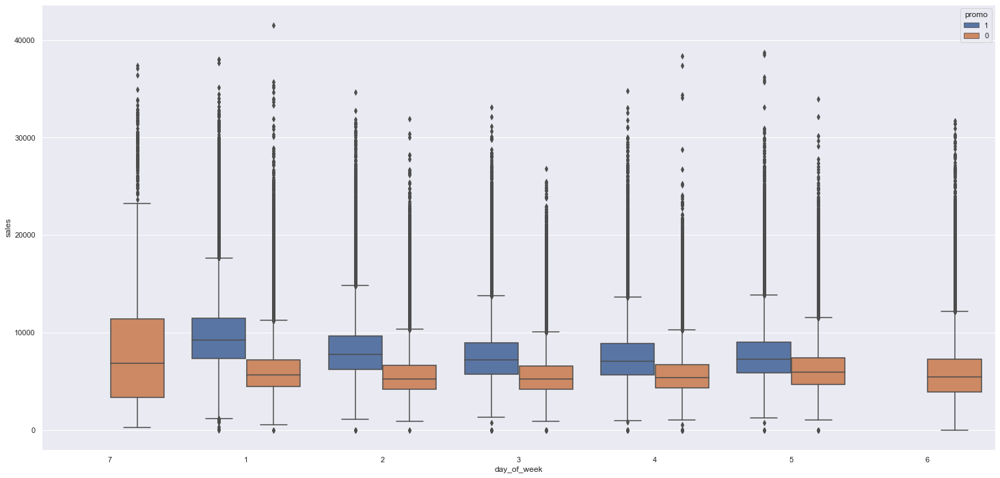

In [116]:
sns.boxplot(x='day_of_week' , y='sales', data=aux1, hue='promo', order=day_order)

* 'day_of_week' = the best meadian selling day is monday. the worst day is saturday.
* 'open' = nothing special.
* 'promo' = having promo is important to sell more (better median). But promo only happens during the weekday.

<AxesSubplot:xlabel='store_type', ylabel='sales'>

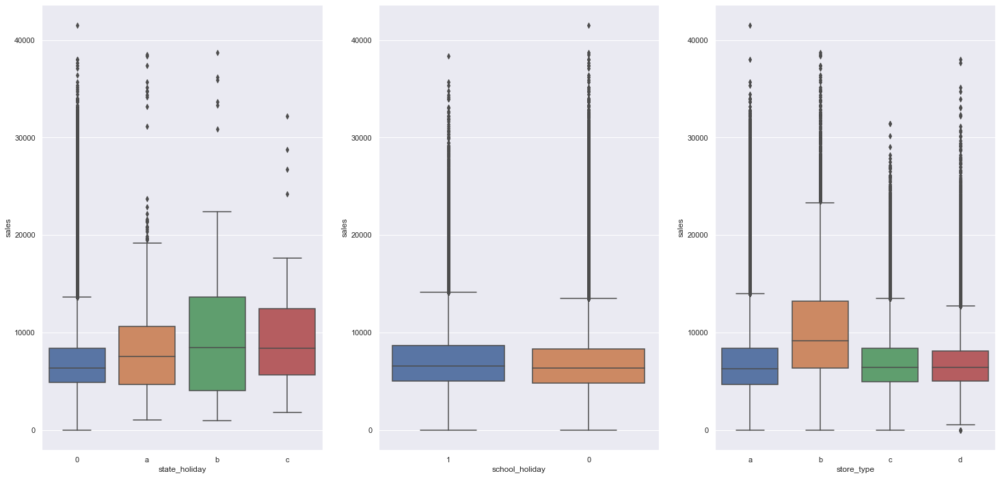

In [117]:
plt.subplot(1, 3, 1)
sns.boxplot(x='state_holiday' , y='sales', data=aux1)
plt.subplot(1, 3, 2)
sns.boxplot(x='school_holiday' , y='sales', data=aux1)
plt.subplot(1, 3, 3)
sns.boxplot(x='store_type' , y='sales', data=aux1, order=['a', 'b', 'c', 'd'])

* 'state_holiday' = easter holidays and Christimas have the best median, on these days people spend more.
* 'school_holiday' = there is no huge effect on sales when the school is closed
* 'store_type' = the best selling store is type B (median).

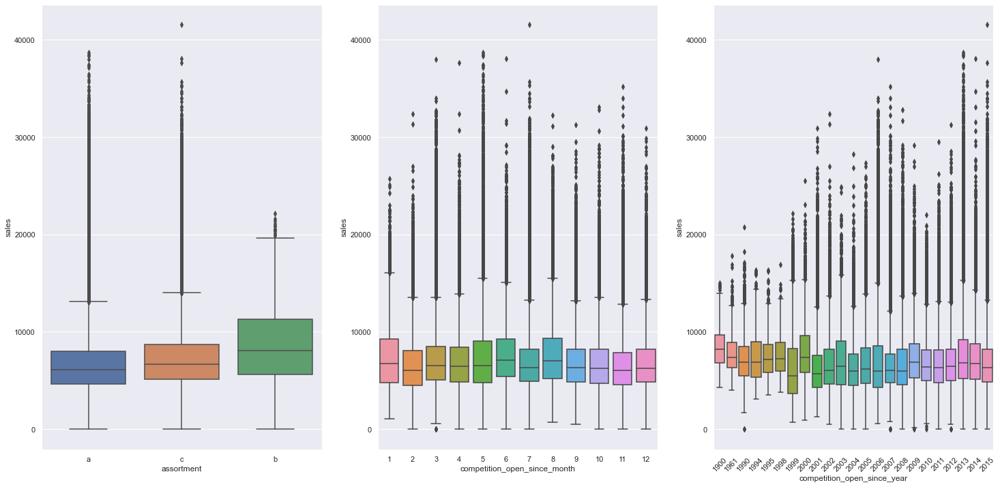

In [121]:
plt.subplot(1, 3, 1)
sns.boxplot(x='assortment' , y='sales', data=aux1)
aux2 = aux1.copy()
aux2['competition_open_since_month'] = aux2['competition_open_since_month'].astype('int64')
aux2['competition_open_since_year'] = aux2['competition_open_since_year'].astype('int64')
plt.subplot(1, 3, 2)
sns.boxplot(x='competition_open_since_month' , y='sales', data=aux2)
plt.subplot(1, 3, 3)
sns.boxplot(x='competition_open_since_year' , y='sales', data=aux2)
plt.xticks(rotation=45);
# 'promo2', 'promo2_since_week',
#       'promo2_since_year', 'promo_interval'

* 'assortment' = "b" assortment store have the best median. "c" is the second.
* 'competition_open_since_month' = the worst median is februrary (2), but it may be not related to competition, but it is a seasonal behavior.
* 'competition_open_since_year' = the longer the store are open (with competition) have better median.

<AxesSubplot:xlabel='promo2_since_year', ylabel='sales'>

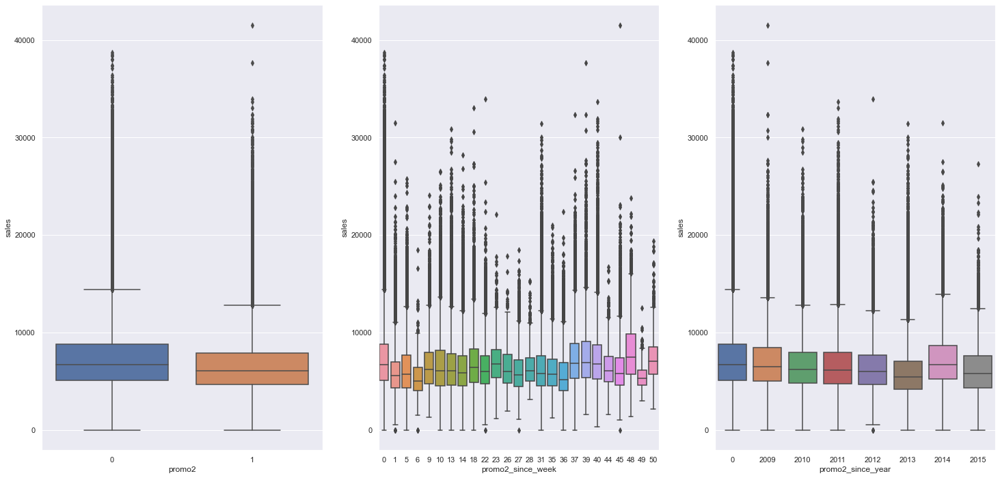

In [123]:
plt.subplot(1, 3, 1)
sns.boxplot(x='promo2' , y='sales', data=aux1)
aux2 = aux1.copy()
aux2['promo2_since_week'] = aux2['promo2_since_week'].astype('int64')
aux2['promo2_since_year'] = aux2['promo2_since_year'].astype('int64')
plt.subplot(1, 3, 2)
sns.boxplot(x='promo2_since_week' , y='sales', data=aux2)
plt.subplot(1, 3, 3)
sns.boxplot(x='promo2_since_year' , y='sales', data=aux2)
#'promo_interval'

* 'promo2' = store which have adopted promo2 have smaller median.
* 'promo2_since_week' = Week 45 has the best median. The worst is week 6
* 'promo2_since_year' = The best median is 0 and 2014.

<AxesSubplot:xlabel='day_of_week', ylabel='sales'>

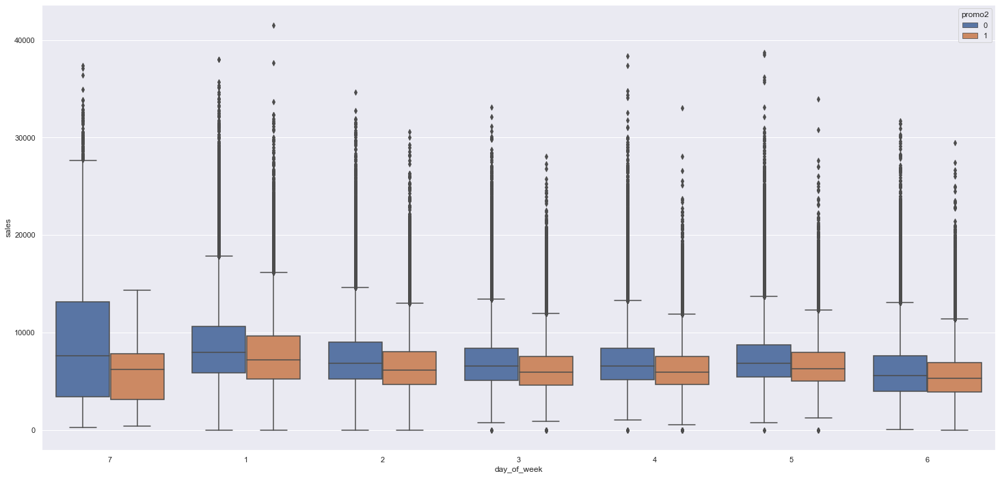

In [85]:
sns.boxplot(x='day_of_week' , y='sales', data=aux1, hue='promo2', order=day_order)

<AxesSubplot:xlabel='promo_interval', ylabel='sales'>

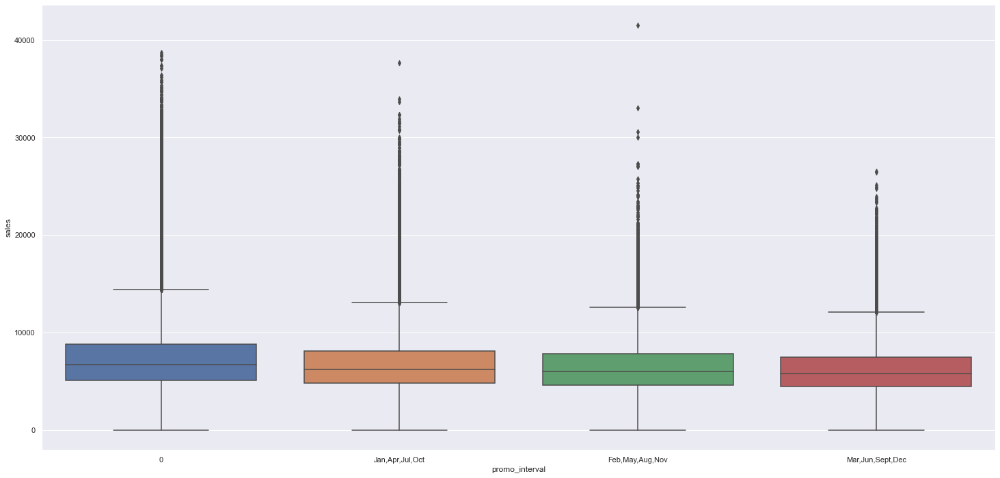

In [80]:
sns.boxplot(x='promo_interval' , y='sales', data=aux1)

In [124]:
df1.to_csv('dataset/C2/c02_01_rossman.csv', index=False)

# 2.0 FEATURE ENGINEERING

In [260]:
df2 = pd.read_csv('dataset/C2/c02_01_rossman.csv')
df2['date'] = pd.to_datetime(df2['date'])
df2.dtypes

C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\IPython\core\interactiveshell.py:3441: DtypeWarning: Columns (7) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


store                                    int64
day_of_week                              int64
date                            datetime64[ns]
sales                                    int64
customers                                int64
open                                     int64
promo                                    int64
state_holiday                           object
school_holiday                           int64
store_type                              object
assortment                              object
competition_distance                   float64
competition_open_since_month             int64
competition_open_since_year              int64
promo2                                   int64
promo2_since_week                        int64
promo2_since_year                        int64
promo_interval                          object
dtype: object

## 2.1 Hypotheses Mindmap

In [ ]:
Image('img/DAILY_STORE_SALES.png')

## 2.2 Hypotheses creation

In [17]:
df2 = df1.copy()

### 2.2.1 Hipótese Loja

**1.** Lojas com maior quadro de funcionarios deveriam vender mais.

**2.** Lojas com maior capacidade de estoque deveriam vender mais.

**3.** Lojas com maior porte deveriam vender mais.

**4.** Lojas com maior sortimento deveriam vender mais.

**5.** Lojas com competidores mais próximos deveriam vender menos

**6.** Lojas com competidores à mais tempo deveriam vender mais.

### 2.2.2 Hipótese Produto

**1.** Lojas que investem mais no Marketing deveriam vender mais.

**2.** Lojas que expõe mais o produto nas vitrines deveriam vender mais.

**3.** Lojas que tem preços menores nos produtos deveriam vender mais.

**5.** Lojas com promoções mais agressivas (desconto maiores) deveriam vender mais.

**6.** Lojas com promoções ativas por mais tempo deveria vender mais.

**7.** Lojas com mais dias de prmoção deveriam vender mais.

**8.** Lojas com mais promoções consecutivas deveriam vender mais.

### 2.2.3 Hipótese Tempo

**1.** Lojas abertas durante o feriado de Natal deveriam vender mais.

**2.** Lojas deveriam vender mais ao longo dos anos.

**3.** Lojas deveriam vender mais no segundo semestre do ano.

**4.** Lojas deveriam vender mais depois do dia 10 de cada mês.

**5.** Lojas deveriam vender menos nos finais de semana.

**6.** Lojas deveriam vender menos durante os feriados escolares.

## 2.3 Hypotheses Fina List

**1.** Lojas com maior sortimento deveriam vender mais.

**2.** Lojas com competidores mais próximos deveriam vender menos

**3.** Lojas com competidores à mais tempo deveriam vender mais.

**4.** Lojas com promoções ativas por mais tempo deveria vender mais.

**5.** Lojas com mais dias de prmoção deveriam vender mais.

**6.** Lojas com mais promoções consecutivas deveriam vender mais.

**7.** Lojas abertas durante o feriado de Natal deveriam vender mais.

**8.** Lojas deveriam vender mais ao longo dos anos.

**9.** Lojas deveriam vender mais no segundo semestre do ano.

**10.** Lojas deveriam vender mais depois do dia 10 de cada mês.

**11.** Lojas deveriam vender menos nos finais de semana.

**12.** Lojas deveriam vender menos durante os feriados escolares.

## 2.4 Feature Engineering

In [163]:
df2.head()

,store,day_of_week,date,sales,customers,open,promo,state_holiday,school_holiday,store_type,assortment,competition_distance,competition_open_since_month,competition_open_since_year,promo2,promo2_since_week,promo2_since_year,promo_interval,promo_since,promo_time_days,year_week,competition_since,competition_time_days
0,1,5,2015-07-31,5263,555,1,1,regular_day,1,c,basic,1270.0,9,2008,0,0,0,0,2015-07-31,0,2015-30,2008-09-01,2524
1,2,5,2015-07-31,6064,625,1,1,regular_day,1,a,basic,570.0,11,2007,1,13,2010,"Jan,Apr,Jul,Oct",2010-03-22,1957,2015-30,2007-11-01,2829
2,3,5,2015-07-31,8314,821,1,1,regular_day,1,a,basic,14130.0,12,2006,1,14,2011,"Jan,Apr,Jul,Oct",2011-03-28,1586,2015-30,2006-12-01,3164
3,4,5,2015-07-31,13995,1498,1,1,regular_day,1,c,extended,620.0,9,2009,0,0,0,0,2015-07-31,0,2015-30,2009-09-01,2159
4,5,5,2015-07-31,4822,559,1,1,regular_day,1,a,basic,29910.0,4,2015,0,0,0,0,2015-07-31,0,2015-30,2015-04-01,121


In [261]:
# customers
df2['ticket_by_store'] = df2['sales'] / df2['customers']
df2['ticket_by_store'] = df2['ticket_by_store'].apply(lambda x: 0 if pd.isna(x) else x)

In [262]:
# year week
df2['year_week'] = df2['date'].dt.strftime('%Y-%W')

# promo since
df2['promo2_since'] = df2['promo2_since_year'].astype(str) + '-' + df2['promo2_since_week'].astype(str)
df2['promo2_since'] = df2['promo2_since'].apply(lambda x: (datetime.datetime.strptime(x + '-1', '%Y-%W-%w') - datetime.timedelta(days=7)) if x != '0-0' else datetime.datetime(year=2015, month=7, day=31))
df2['promo2_time_days'] = df2.apply(lambda x: 0 if (x['date'] < x['promo2_since']) else (x['date'] - x['promo2_since']), axis=1)
df2['promo2_time_days'] = df2['promo2_time_days'].apply(lambda x: 0 if isinstance(x, int) else x.days).astype('int64')

# assortment
df2['assortment'] = df2['assortment'].apply(lambda x: 'basic' if x=='a' else 'extra' if x=='b' else 'extended')

# state holiday
df2['state_holiday'] = df2['state_holiday'].apply(lambda x: 'public holiday' if x=='a' else 'eastern_holiday' if x=='b' else 'christimas' if x=='c' else 'regular_day')

In [263]:
# competition since
df2['competition_since'] = df2.apply(lambda x: datetime.datetime(year=x['competition_open_since_year'], month=x['competition_open_since_month'], day=1), axis=1)
df2['competition_time_days'] = df2.apply(lambda x: 0 if (x['date'] < x['competition_since']) else (x['date'] - x['competition_since']), axis=1)
df2['competition_time_days'] = df2['competition_time_days'].apply( lambda x: 0 if isinstance(x, int) else x.days).astype('int64')

In [264]:
month_map = {1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun', 7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'}
df2['month_map'] = df2['date'].dt.month.map(month_map)

df2['promo2_on'] = df2[['promo_interval', 'month_map']].apply(lambda x: 0 if x['promo_interval']==0 else 1 if x['month_map'] in x['promo_interval'].split(',') else 0, axis=1)

In [265]:
df2['store_cat'] = df2['store_type'] + '-' + df2['assortment']

In [266]:
# year
df2['year'] = df2['date'].dt.year
# month
df2['month'] = df2['date'].dt.month
# day
df2['day'] = df2['date'].dt.day
# week of year
df2['week_of_year'] = df2['date'].dt.isocalendar().week
df2['week_of_year2'] = df2['date'].dt.isocalendar().year
df2['week_of_year'] = df2.apply(lambda x: str(x['week_of_year2']) + '/0' + str(x['week_of_year']) if x['week_of_year'] < 10 else str(x['week_of_year2']) + '/' + str(x['week_of_year']), axis=1)

In [267]:
df2 = df2.drop(['competition_open_since_month', 'competition_open_since_year', 
                'promo2_since_week', 'promo2_since_year', 'promo_interval',
                'year_week', 'promo2_since', 'competition_since', 'month_map', 'week_of_year2'
               ], axis=1)

In [255]:
df2.head().T

,0,1,2,3,4
store,1,2,3,4,5
day_of_week,5,5,5,5,5
date,2015-07-31 00:00:00,2015-07-31 00:00:00,2015-07-31 00:00:00,2015-07-31 00:00:00,2015-07-31 00:00:00
sales,5263,6064,8314,13995,4822
customers,555,625,821,1498,559
open,1,1,1,1,1
promo,1,1,1,1,1
state_holiday,regular_day,regular_day,regular_day,regular_day,regular_day
school_holiday,1,1,1,1,1
store_type,c,a,a,c,a


In [268]:
df2.to_csv('dataset/C2/c02_02_rossman.csv', index=False)

# 3.0 FEATURE FILTERING

In [401]:
df3 = pd.read_csv('dataset/C2/c02_02_rossman.csv')

In [402]:
df3.columns

Index(['store', 'day_of_week', 'date', 'sales', 'customers', 'open', 'promo',
       'state_holiday', 'school_holiday', 'store_type', 'assortment',
       'competition_distance', 'promo2', 'ticket_by_store', 'promo2_time_days',
       'competition_time_days', 'promo2_on', 'store_cat', 'year', 'month',
       'day', 'week_of_year'],
      dtype='object')

In [403]:
order = ['date', 'open', 'day_of_week', 'store', 'store_type', 'assortment', 'store_cat', 'sales', 'customers', 'ticket_by_store', 
         'state_holiday', 'school_holiday',
         'competition_time_days', 'competition_distance',
         'promo', 'promo2_on', 'promo2_time_days',
         'year', 'month', 'day', 'week_of_year'
        ]
df3 = df3[order]
df3.head(20)

,date,open,day_of_week,store,store_type,assortment,store_cat,sales,customers,ticket_by_store,state_holiday,school_holiday,competition_time_days,competition_distance,promo,promo2_on,promo2_time_days,year,month,day,week_of_year
0,2015-07-31,1,5,1,c,basic,c-basic,5263,555,9.482883,regular_day,1,2524,1270.0,1,0,0,2015,7,31,2015/31
1,2015-07-31,1,5,2,a,basic,a-basic,6064,625,9.702400,regular_day,1,2829,570.0,1,1,1957,2015,7,31,2015/31
2,2015-07-31,1,5,3,a,basic,a-basic,8314,821,10.126675,regular_day,1,3164,14130.0,1,1,1586,2015,7,31,2015/31
3,2015-07-31,1,5,4,c,extended,c-extended,13995,1498,9.342457,regular_day,1,2159,620.0,1,0,0,2015,7,31,2015/31
4,2015-07-31,1,5,5,a,basic,a-basic,4822,559,8.626118,regular_day,1,121,29910.0,1,0,0,2015,7,31,2015/31
5,2015-07-31,1,5,6,a,basic,a-basic,5651,589,9.594228,regular_day,1,607,310.0,1,0,0,2015,7,31,2015/31
6,2015-07-31,1,5,7,a,extended,a-extended,15344,1414,10.851485,regular_day,1,851,24000.0,1,0,0,2015,7,31,2015/31
7,2015-07-31,1,5,8,a,basic,a-basic,8492,833,10.194478,regular_day,1,303,7520.0,1,0,0,2015,7,31,2015/31
8,2015-07-31,1,5,9,a,extended,a-extended,8565,687,12.467249,regular_day,1,5477,2030.0,1,0,0,2015,7,31,2015/31
9,2015-07-31,1,5,10,a,basic,a-basic,7185,681,10.550661,regular_day,1,2159,3160.0,1,0,0,2015,7,31,2015/31


## 3.1. Row Filtering

In [20]:
# all lines will be selected

## 3.2. Column Filtering

In [250]:
#retirado o customers porque não dá para fazer uma projeção, sem fazer um modelo para isso (próximo ciclo?)
#cols_drop = ['customers']
#df3 = df3.drop(cols_drop, axis=1)

In [404]:
df3.columns

Index(['date', 'open', 'day_of_week', 'store', 'store_type', 'assortment',
       'store_cat', 'sales', 'customers', 'ticket_by_store', 'state_holiday',
       'school_holiday', 'competition_time_days', 'competition_distance',
       'promo', 'promo2_on', 'promo2_time_days', 'year', 'month', 'day',
       'week_of_year'],
      dtype='object')

In [405]:
df3.to_csv('dataset/C2/c02_03_rossman.csv', index=False)

# 4.0 EXPLORATORY DATA ANALYSIS

In [3]:
df4 = pd.read_csv('dataset/C2/c02_03_rossman.csv')
df4['date'] = pd.to_datetime(df4['date'])
df4.dtypes

date                     datetime64[ns]
open                              int64
day_of_week                       int64
store                             int64
store_type                       object
assortment                       object
store_cat                        object
sales                             int64
customers                         int64
ticket_by_store                 float64
state_holiday                    object
school_holiday                    int64
competition_time_days             int64
competition_distance            float64
promo                             int64
promo2_on                         int64
promo2_time_days                  int64
year                              int64
month                             int64
day                               int64
week_of_year                     object
dtype: object

In [4]:
num_attributes = df4.select_dtypes(include=('int64', 'float64'))
cat_attributes = df4.select_dtypes(exclude=('int64', 'float64', 'datetime64[ns]'))

## 4.1. UNIVARIABLE ANALYSIS

### 4.1.1. RESPONSE VARIABLE

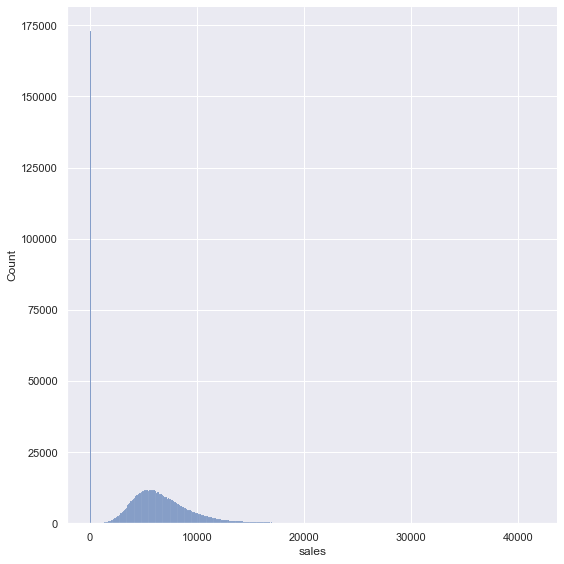

In [254]:
sns.set_theme(style="darkgrid")
sns.displot(df4['sales'], height=8)

### 4.1.2. NUMERICAL VARIABLE

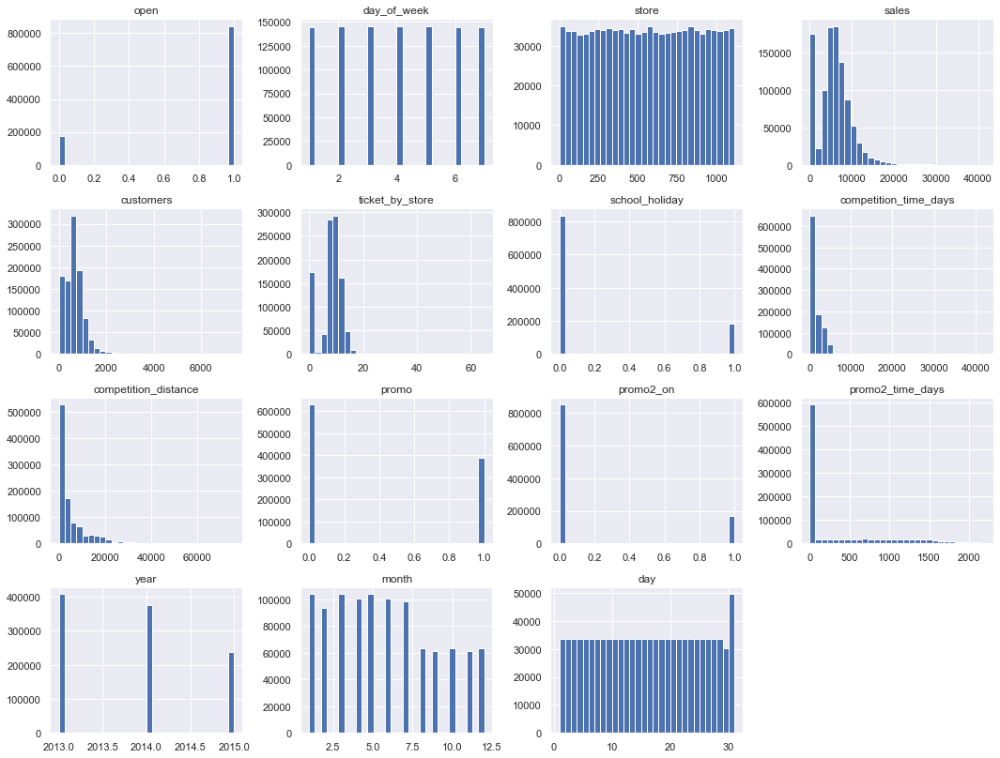

In [423]:
num_attributes.hist(bins=30, figsize = (18,14));
plt.show()

### 4.1.3. CATEGORICAL VARIABLE

In [415]:
cat_attributes.columns

Index(['store_type', 'assortment', 'store_cat', 'state_holiday',
       'week_of_year'],
      dtype='object')

C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
No handles with labels found to put in legend.


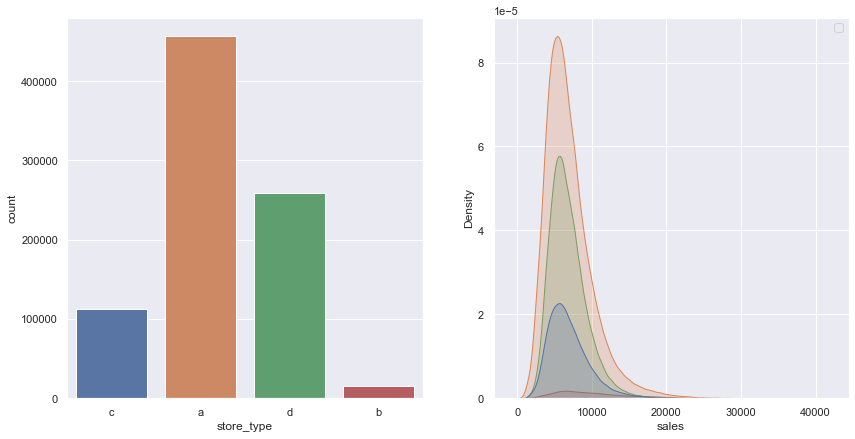

In [416]:
#store_type
plt.figure(figsize=(14, 7))
plt.subplot(1, 2, 1)
a = df4[(df4['sales']>0)]
sns.countplot(a['store_type'])

plt.subplot(1, 2, 2)
sns.kdeplot(data=a, x='sales', hue='store_type', shade=True)
plt.show()

C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


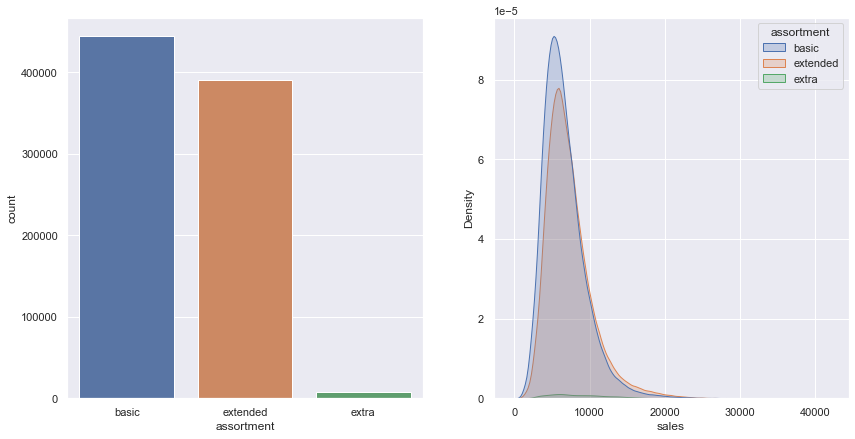

In [420]:
#assortment
plt.figure(figsize=(14, 7))
a = df4[(df4['sales']>0)]
plt.subplot(1, 2, 1)
sns.countplot(a['assortment'])

plt.subplot(1, 2, 2)
sns.kdeplot(data=a, x='sales', hue='assortment', shade=True)
plt.show()

C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


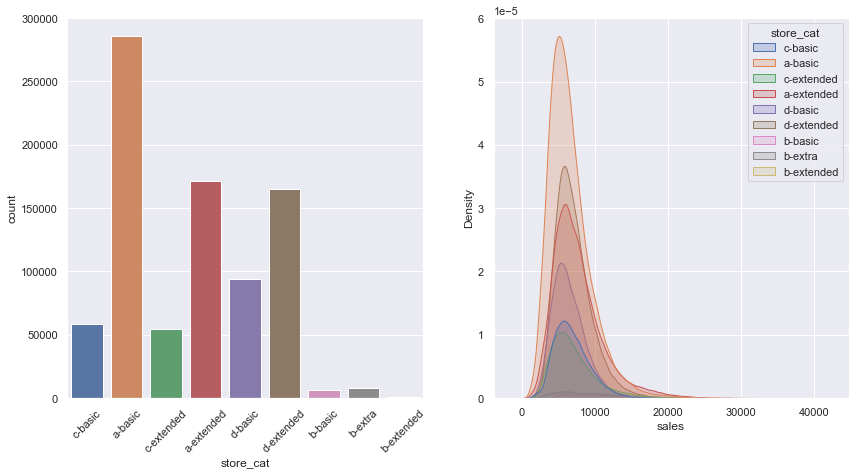

In [422]:
#store_cat
plt.figure(figsize=(14, 7))
a = df4[(df4['sales']>0)]
plt.subplot(1, 2, 1)
sns.countplot(a['store_cat'])
plt.xticks(rotation=45);

plt.subplot(1, 2, 2)
sns.kdeplot(data=a, x='sales', hue='store_cat', shade=True)
plt.show()

C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


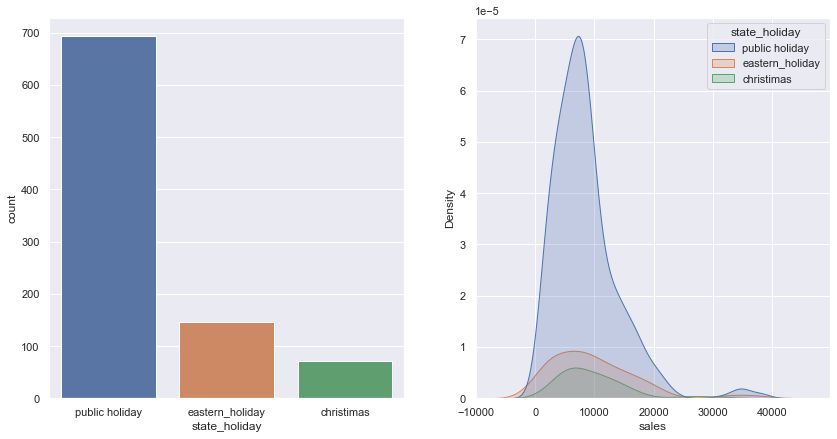

In [417]:
#state_holiday
plt.figure(figsize=(14, 7))
plt.subplot(1, 2, 1)
a = df4[(df4['state_holiday'] != 'regular_day') & (df4['sales']>0)]
sns.countplot(a['state_holiday'])

plt.subplot(1, 2, 2)
sns.kdeplot(data=a, x='sales', hue='state_holiday', shade=True)
plt.show()

## 4.2. BIVARIABLE ANALYSIS

In [275]:
df4.columns

Index(['date', 'open', 'day_of_week', 'store', 'store_type', 'assortment',
       'store_cat', 'assortment.1', 'sales', 'customers', 'ticket_by_store',
       'state_holiday', 'school_holiday', 'competition_time_days',
       'competition_distance', 'promo', 'promo2_on', 'promo2_time_days',
       'year', 'month', 'day', 'week_of_year'],
      dtype='object')

In [276]:
df4.head()

,date,open,day_of_week,store,store_type,assortment,store_cat,assortment.1,sales,customers,ticket_by_store,state_holiday,school_holiday,competition_time_days,competition_distance,promo,promo2_on,promo2_time_days,year,month,day,week_of_year
0,2015-07-31,1,5,1,c,basic,c-basic,basic,5263,555,9.482883,regular_day,1,2524,1270.0,1,0,0,2015,7,31,2015/31
1,2015-07-31,1,5,2,a,basic,a-basic,basic,6064,625,9.702400,regular_day,1,2829,570.0,1,1,1957,2015,7,31,2015/31
2,2015-07-31,1,5,3,a,basic,a-basic,basic,8314,821,10.126675,regular_day,1,3164,14130.0,1,1,1586,2015,7,31,2015/31
3,2015-07-31,1,5,4,c,extended,c-extended,extended,13995,1498,9.342457,regular_day,1,2159,620.0,1,0,0,2015,7,31,2015/31
4,2015-07-31,1,5,5,a,basic,a-basic,basic,4822,559,8.626118,regular_day,1,121,29910.0,1,0,0,2015,7,31,2015/31


#### H1. ASSORTMENT x SALES - The best selling store should have an 'extended' inventory - HIGH

**TRUE:** The mean ticket by day of extended assortment is higher than the others assortment types.

In [5]:
aux1 = df4[['store', 'sales', 'store_cat', 'customers', 'store_type', 'assortment']].groupby(['store', 'store_cat', 'store_type', 'assortment']).sum().reset_index()
aux1['total_records'] = df4[['store', 'sales', 'store_cat', 'customers', 'store_type', 'assortment']].groupby(['store', 'store_cat', 'store_type', 'assortment']).count().reset_index()['sales']
aux1['mean_ticket_day'] = aux1['sales'] / aux1['total_records']
aux1.sort_values('mean_ticket_day', ascending=False)

,store,store_cat,store_type,assortment,sales,customers,total_records,mean_ticket_day
261,262,b-basic,b,basic,19516842,3204694,942,20718.515924
816,817,a-basic,a,basic,17057867,2454370,942,18108.139066
561,562,b-extended,b,extended,16927322,2924960,942,17969.556263
1113,1114,a-extended,a,extended,16202585,2509542,942,17200.196391
250,251,a-extended,a,extended,14896870,1908934,942,15814.087049
841,842,d-extended,d,extended,11553523,714829,758,15242.114776
512,513,a-basic,a,basic,14252406,1643527,942,15129.942675
787,788,a-extended,a,extended,14082141,1346835,942,14949.194268
732,733,b-extra,b,extra,14067158,3206058,942,14933.288747
382,383,a-extended,a,extended,13489879,1720249,942,14320.466030


<AxesSubplot:xlabel='sales', ylabel='Count'>

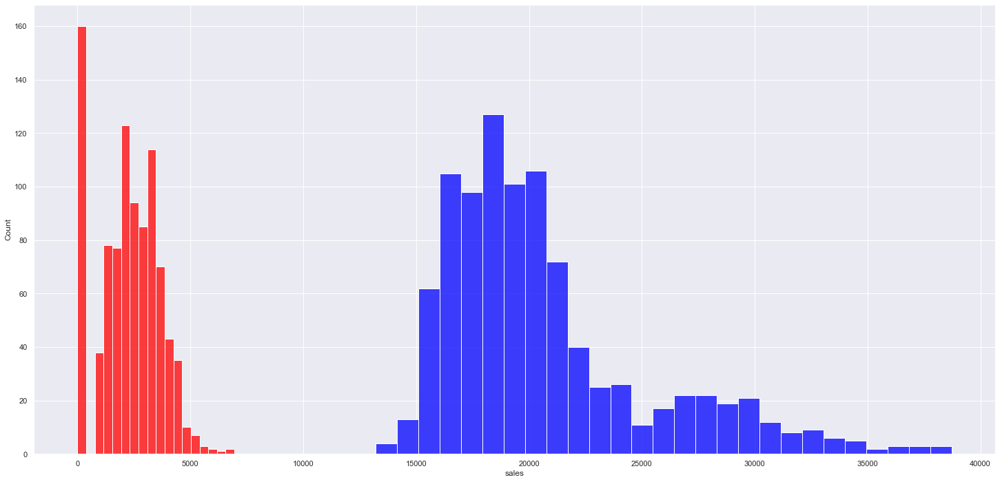

In [6]:
# BEST SELLING
sns.histplot(df4[df4['store'] == 262]['sales'], color='blue')
# WORST SELLING
sns.histplot(df4[df4['store'] == 307]['sales'], color='red')

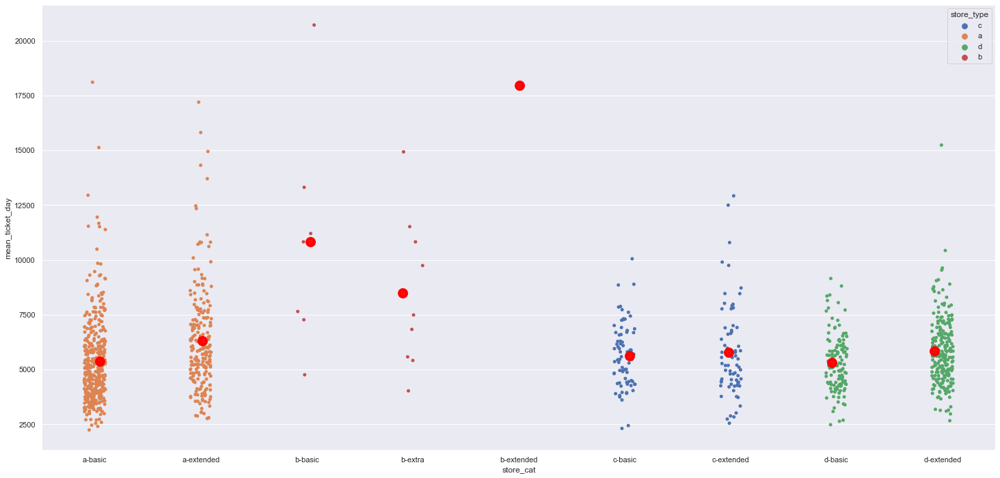

In [7]:
order = ['a-basic', 'a-extended',
         'b-basic', 'b-extra', 'b-extended', 
         'c-basic', 'c-extended', 
         'd-basic', 'd-extended']
aux1_m = aux1[['store_cat', 'assortment', 'mean_ticket_day']].groupby(['store_cat', 'assortment']).mean().reset_index()
sns.stripplot(data=aux1, x='store_cat',y='mean_ticket_day', hue='store_type', order=order);
sns.stripplot(data=aux1_m, x='store_cat',y='mean_ticket_day', order=order, linewidth=10, edgecolor='red',color='red');

In [10]:
aux1_m.groupby('assortment').mean()

,mean_ticket_day
assortment,
basic,6789.858344
extended,8975.017669
extra,8485.838783


#### H2. CUSTOMERS x SALES - Stores with a highest number of customer have the max selling value. - LOW

**FALSE:** It is not the first, but the second place have the highest selling value. There is a linear positive correlation and the range(total of customers) vary between stores type x assortment.

Store Type B have the most visit/day, and the lowest is Store Type D.


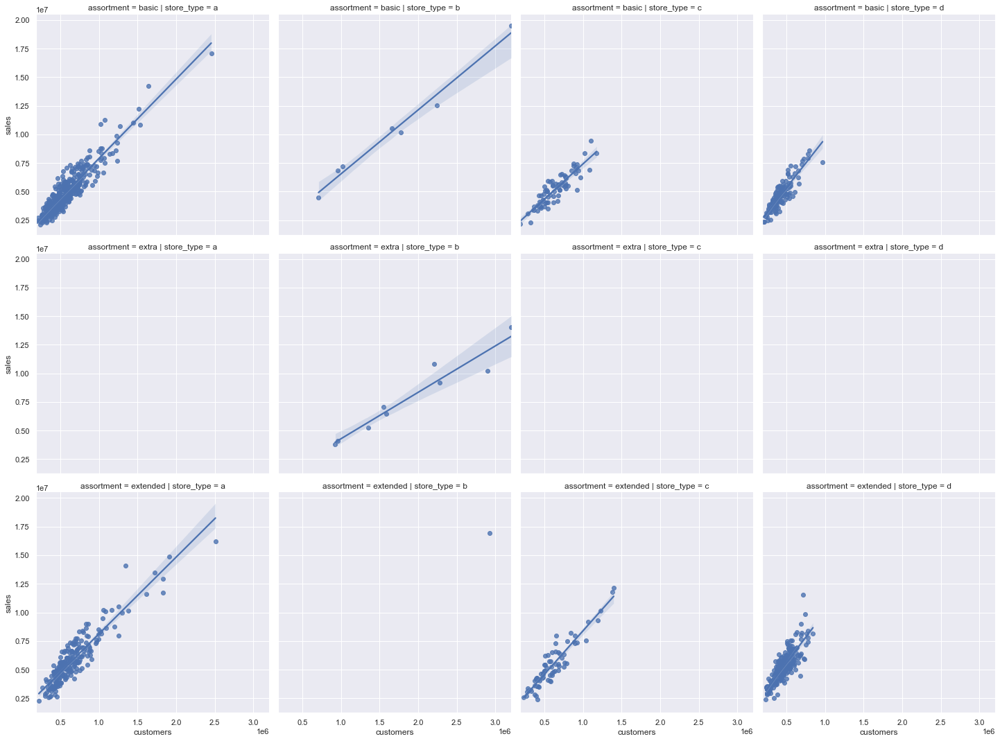

In [23]:
aux1 = df4[['store', 'sales', 'customers', 'assortment', 'store_type']].groupby(['store', 'assortment', 'store_type']).sum().reset_index().sort_values('customers', ascending=False)
sns.lmplot(x="customers", y="sales", data=aux1, col='store_type', row='assortment', col_order=['a', 'b', 'c', 'd'], row_order=['basic', 'extra', 'extended'])

* Store Type A

 - Assortment Basic / Extended - There is some high sales x customers
 
* Stores Type B

 - Assortment Basic / Extra - Wide Range of sell, small quantitities of stores

* Store Type C

 - Assortment Basic / Extended - Extended have a wide range of sales value.
 
* Store Type D

 - Assortment Basic / Extended - Limited range of sales values, but it shows a higher ticket per store.

In [14]:
aux1.max()

store             1115
assortment       extra
store_type           d
sales         19516842
customers      3206058
dtype: object

In [15]:
aux1

,store,assortment,store_type,sales,customers
732,733,extra,b,14067158,3206058
261,262,basic,b,19516842,3204694
561,562,extended,b,16927322,2924960
768,769,extra,b,10198000,2902351
1113,1114,extended,a,16202585,2509542
816,817,basic,a,17057867,2454370
1096,1097,extra,b,9179413,2280508
334,335,basic,b,12541731,2246936
258,259,extra,b,10851871,2210980
250,251,extended,a,14896870,1908934


###### CUSTOMERS VS STORE_TYPE

<AxesSubplot:xlabel='week', ylabel='customers_day'>

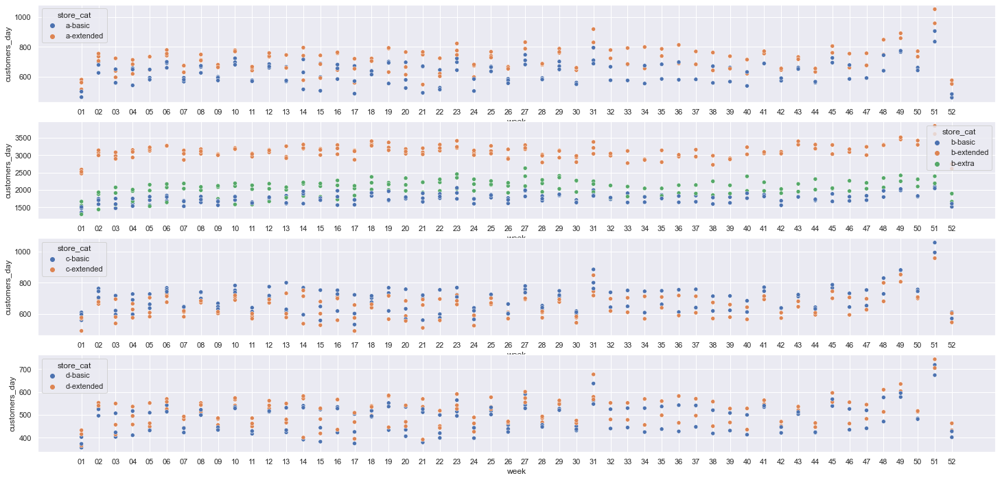

In [72]:
aux1 = df4[['customers', 'week_of_year', 'store_cat']].groupby(['week_of_year', 'store_cat']).sum().reset_index()
aux1['stores_t'] = df4[['customers', 'week_of_year', 'store_cat']].groupby(['week_of_year', 'store_cat']).count().reset_index()['customers']
aux1['customers_day'] = aux1['customers']/aux1['stores_t']
aux1['year'] = aux1['week_of_year'].apply(lambda x: x.split('/')[0])
aux1['week'] = aux1['week_of_year'].apply(lambda x: x.split('/')[1])
aux1['semester'] = aux1['week'].apply(lambda x: '01' if int(x) < 7 else '02')
aux1['semester_year'] = aux1['year'] + '/' + aux1['semester']

st_a = ['a-extended', 'a-basic']
st_b = ['b-extended', 'b-extra', 'b-basic']
st_c = ['c-extended', 'c-basic']
st_d = ['d-extended', 'd-basic']
aux_a = aux1[aux1['store_cat'].isin(st_a)]
aux_b = aux1[aux1['store_cat'].isin(st_b)]
aux_c = aux1[aux1['store_cat'].isin(st_c)]
aux_d = aux1[aux1['store_cat'].isin(st_d)]

plt, axes = plt.subplots(4, 1)
sns.scatterplot(data=aux_a, x='week', y='customers_day', hue='store_cat', ax=axes[0])
sns.scatterplot(data=aux_b, x='week', y='customers_day', hue='store_cat', ax=axes[1])
sns.scatterplot(data=aux_c, x='week', y='customers_day', hue='store_cat', ax=axes[2])
sns.scatterplot(data=aux_d, x='week', y='customers_day', hue='store_cat', ax=axes[3])

#### **H3.** COMPETITION DISTANCE x SALES - Stores with closest competitors should sell less. - HIGH

**FALSE:** Stores with closest competitors sells are higher.

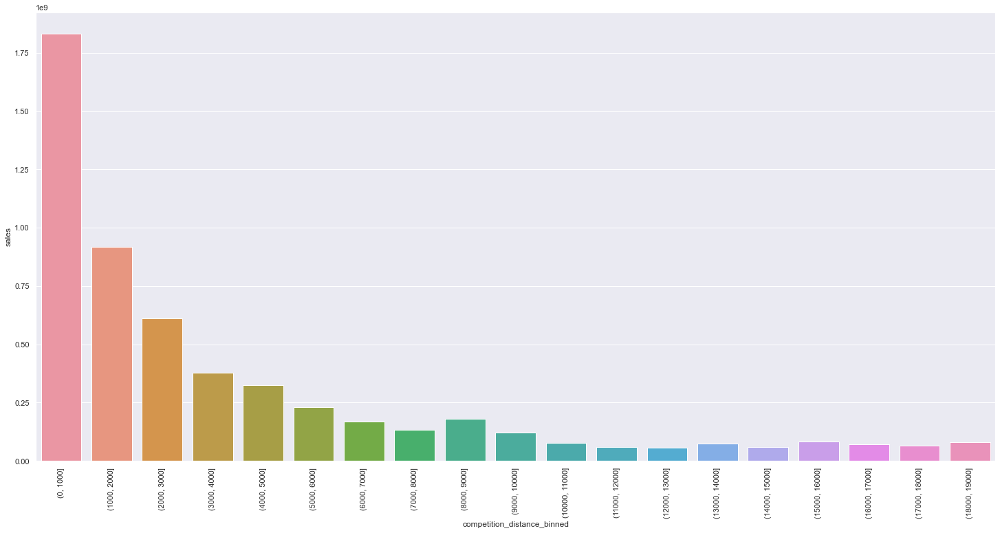

In [155]:
aux1 = df4[['competition_distance', 'sales']].groupby('competition_distance').sum().reset_index()
bins = list(np.arange(0, 20000, 1000))
aux1['competition_distance_binned'] = pd.cut(aux1['competition_distance'], bins=bins)
aux2 = aux1[['competition_distance_binned', 'sales']].groupby('competition_distance_binned').sum().reset_index()
sns.barplot(x='competition_distance_binned', y='sales', data=aux2);
plt.xticks(rotation=90);

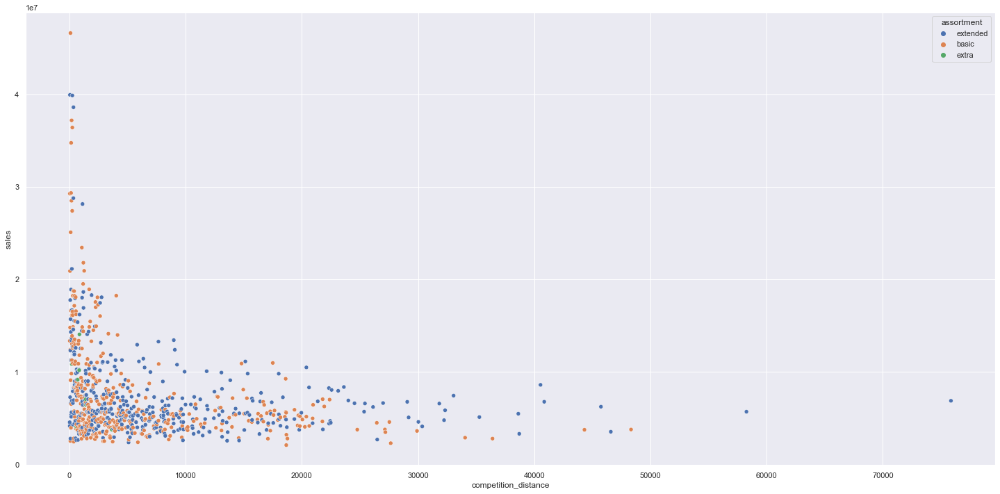

In [85]:
aux1 = df4[['competition_distance', 'sales', 'assortment']].groupby(['competition_distance', 'assortment']).sum().reset_index()
sns.scatterplot(x='competition_distance', y='sales', data=aux1, hue='assortment');

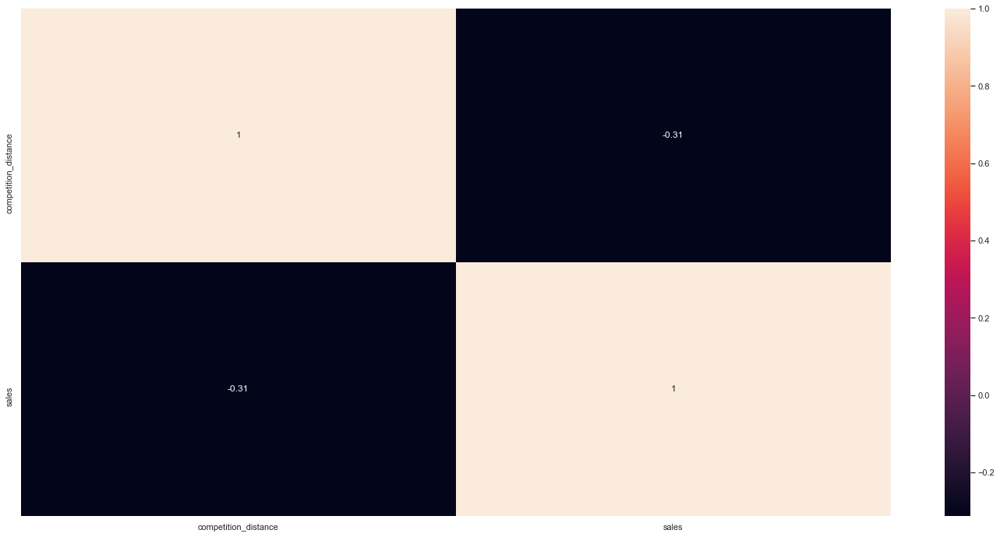

In [51]:
sns.heatmap(aux1.corr(method='pearson'), annot=True);
plt.show()

##### DISTANCE COMPETITION + STORE TYPE / ASSORTMENT vs SALES

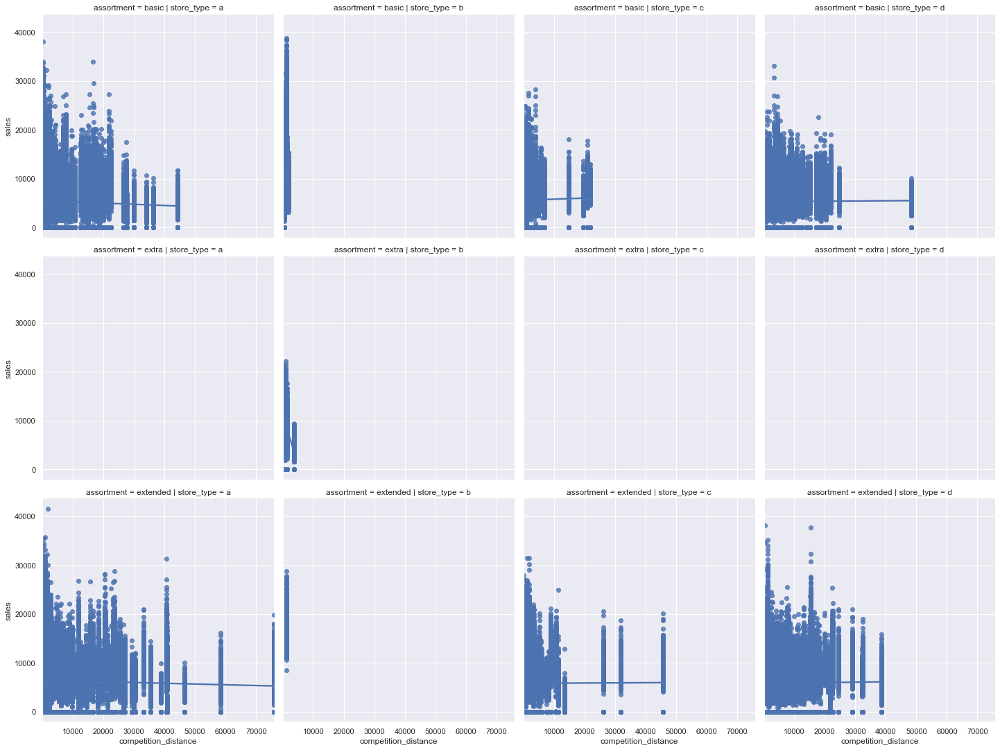

In [80]:
sns.lmplot(x="competition_distance", y="sales", data=df4, col='store_type', row='assortment', col_order=['a', 'b', 'c', 'd'], row_order=['basic', 'extra', 'extended'])

#### **H4.** COMPETITION TIME DAYS x SALES - Stores with competitors for long period should sell more. - HIGH

**FALSE:** Stores with competitors for long period should sell less.

In [176]:
df2['competition_open_since_year'].unique()

array([2008, 2007, 2006, 2009, 2015, 2013, 2014, 2000, 2011, 2010, 2005,
       1999, 2003, 2012, 2004, 2002, 1961, 1995, 2001, 1990, 1994, 1900,
       1998], dtype=int64)

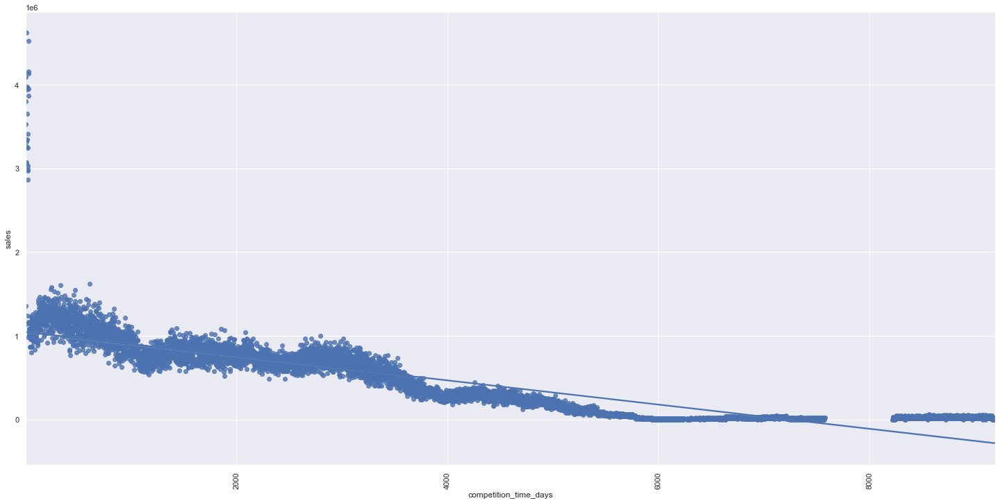

In [34]:
aux1 = df4[['competition_time_days', 'sales']].groupby('competition_time_days').sum().reset_index()
aux2 = aux1[(aux1['competition_time_days'] < 10000) & (aux1['competition_time_days'] !=0)]
sns.regplot(x='competition_time_days', y='sales', data=aux2);
plt.xticks(rotation=90);

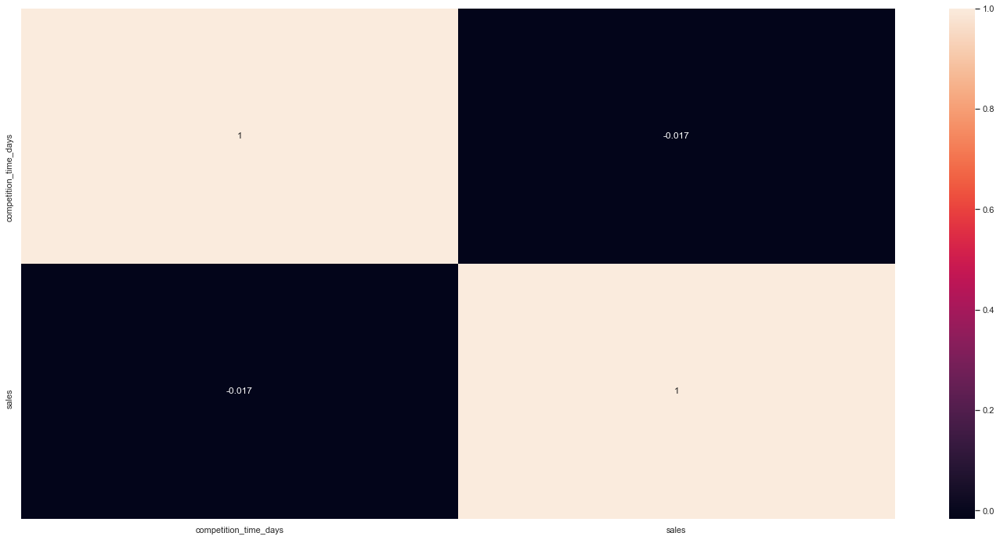

In [161]:
sns.heatmap(aux1.corr(method='pearson'), annot=True)
plt.show()

#### **H5.** PROMO2_ON x SALES - Stores with extended promo should sell more, compared to regular promo. - HIGH

**FALSE:**  Promo 2 (extended promo) does not sell more.

<AxesSubplot:xlabel='promo', ylabel='sales'>

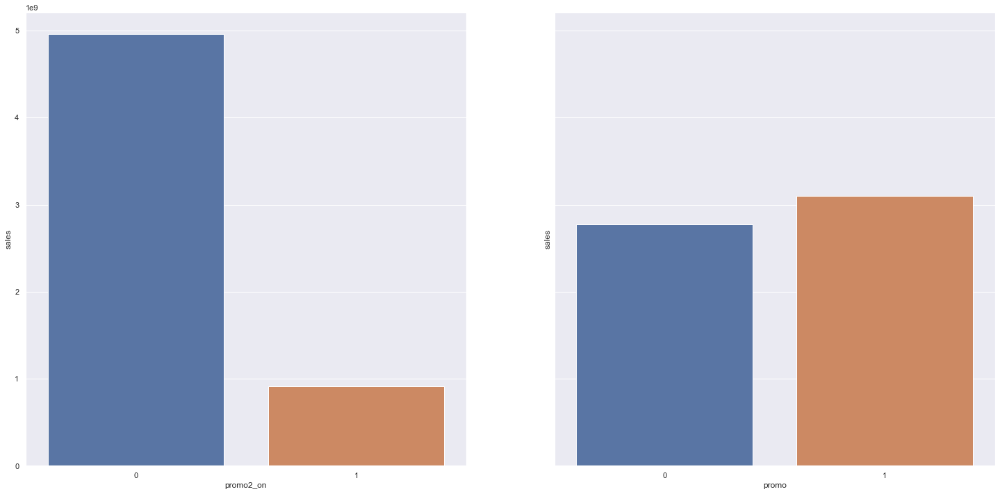

In [199]:
aux1 = df4[['promo2_on', 'sales']].groupby('promo2_on').sum().reset_index() #extended promo
aux2 = df4[['promo', 'sales']].groupby('promo').sum().reset_index() # regular promo

fig, axes = plt.subplots(1, 2, sharey=True)
sns.barplot(data=aux1, x='promo2_on', y='sales', ax=axes[0])
sns.barplot(data=aux2, x='promo', y='sales', ax=axes[1])

#### **H6.** PROMO + PROMO2_ON x SALE - Stores with consecutive promos should sell more. - HIGH

**FALSE:** Regular promos sell more than combining promo extended (promo2_on)

<AxesSubplot:xlabel='total_promo', ylabel='sales'>

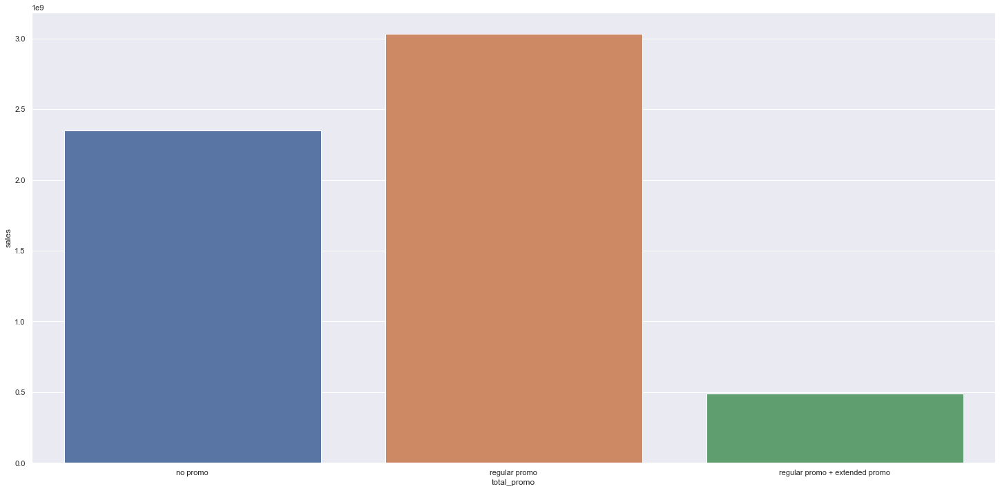

In [207]:
aux1 = df4.copy()
aux1['total_promo'] = df4['promo'] + df4['promo2_on']
promo_map = {0:'no promo', 1: 'regular promo', 2: 'regular promo + extended promo'}
aux1['total_promo'] = aux1['total_promo'].map(promo_map)
aux2 = aux1[['total_promo', 'sales']].groupby('total_promo').sum().reset_index()
sns.barplot(data=aux2, x='total_promo', y='sales')

#### **H7.** STATE HOLIDAY x SALES - Stores should sell more on Christmas. - LOW

**FALSE:** Christmas holiday sells less than the others

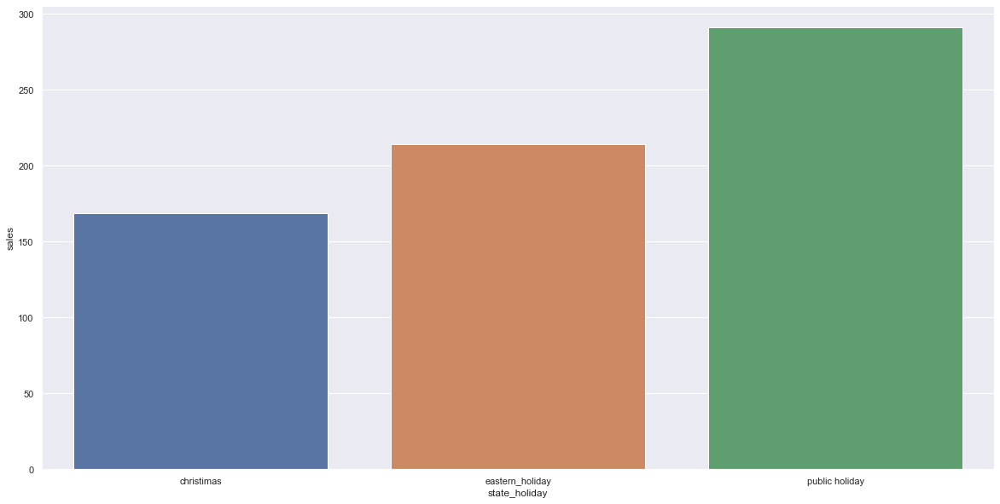

In [223]:
aux = df4[df4['state_holiday'] != 'regular_day']
aux1 = aux[['state_holiday', 'sales']].groupby('state_holiday').mean().reset_index()
plt.figure(figsize=(20, 10))
sns.barplot(x='state_holiday', y='sales', data=aux1);
plt.show()

#### **H8.** YEAR x SALES - Stores should perform better through time. - MEDIUM

**TRUE:** Stores perform better through time*

##### WRONG GRAPH - WITH MISSING PERIOD

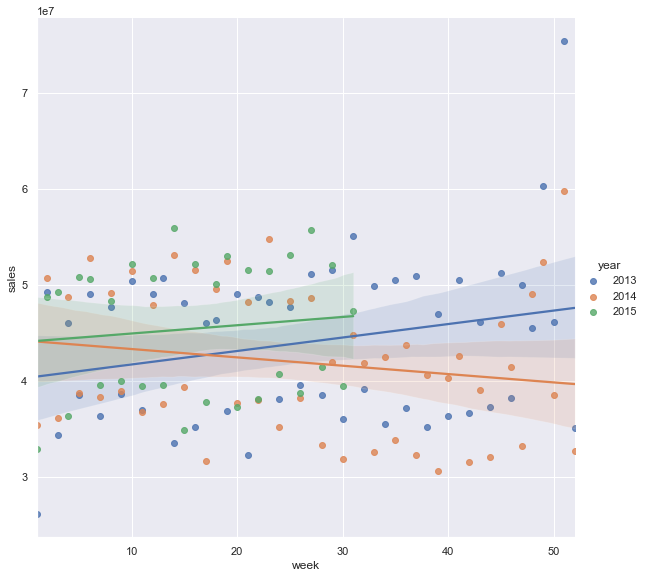

In [373]:
aux2013 = df4[df4['date'].dt.isocalendar().year == 2013]
a2013 = aux2013[['week_of_year', 'sales']].groupby('week_of_year').sum().reset_index()
week = np.arange(1, len(a2013)+1).tolist()
a2013['week'] = week
a2013['year'] = 2013

aux2014 = df4[df4['date'].dt.isocalendar().year == 2014]
a2014 = aux2014[['week_of_year', 'sales']].groupby('week_of_year').sum().reset_index()
week = np.arange(1, len(a2014)+1).tolist()
a2014['week'] = week
a2014['year'] = 2014

aux2015 = df4[df4['date'].dt.isocalendar().year == 2015]
a2015 = aux2015[['week_of_year', 'sales']].groupby('week_of_year').sum().reset_index()
week = np.arange(1, len(a2015)+1).tolist()
a2015['week'] = week
a2015['year'] = 2015

total = pd.concat([a2013, a2014, a2015], axis=0)

sns.lmplot(x='week', y='sales', data=total, hue='year', height=8);
# we would say that 2014 the sales were worst comparing the other years, but there is missing data of 1 semester of 2014.

##### Find the missing stores

In [375]:
x = df4[['date','store']].groupby('date').count().reset_index()
# between 2014/07/01 to 2014/12/31 there is missing data from 180 stores
x = x[x['store'] == 935]['date'] #total stores missing

df_t = pd.DataFrame()
for i in x.tolist():
    a = df4[df4['date'] == i]
    df_t = pd.concat([df_t, pd.Series(a['store'].unique())], axis=1)
    
df_t.columns = x.tolist()
df_t_t = df_t.copy().T
df_t_t['soma'] = df_t_t.sum(axis=1)

In [377]:
#verifing if there is some stores diferences between the days.
df_t_t['soma']

2014-07-01    524108
2014-07-02    524108
2014-07-03    524108
2014-07-04    524108
2014-07-05    524108
2014-07-06    524108
2014-07-07    524108
2014-07-08    524108
2014-07-09    524108
2014-07-10    524108
2014-07-11    524108
2014-07-12    524108
2014-07-13    524108
2014-07-14    524108
2014-07-15    524108
2014-07-16    524108
2014-07-17    524108
2014-07-18    524108
2014-07-19    524108
2014-07-20    524108
2014-07-21    524108
2014-07-22    524108
2014-07-23    524108
2014-07-24    524108
2014-07-25    524108
2014-07-26    524108
2014-07-27    524108
2014-07-28    524108
2014-07-29    524108
2014-07-30    524108
2014-07-31    524108
2014-08-01    524108
2014-08-02    524108
2014-08-03    524108
2014-08-04    524108
2014-08-05    524108
2014-08-06    524108
2014-08-07    524108
2014-08-08    524108
2014-08-09    524108
2014-08-10    524108
2014-08-11    524108
2014-08-12    524108
2014-08-13    524108
2014-08-14    524108
2014-08-15    524108
2014-08-16    524108
2014-08-17   

In [381]:
stores_selected = df_t_t.iloc[0,:-1].tolist()

##### CORRECTED GRAPH - REMOVED STORES WITH MISSING DATA

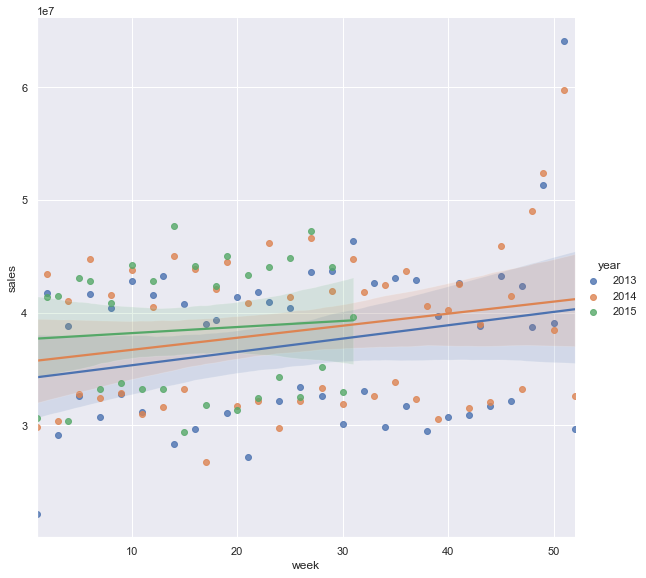

In [389]:
df4_selected = df4[df4['store'].isin(stores_selected)]

aux2013 = df4_selected[df4_selected['date'].dt.isocalendar().year == 2013]
a2013 = aux2013[['week_of_year', 'sales']].groupby('week_of_year').sum().reset_index()
week = np.arange(1, len(a2013)+1).tolist()
a2013['week'] = week
a2013['year'] = 2013

aux2014 = df4_selected[df4_selected['date'].dt.isocalendar().year == 2014]
a2014 = aux2014[['week_of_year', 'sales']].groupby('week_of_year').sum().reset_index()
week = np.arange(1, len(a2014)+1).tolist()
a2014['week'] = week
a2014['year'] = 2014

aux2015 = df4_selected[df4_selected['date'].dt.isocalendar().year == 2015]
a2015 = aux2015[['week_of_year', 'sales']].groupby('week_of_year').sum().reset_index()
week = np.arange(1, len(a2015)+1).tolist()
a2015['week'] = week
a2015['year'] = 2015

total = pd.concat([a2013, a2014, a2015], axis=0)

sns.lmplot(x='week', y='sales', data=total, hue='year', height=8);

#### **H9.** DAY OF WEEK x SALES - Stores should sell less on weekend.  - LOW

**TRUE:** Stores sell less on weekend.

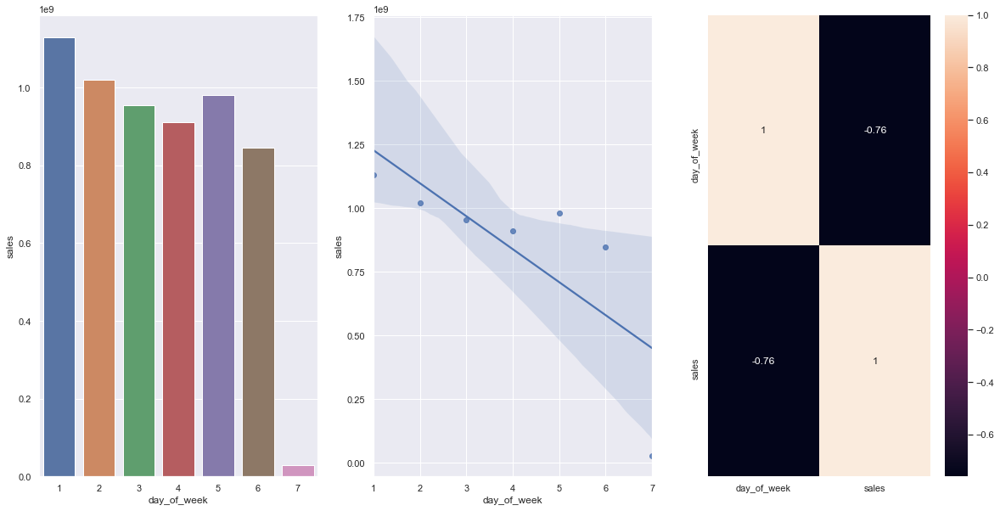

In [393]:
aux1 = df4[['day_of_week', 'sales']].groupby('day_of_week').sum().reset_index()

plt.figure(figsize=(20, 10))
plt.subplot(1,3,1)
sns.barplot(x='day_of_week', y='sales', data=aux1);

plt.subplot(1,3,2)
sns.regplot(x='day_of_week', y='sales', data=aux1);

plt.subplot(1,3,3)
sns.heatmap(aux1.corr(method='pearson'), annot=True);
plt.show()

#### **H10.** SCHOOL HOLIDAY x SALES - Stores should sell less during schools holidays. - LOW

**TRUE:** Stores should sell less during schools holidays, except on July and August.

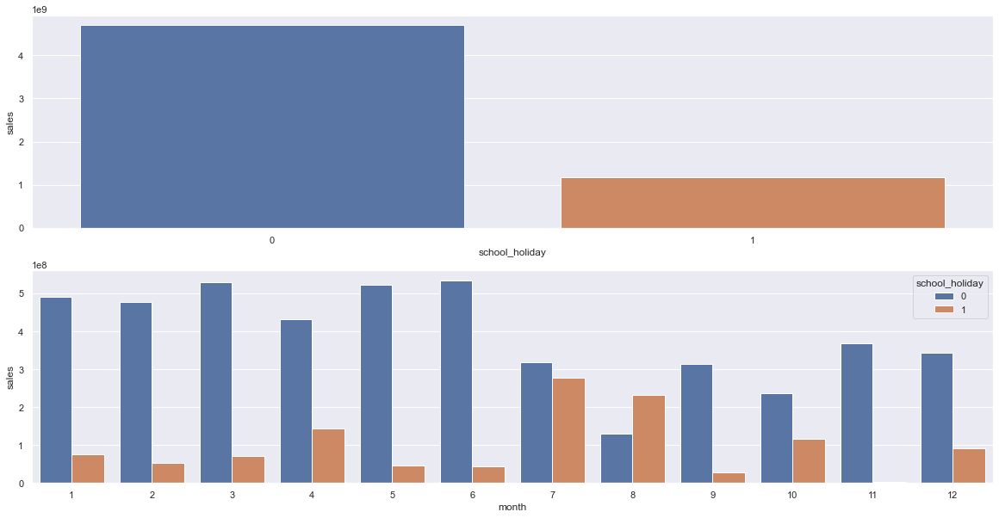

In [394]:
aux1 = df4[['school_holiday', 'sales']].groupby('school_holiday').sum().reset_index()
aux2 = df4[['month', 'school_holiday', 'sales']].groupby(['month', 'school_holiday']).sum().reset_index()

plt.figure(figsize=(20, 10))
plt.subplot(2,1,1)
sns.barplot(x='school_holiday', y='sales', data=aux1);

plt.subplot(2,1,2)
sns.barplot(x='month', y='sales', hue='school_holiday',data=aux2)
plt.show()

#### **H11.**OPEN x SALES - Stores open with no sells, should have open on school holiday / holidays. - LOW

**FALSE:** There is nothing can be explained why there is no sell when stores are open with no sell.

<AxesSubplot:xlabel='day_of_week', ylabel='sales'>

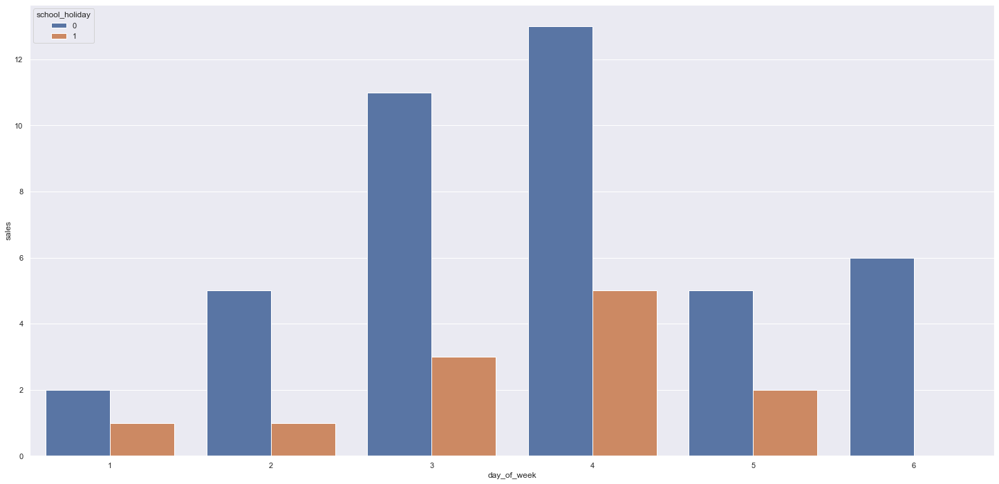

In [21]:
aux1 = df4[(df4['sales']==0) & df4['open']==1]
aux2 = aux1[['day_of_week', 'school_holiday', 'state_holiday', 'sales']].groupby(['day_of_week', 'school_holiday', 'state_holiday']).count().reset_index()
sns.barplot(data=aux2, x='day_of_week', y='sales', hue='school_holiday')

In [37]:
aux1.shape

(54, 21)

### 4.2.1 HYPOTHESES SUMMARY

In [24]:
from tabulate import tabulate

In [25]:
tab = [['HYPTOTHESES', 'CONCLUSION', 'RELEVANCE', 'FEATURE'],
      ['H1', 'TRUE', 'HIGH', 'ASSORTMENT'],
      ['H2', 'FALSE', 'LOW', 'CUSTOMERS'], 
      ['H3', 'FALSE', 'HIGH', 'COMPETITION DISTANCE'],
      ['H4', 'FALSE', 'HIGH', 'COMPETITION TIME DAYS'],
      ['H5', 'FALSE', 'HIGH', 'PROMO2_ON'],
      ['H6', 'FALSE', 'HIGH', 'PROMO + PROMO2_ON'], 
      ['H7', 'FALSE', 'LOW', 'STATE HOLIDAY'],
      ['H8', 'TRUE', 'MEDIUM', 'YEAR'],
      ['H9', 'TRUE', 'LOW', 'DAY OF WEEK'],
      ['H10', 'TRUE', 'LOW', 'SCHOOL HOLIDAY'],
      ['H11', 'FALSE', 'LOW', 'OPEN']
      ]
print(tabulate(tab, headers='firstrow'))

HYPTOTHESES    CONCLUSION    RELEVANCE    FEATURE
-------------  ------------  -----------  ---------------------
H1             TRUE          HIGH         ASSORTMENT
H2             FALSE         LOW          CUSTOMERS
H3             FALSE         HIGH         COMPETITION DISTANCE
H4             FALSE         HIGH         COMPETITION TIME DAYS
H5             FALSE         HIGH         PROMO2_ON
H6             FALSE         HIGH         PROMO + PROMO2_ON
H7             FALSE         LOW          STATE HOLIDAY
H8             TRUE          MEDIUM       YEAR
H9             TRUE          LOW          DAY OF WEEK
H10            TRUE          LOW          SCHOOL HOLIDAY
H11            FALSE         LOW          OPEN


## 4.3. MULTIVARIABLE ANALYSIS

### 4.3.1. NUMERICAL ATTIBUTES

<AxesSubplot:>

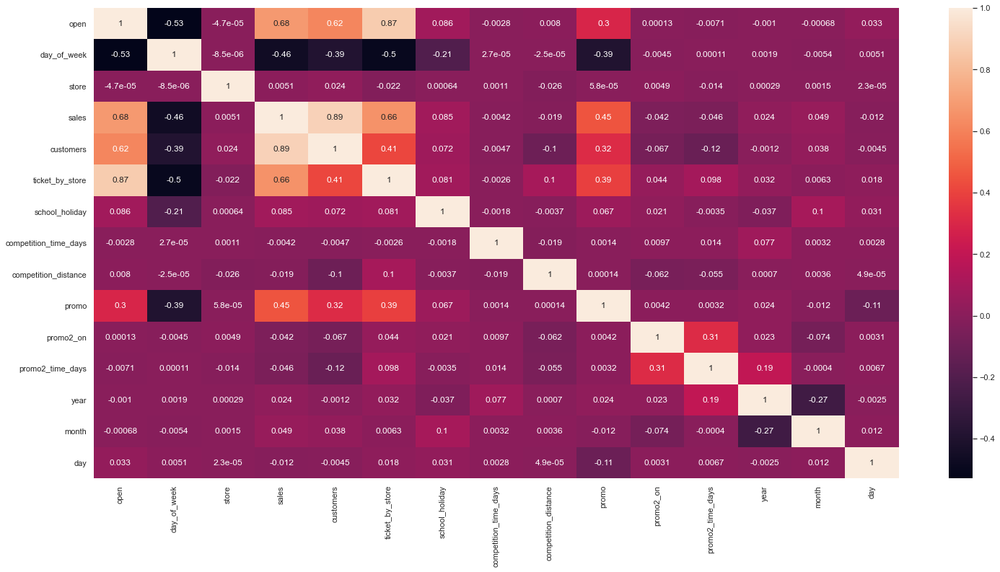

In [88]:
correlation = num_attributes.corr(method ='pearson')
sns.heatmap(correlation, annot=True)

### 4.3.2. CATEGORICAL ATTRIBUTES

In [408]:
a = df4.select_dtypes(include='object')
a.head()

,store_type,assortment,store_cat,state_holiday,week_of_year
0,c,basic,c-basic,regular_day,2015/31
1,a,basic,a-basic,regular_day,2015/31
2,a,basic,a-basic,regular_day,2015/31
3,c,extended,c-extended,regular_day,2015/31
4,a,basic,a-basic,regular_day,2015/31


<AxesSubplot:>

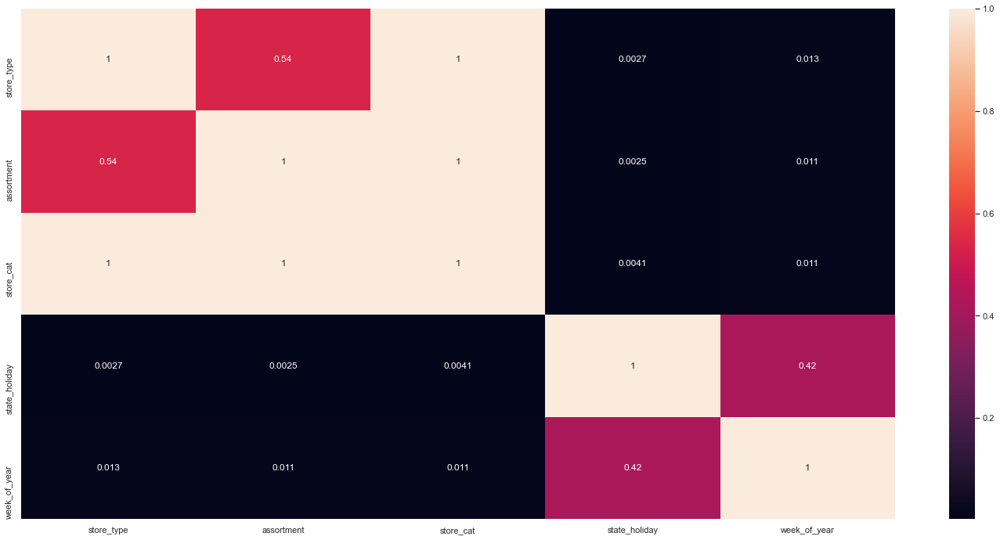

In [410]:
a1 = cramer_v(a['store_type'], a['store_type'])
a2 = cramer_v(a['store_type'], a['assortment'])
a3 = cramer_v(a['store_type'], a['store_cat'])
a4 = cramer_v(a['store_type'], a['state_holiday'])
a5 = cramer_v(a['store_type'], a['week_of_year'])

a6 = cramer_v(a['assortment'],  a['store_type'])
a7 = cramer_v(a['assortment'],  a['assortment'])
a8 = cramer_v(a['assortment'],  a['store_cat'])
a9 = cramer_v(a['assortment'],  a['state_holiday'])
a10 = cramer_v(a['assortment'], a['week_of_year'])

a11 = cramer_v(a['store_cat'],  a['store_type'])
a12 = cramer_v(a['store_cat'],  a['assortment'])
a13 = cramer_v(a['store_cat'],  a['store_cat'])
a14 = cramer_v(a['store_cat'],  a['state_holiday'])
a15 = cramer_v(a['store_cat'], a['week_of_year'])

a16 = cramer_v(a['state_holiday'],  a['store_type'])
a17 = cramer_v(a['state_holiday'],  a['assortment'])
a18 = cramer_v(a['state_holiday'],  a['store_cat'])
a19 = cramer_v(a['state_holiday'],  a['state_holiday'])
a20 = cramer_v(a['state_holiday'], a['week_of_year'])

a21 = cramer_v(a['week_of_year'],  a['store_type'])
a22 = cramer_v(a['week_of_year'],  a['assortment'])
a23 = cramer_v(a['week_of_year'],  a['store_cat'])
a24 = cramer_v(a['week_of_year'],  a['state_holiday'])
a25 = cramer_v(a['week_of_year'], a['week_of_year'])

d = pd.DataFrame({'store_type' : [a1, a2, a3, a4, a5],
                  'assortment' : [a6, a7, a8, a9, a10],
                  'store_cat' : [a11, a12, a13, a14, a15],
                  'state_holiday' : [a16, a17, a18, a19, a20],
                  'week_of_year' : [a21, a22, a23, a24, a25]
                  })
d = d.set_index(d.columns)
sns.heatmap(d, annot=True)

In [89]:
df4.to_csv('dataset/C2/c02_04_rossman.csv', index=False)

# 5.0 DATA PREPARATION

In [42]:
df5 = pd.read_csv('dataset/C2/c02_04_rossman.csv')
df5['date'] = pd.to_datetime(df5['date'])
df5['school_holiday'] = df5['school_holiday'].astype('str')
df5['promo'] = df5['promo'].astype('str')
df5['promo2_on'] = df5['promo2_on'].astype('str')
df5.dtypes

date                     datetime64[ns]
open                              int64
day_of_week                       int64
store                             int64
store_type                       object
assortment                       object
store_cat                        object
sales                             int64
customers                         int64
ticket_by_store                 float64
state_holiday                    object
school_holiday                   object
competition_time_days             int64
competition_distance            float64
promo                            object
promo2_on                        object
promo2_time_days                  int64
year                              int64
month                             int64
day                               int64
week_of_year                     object
dtype: object

In [35]:
df5.shape

(1017209, 21)

### 5.0.0 REMOVING OPEN FEATURE

In [44]:
df5 = df5[(df5['open']==1) & (df5['sales']>0)]
df5 = df5.drop('open', axis=1)
df5.shape

(844338, 20)

## 5.1. NORMALIZAÇÃO

In [ ]:
# Não temos variáveis potenciais para normalização.

In [45]:
num_attributes = df5.select_dtypes(include=('int64', 'float64'))
cat_attributes = df5.select_dtypes(exclude=('int64', 'float64', 'datetime64[ns]'))

In [96]:
num_attributes.head()

,day_of_week,store,sales,customers,ticket_by_store,competition_time_days,competition_distance,promo2_time_days,year,month,day
0,5,1,5263,555,9.482883,2524,1270.0,0,2015,7,31
1,5,2,6064,625,9.702400,2829,570.0,1957,2015,7,31
2,5,3,8314,821,10.126675,3164,14130.0,1586,2015,7,31
3,5,4,13995,1498,9.342457,2159,620.0,0,2015,7,31
4,5,5,4822,559,8.626118,121,29910.0,0,2015,7,31


## 5.2. RESCALLING

In [46]:
a = df5.select_dtypes(include=['int64', 'float64'])
a.describe().T

,count,mean,std,min,25%,50%,75%,max
day_of_week,844338.0,3.520350,1.723712,1.000000,2.000000,3.00,5.000000,7.000000
store,844338.0,558.421374,321.730861,1.000000,280.000000,558.00,837.000000,1115.000000
sales,844338.0,6955.959134,3103.815515,46.000000,4859.000000,6369.00,8360.000000,41551.000000
customers,844338.0,762.777166,401.194153,8.000000,519.000000,676.00,893.000000,7388.000000
ticket_by_store,844338.0,9.493641,2.197448,2.749075,7.895571,9.25,10.899729,64.957854
competition_time_days,844338.0,1285.941583,1987.923252,0.000000,0.000000,508.00,2229.000000,42214.000000
competition_distance,844338.0,5458.083730,7799.457214,20.000000,710.000000,2330.00,6880.000000,75860.000000
promo2_time_days,844338.0,399.767541,580.390604,0.000000,0.000000,0.00,764.000000,2195.000000
year,844338.0,2013.831945,0.777271,2013.000000,2013.000000,2014.00,2014.000000,2015.000000
month,844338.0,5.845774,3.323959,1.000000,3.000000,6.00,8.000000,12.000000


In [47]:
rs = RobustScaler(unit_variance=False) #rescalling with IQR - stronger with outliers
mms = MinMaxScaler() #senstive with outliers

#competition distance
df5['competition_distance'] = rs.fit_transform(df5[['competition_distance']].values)
pickle.dump(rs, open('parameter/C02/competition_distance_scaler.pkl', 'wb'))

#competition time days
df5['competition_time_days'] = rs.fit_transform(df5[['competition_time_days']].values)
pickle.dump(rs, open('parameter/C02/competition_time_days_scaler.pkl', 'wb'))

#promo time days
df5['promo2_time_days'] = mms.fit_transform(df5[['promo2_time_days']].values)
pickle.dump(rs, open('parameter/C02/promo2_time_days_scaler.pkl', 'wb'))

In [48]:
a = df5.select_dtypes(include=['int64', 'float64'])
a.describe().T

,count,mean,std,min,25%,50%,75%,max
day_of_week,844338.0,3.520350,1.723712,1.000000,2.000000,3.00,5.000000,7.000000
store,844338.0,558.421374,321.730861,1.000000,280.000000,558.00,837.000000,1115.000000
sales,844338.0,6955.959134,3103.815515,46.000000,4859.000000,6369.00,8360.000000,41551.000000
customers,844338.0,762.777166,401.194153,8.000000,519.000000,676.00,893.000000,7388.000000
ticket_by_store,844338.0,9.493641,2.197448,2.749075,7.895571,9.25,10.899729,64.957854
competition_time_days,844338.0,0.349009,0.891845,-0.227905,-0.227905,0.00,0.772095,18.710633
competition_distance,844338.0,0.506983,1.264094,-0.374392,-0.262561,0.00,0.737439,11.917342
promo2_time_days,844338.0,0.182126,0.264415,0.000000,0.000000,0.00,0.348064,1.000000
year,844338.0,2013.831945,0.777271,2013.000000,2013.000000,2014.00,2014.000000,2015.000000
month,844338.0,5.845774,3.323959,1.000000,3.000000,6.00,8.000000,12.000000


## 5.3. TRANSFORMAÇÃO

https://towardsdatascience.com/all-about-categorical-variable-encoding-305f3361fd02

- Conversão de Feature Categórica para numéricas (Encoding)
- Transformação de natureza

* **One Hot Encoding** - Possui diversos níveis e cria colunas indicando onde acontece. Tem a desvantagem de criar muitas colunas.
* **Label Encoding** - Trocar os níveis por número. Exemplo: hot-1, warm-2...
* **Ordinal Encoding** - Parecido com o label, porém uma ordem/hierarquia é respeitada.
* **Target Encoding** - Muitos níveis. Divide a qtd de frequências pela média.
* **Frequency Encoding** - Muitos níveis. Conta a frequência e divide.
* **Embedding Encoding** - Utilizado na NLP. Baseado em redes neurais profundas.

In [102]:
cat_attributes.head()

,open,store_type,assortment,store_cat,state_holiday,school_holiday,promo,promo2_on,week_of_year
0,1,c,basic,c-basic,regular_day,1,1,0,2015/31
1,1,a,basic,a-basic,regular_day,1,1,1,2015/31
2,1,a,basic,a-basic,regular_day,1,1,1,2015/31
3,1,c,extended,c-extended,regular_day,1,1,0,2015/31
4,1,a,basic,a-basic,regular_day,1,1,0,2015/31


### 5.3.1 ENCODING

In [49]:
#store type - Label Encoding
le_st = LabelEncoder()
df5['store_type'] = le_st.fit_transform(df5['store_type'])
pickle.dump(le_st, open('parameter/C02/store_type_scaler.pkl', 'wb'))

#assortment - Oridinal Encoding
assortment_dict = {'basic': 1, 'extra' : 2, 'extended' : 3}
df5['assortment'] = df5['assortment'].map(assortment_dict)

#store_cat
le_cat = LabelEncoder()
df5['store_cat'] = le_cat.fit_transform(df5['store_cat'])
pickle.dump(le_cat, open('parameter/C02/store_cat_scaler.pkl', 'wb'))

# state_holiday - One Hot Encoding
le_sh = LabelEncoder()
df5['state_holiday'] = le_sh.fit_transform(df5['state_holiday'])
pickle.dump(le_sh, open('parameter/C02/state_holiday_scaler.pkl', 'wb'))

### 5.3.2. RESPONSE VARIABLE TRANSFORMATION

In [50]:
df5['sales'] = np.log1p(df5['sales'])

### 5.3.2. NATURE TRANSFORMATION

In [51]:
#day of the week
df5['day_of_week_sin'] = df5['day_of_week'].apply(lambda x: np.sin(x*(2.*np.pi/7)))
df5['day_of_week_cos'] = df5['day_of_week'].apply(lambda x: np.cos(x*(2.*np.pi/7)))
#month
df5['month_sin'] = df5['month'].apply(lambda x: np.sin(x*(2.*np.pi/12)))
df5['month_cos'] = df5['month'].apply(lambda x: np.cos(x*(2.*np.pi/12)))
#day
df5['day_sin'] = df5['day'].apply(lambda x: np.sin(x*(2.*np.pi/30)))
df5['day_cos'] = df5['day'].apply(lambda x: np.cos(x*(2.*np.pi/30)))
#week of year
df5['week_of_year'] = df5['week_of_year'].apply(lambda x: x.split('/')[1])
df5['week_of_year'] = df5['week_of_year'].astype('int64')
df5['week_of_year_sin'] = df5['week_of_year'].apply(lambda x: np.sin(x*(2.*np.pi/52)))
df5['week_of_year_cos'] = df5['week_of_year'].apply(lambda x: np.cos(x*(2.*np.pi/52)))

In [52]:
df5.to_csv('dataset/C2/c02_05_rossman.csv', index=False)

# 6.0 FEATURE SELECTION

In [4]:
df6 = pd.read_csv('dataset/C2/c02_05_rossman.csv')
df6['date'] = pd.to_datetime(df6['date'])
df6.dtypes

date                     datetime64[ns]
day_of_week                       int64
store                             int64
store_type                        int64
assortment                        int64
store_cat                         int64
sales                           float64
customers                         int64
ticket_by_store                 float64
state_holiday                     int64
school_holiday                    int64
competition_time_days           float64
competition_distance            float64
promo                             int64
promo2_on                         int64
promo2_time_days                float64
year                              int64
month                             int64
day                               int64
week_of_year                      int64
day_of_week_sin                 float64
day_of_week_cos                 float64
month_sin                       float64
month_cos                       float64
day_sin                         float64


## 6.1. SPLIT DATAFRAME INTO TRAINING AND TEST DATASET

In [5]:
cols_drop = ['day_of_week', 'customers', 'ticket_by_store', 
             'month', 'day', 'week_of_year']
df6 = df6.drop(cols_drop, axis=1)

In [55]:
# não mostrar ao algoritmo as vendas do futuro
df6[['store', 'date']].groupby('store').max().reset_index()['date'][0] - datetime.timedelta(days=6*7)

Timestamp('2015-06-19 00:00:00')

In [6]:
#Training dataset
X_train = df6[df6['date'] < '2015-06-19']
y_train = X_train['sales']

#Test dataset
X_test = df6[df6['date'] >= '2015-06-19']
y_test = X_test['sales']

print('Training Min Date: {}'.format(X_train['date'].min()))
print('Training Max Date: {}'.format(X_train['date'].max()))

print('\nTest Min Date: {}'.format(X_test['date'].min()))
print('Test Max Date: {}'.format(X_test['date'].max()))

Training Min Date: 2013-01-01 00:00:00
Training Max Date: 2015-06-18 00:00:00

Test Min Date: 2015-06-19 00:00:00
Test Max Date: 2015-07-31 00:00:00


In [7]:
X_train.to_csv('x_train.csv', index=False)
y_train.to_csv('y_train.csv', index=False)

## 6.2. BORUTA as FEATURE SELECTOR

In [57]:
X_train.head()

,date,store,store_type,assortment,store_cat,sales,state_holiday,school_holiday,competition_time_days,competition_distance,promo,promo2_on,promo2_time_days,year,day_of_week_sin,day_of_week_cos,month_sin,month_cos,day_sin,day_cos,week_of_year_sin,week_of_year_cos
41396,2015-06-18,1,2,1,5,8.443762,3,0,0.885150,-0.171799,1,0,0.000000,2015,-0.433884,-0.900969,1.224647e-16,-1.0,-0.587785,-0.809017,0.120537,-0.992709
41397,2015-06-18,2,0,1,0,8.547722,3,0,1.021983,-0.285251,1,0,0.871982,2015,-0.433884,-0.900969,1.224647e-16,-1.0,-0.587785,-0.809017,0.120537,-0.992709
41398,2015-06-18,3,0,1,0,8.927712,3,0,1.172275,1.912480,1,0,0.702961,2015,-0.433884,-0.900969,1.224647e-16,-1.0,-0.587785,-0.809017,0.120537,-0.992709
41399,2015-06-18,4,2,3,6,9.091669,3,0,0.721400,-0.277147,1,0,0.000000,2015,-0.433884,-0.900969,1.224647e-16,-1.0,-0.587785,-0.809017,0.120537,-0.992709
41400,2015-06-18,5,0,1,0,8.502080,3,0,-0.192912,4.470016,1,0,0.000000,2015,-0.433884,-0.900969,1.224647e-16,-1.0,-0.587785,-0.809017,0.120537,-0.992709


In [58]:
#training and test dataset for Boruta
X_train_n = X_train.drop(['date', 'sales'], axis=1).values
y_train_n = y_train.values.ravel() #ravel coverter em vetor

#define RandomForestRegressor
rf = RandomForestRegressor(n_jobs=-1)

#define Boruta
boruta = BorutaPy(rf, n_estimators='auto', verbose=2, random_state=42).fit(X_train_n, y_train_n)

Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	20
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	20
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	20
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	20
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	20
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	20
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	20
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	14
Tentative: 	0
Rejected: 	6


BorutaPy finished running.

Iteration: 	9 / 100
Confirmed: 	14
Tentative: 	0
Rejected: 	6


### 6.2.1. BEST FEATURES FROM BORUTA

In [59]:
cols_selected = boruta.support_.tolist()

# best features
X_train_fs = X_train.drop(['date','sales'], axis=1)
cols_selected_boruta = X_train_fs.iloc[:, cols_selected].columns.to_list()

# not selected boruta
cols_not_selected_boruta = list(np.setdiff1d(X_train_fs.columns, cols_selected_boruta))

In [67]:
columns_boruta = X_train.drop(['date','sales'], axis=1).columns.tolist()

df_b = pd.DataFrame()
for i, j in zip(columns_boruta, boruta.ranking_):
    aux = pd.DataFrame({'feature': i, 'ranking': j}, index=[0])
    df_b = pd.concat([df_b, aux], axis=0)
    df_b = df_b.sort_values('ranking', ascending=True)

df_b

,feature,ranking
0,store,1
0,assortment,1
0,day_sin,1
0,competition_distance,1
0,store_cat,1
0,competition_time_days,1
0,store_type,1
0,promo,1
0,promo2_time_days,1
0,month_cos,1


In [69]:
cols_selected_boruta

['store',
 'store_type',
 'assortment',
 'store_cat',
 'competition_time_days',
 'competition_distance',
 'promo',
 'promo2_time_days',
 'day_of_week_sin',
 'day_of_week_cos',
 'month_cos',
 'day_sin',
 'day_cos',
 'week_of_year_cos']

In [70]:
cols_not_selected_boruta

['month_sin',
 'promo2_on',
 'school_holiday',
 'state_holiday',
 'week_of_year_sin',
 'year']

## 6.3 RANDOM FOREST REGRESSOR as FEATURE SELECTOR

In [71]:
#model definition
forest = RandomForestRegressor(n_estimators=120, random_state=0, n_jobs=-1)

x_train_n = X_train.drop(['date', 'sales'], axis=1).values
y_train_n = y_train.values.ravel() 

forest.fit(x_train_n, y_train_n)

RandomForestRegressor(n_estimators=120, n_jobs=-1, random_state=0)

In [74]:
importances = forest.feature_importances_ #get the values of features
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis=0) #take the std from the feature selector
indices = np.argsort(importances)[::-1] #organize the indice by descendent

# Print the feature ranking
print("Feature ranking: ")
df_rf = pd.DataFrame()
for i, j in zip(X_train.drop(['date', 'sales'], axis=1).columns.values, forest.feature_importances_):
    aux = pd.DataFrame({'feature': i, 'importance': j}, index=[0])
    df_rf = pd.concat([df_rf, aux], axis=0)
    df_rf = df_rf.sort_values('importance', ascending=False)
    df_rf['acumulative'] = df_rf['importance'].cumsum()
    
df_rf

Feature ranking: 


,feature,importance,acumulative
0,competition_distance,0.254792,0.254792
0,store,0.213722,0.468514
0,promo,0.162243,0.630757
0,competition_time_days,0.081071,0.711828
0,store_cat,0.044541,0.756369
0,promo2_time_days,0.043991,0.800360
0,day_of_week_cos,0.038287,0.838647
0,day_of_week_sin,0.027844,0.866491
0,day_cos,0.023342,0.889833
0,month_cos,0.020577,0.910410


## 6.4 EXTRA TREE REGRESSOR as FEATURE SELECTOR

In [6]:
#model definition
et = ExtraTreesRegressor(n_estimators=120, random_state=0, n_jobs=-1)

x_train_n = X_train.drop(['date', 'sales'], axis=1).values
y_train_n = y_train.values.ravel() 

et.fit(x_train_n, y_train_n)

ExtraTreesRegressor(n_estimators=120, n_jobs=-1, random_state=0)

In [9]:
importances = et.feature_importances_ #get the values of features
std = np.std([tree.feature_importances_ for tree in et.estimators_], axis=0) #take the std from the feature selector
indices = np.argsort(importances)[::-1] #organize the indice by descendent

# Print the feature ranking
print("Feature ranking: ")
df_ex = pd.DataFrame()
for i, j in zip(X_train.drop(['date', 'sales'], axis=1).columns.values, et.feature_importances_):
    aux = pd.DataFrame({'feature': i, 'importance': j}, index=[0])
    df_ex = pd.concat([df_ex, aux], axis=0)
    df_ex = df_ex.sort_values('importance', ascending=False)
    df_ex['acumulative'] =df_ex['importance'].cumsum()
    
df_ex

Feature ranking: 


,feature,importance,acumulative
0,competition_distance,0.223330,0.223330
0,store,0.211487,0.434817
0,promo,0.162234,0.597051
0,competition_time_days,0.105068,0.702120
0,promo2_time_days,0.052032,0.754151
0,day_of_week_cos,0.038443,0.792594
0,day_of_week_sin,0.023241,0.815835
0,store_cat,0.021476,0.837311
0,store_type,0.019802,0.857112
0,day_cos,0.019566,0.876678


## 6.5 SELECT K BEST as FEATURE SELECTOR

In [6]:
#model definition
kb = SelectKBest(mutual_info_regression, k='all')

x_train_n = X_train.drop(['date', 'sales'], axis=1).values
y_train_n = y_train.values.ravel() 

kb.fit(x_train_n, y_train_n)

SelectKBest(k='all',
            score_func=<function mutual_info_regression at 0x0000020FD8B42790>)

In [8]:
print("Feature ranking: ")
df_kbmir = pd.DataFrame()
for i, j in zip(X_train.drop(['date', 'sales'], axis=1).columns.values, kb.scores_):
    aux = pd.DataFrame({'feature': i, 'dependency': j}, index=[0])
    df_kbmir = pd.concat([df_kbmir, aux], axis=0)
    df_kbmir = df_kbmir.sort_values('dependency', ascending=False)
    
df_kbmir

Feature ranking: 


,feature,dependency
0,store,0.378448
0,competition_distance,0.220528
0,promo,0.095074
0,day_of_week_sin,0.042647
0,week_of_year_sin,0.032118
0,store_cat,0.028965
0,week_of_year_cos,0.025107
0,promo2_time_days,0.024195
0,day_of_week_cos,0.016101
0,store_type,0.015606


In [54]:
#model definition
kb_l = SelectKBest(f_regression, k='all')

x_train_n = X_train.drop(['date', 'sales'], axis=1).values
y_train_n = y_train.values.ravel() 

kb_l.fit(x_train_n, y_train_n)

SelectKBest(k='all', score_func=<function f_regression at 0x0000012AFC1010D0>)

In [55]:
print("Feature ranking: ")
df_kbfr = pd.DataFrame()
for i, j, k in zip(X_train.drop(['date', 'sales'], axis=1).columns.values, kb_l.scores_, kb_l.pvalues_):
    aux = pd.DataFrame({'feature': i, 'F-score': j, 'p-values': k}, index=[0])
    df_kbfr = pd.concat([df_kbfr, aux], axis=0)
    df_kbfr['p-values'] = df_kbfr['p-values'].apply(lambda x: np.round(x,7))
    #df_kbfr = df_kbfr[df_kbfr['p-values'] < 0.05]
    df_kbfr = df_kbfr.sort_values('F-score', ascending=False)
df_kbfr

Feature ranking: 


,feature,F-score,p-values
0,promo,155489.603874,0.000000
0,day_of_week_sin,14111.616880,0.000000
0,assortment,11534.214087,0.000000
0,day_cos,4679.657391,0.000000
0,promo2_on,2602.573313,0.000000
0,day_sin,2273.465042,0.000000
0,year,1911.438472,0.000000
0,promo2_time_days,1773.112542,0.000000
0,store_cat,1133.106173,0.000000
0,school_holiday,1125.107885,0.000000


## 6.6 RFE - DecisionTreeRegressor  as FEATURE SELECTOR

In [13]:
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeRegressor

x_train_n = X_train.drop(['date', 'sales'], axis=1).values
y_train_n = y_train.values.ravel() 

model = DecisionTreeRegressor()
rfe = RFE(model, step=1).fit(x_train_n, y_train_n)

In [15]:
print("Feature ranking: ")
df_rfe_dt = pd.DataFrame()
for i, j in zip(X_train.drop(['date', 'sales'], axis=1).columns.values, rfe.ranking_):
    aux = pd.DataFrame({'feature': i, 'ranking': j}, index=[0])
    df_rfe_dt = pd.concat([df_rfe_dt, aux], axis=0)
    df_rfe_dt = df_rfe_dt.sort_values('ranking', ascending=True)
    
df_rfe_dt

Feature ranking: 


,feature,ranking
0,store,1
0,store_cat,1
0,competition_time_days,1
0,competition_distance,1
0,day_cos,1
0,promo,1
0,day_of_week_sin,1
0,day_of_week_cos,1
0,month_cos,1
0,promo2_time_days,1


## 6.7. MANUAL FEATURE SELECTION

In [8]:
cols_selected_boruta = ['store',
                        'store_type',
                        'assortment',
                        'store_cat',
                        'competition_time_days',
                        'competition_distance',
                        'promo',
                        'promo2_time_days',
                        'day_of_week_sin',
                        'day_of_week_cos',
                        'month_cos',
                        'day_sin',
                        'day_cos',
                        'week_of_year_cos']

# columns to add
feat_to_add = ['date', 'sales'] #será adicionado posteriormente (no módulo seguinte ele voltou a adicionar conforme abaixo)

#final features
#cols_selected_boruta.extend(feat_to_add)

cols_selected_boruta_full = cols_selected_boruta.copy()
cols_selected_boruta_full.extend(feat_to_add)

In [7]:
cols_selected_boruta

['store',
 'store_type',
 'assortment',
 'store_cat',
 'competition_time_days',
 'competition_distance',
 'promo',
 'promo2_time_days',
 'day_of_week_sin',
 'day_of_week_cos',
 'month_cos',
 'day_sin',
 'day_cos',
 'week_of_year_cos']

# 7.0 MACHINE LEARNING MODELLING

In [9]:
x_train = X_train[cols_selected_boruta]
x_test = X_test[cols_selected_boruta]

#Time Series Data Preparation
x_training = X_train[cols_selected_boruta_full]

## 7.1 AVERAGE MODEL

In [10]:
aux1 = x_test.copy()
aux1['sales'] = y_test.copy()

#prediction
aux2 = aux1[['store', 'sales']].groupby('store').mean().reset_index().rename(columns={'sales': 'predictions'})
aux1 = pd.merge(aux1, aux2, how='left', on='store')
yhat_baseline = aux1['predictions']

#performance
baseline_result = ml_error('Average Model', np.expm1(y_test), np.expm1(yhat_baseline))
baseline_result

,Model Name,MAE,MAPE,RMSE,R2
0,Average Model,1354.8,0.21,1835.14,0.6366


## 7.2 LINEAR REGRESSION MODEL

In [14]:
#model
lr = LinearRegression().fit(x_train, y_train)

#prediction
yhat_lr = lr.predict(x_test)

#performance
lr_result = ml_error('Linear Regression', np.expm1(y_test), np.expm1(yhat_lr))
lr_result
# RMSE - erro de regressão linear é maior (o comportamento não é linear)

,Model Name,MAE,MAPE,RMSE,R2
0,Linear Regression,1900.331889,0.283141,2767.732835,0.173285


### STEPWISE

#### 1º STEP

C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\statsmodels\tsa\tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)
C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\statsmodels\tsa\tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.162
Model:                            OLS   Adj. R-squared:                  0.162
Method:                 Least Squares   F-statistic:                 1.555e+05
Date:                Mon, 25 Oct 2021   Prob (F-statistic):               0.00
Time:                        17:07:20   Log-Likelihood:            -3.8264e+05
No. Observations:              802942   AIC:                         7.653e+05
Df Residuals:                  802940   BIC:                         7.653e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          8.6030      0.001   1.47e+04      0.0

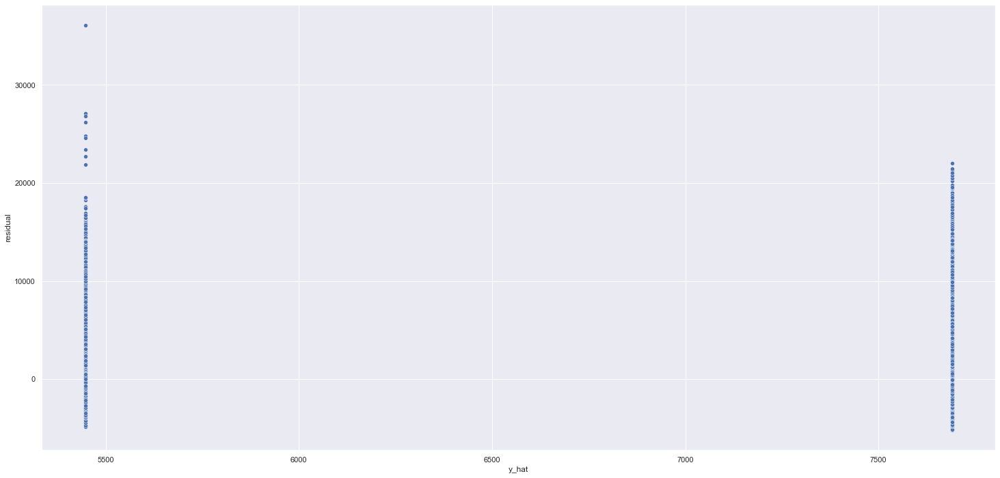

In [95]:
# PROMO
kb_filter = ['date', 'store', 'store_type', 'assortment', 'store_cat', 'sales',
             'state_holiday', 'school_holiday', 'competition_time_days',
             'competition_distance', 'promo2_on', 'promo2_time_days',
             'year', 'day_of_week_sin', 'day_of_week_cos', 'month_sin', 'month_cos',
             'day_sin', 'day_cos', 'week_of_year_sin', 'week_of_year_cos']

import statsmodels.api as sm
#model
x_train_ols = sm.add_constant(X_train.drop(kb_filter, axis=1))
ols = sm.OLS(y_train, x_train_ols).fit()
print(ols.summary())

#prediction
x_test_ols = sm.add_constant(X_test.drop(kb_filter, axis=1))
yhat_ols = ols.predict(x_test_ols)

#performance
ols_result = ml_error('Linear Regression', np.expm1(y_test), np.expm1(yhat_ols))
print(ols_result)


res_plot(y_test, yhat_ols);

#### 2º STEP

C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\statsmodels\tsa\tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.165
Model:                            OLS   Adj. R-squared:                  0.165
Method:                 Least Squares   F-statistic:                 7.916e+04
Date:                Mon, 25 Oct 2021   Prob (F-statistic):               0.00
Time:                        17:29:08   Log-Likelihood:            -3.8145e+05
No. Observations:              802942   AIC:                         7.629e+05
Df Residuals:                  802939   BIC:                         7.629e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               8.6068      0.001   1.

C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\statsmodels\tsa\tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


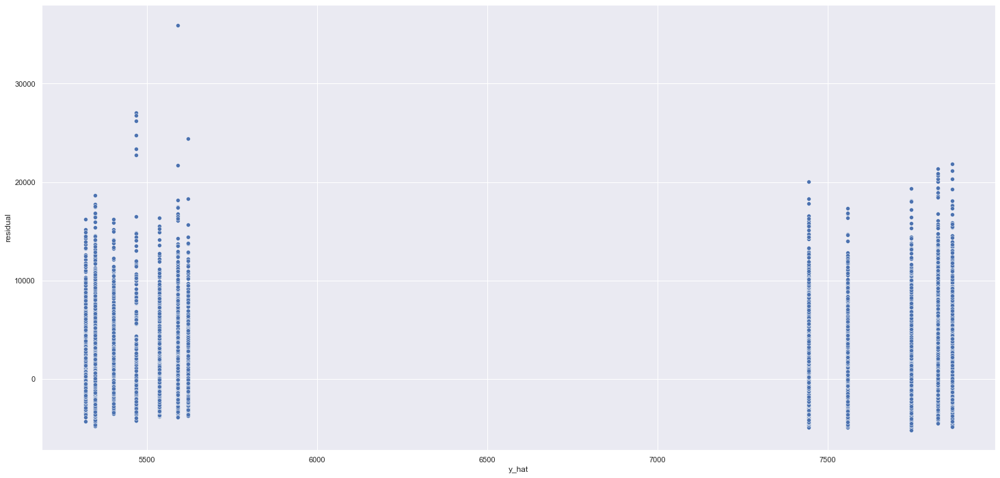

In [113]:
# PROMO + DAY OF WEEK SIN
kb_filter = ['date', 'store', 'store_type', 'assortment', 'store_cat', 'sales',
             'state_holiday', 'school_holiday', 'competition_time_days',
             'competition_distance', 'promo2_on', 'promo2_time_days',
             'year', 'day_of_week_cos', 'month_sin', 'month_cos',
             'day_sin', 'day_cos', 'week_of_year_sin', 'week_of_year_cos']

import statsmodels.api as sm
#model
x_train_ols = sm.add_constant(X_train.drop(kb_filter, axis=1))
ols = sm.OLS(y_train, x_train_ols).fit()
print(ols.summary())

#prediction
x_test_ols = sm.add_constant(X_test.drop(kb_filter, axis=1))
yhat_ols = ols.predict(x_test_ols)

#performance
ols_result = ml_error('Linear Regression', np.expm1(y_test), np.expm1(yhat_ols))
print(ols_result)


res_plot(y_test, yhat_ols);

#### 3º STEP

C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\statsmodels\tsa\tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.179
Model:                            OLS   Adj. R-squared:                  0.179
Method:                 Least Squares   F-statistic:                 5.831e+04
Date:                Mon, 25 Oct 2021   Prob (F-statistic):               0.00
Time:                        17:29:42   Log-Likelihood:            -3.7457e+05
No. Observations:              802942   AIC:                         7.492e+05
Df Residuals:                  802938   BIC:                         7.492e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               8.5079      0.001   83

C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\statsmodels\tsa\tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


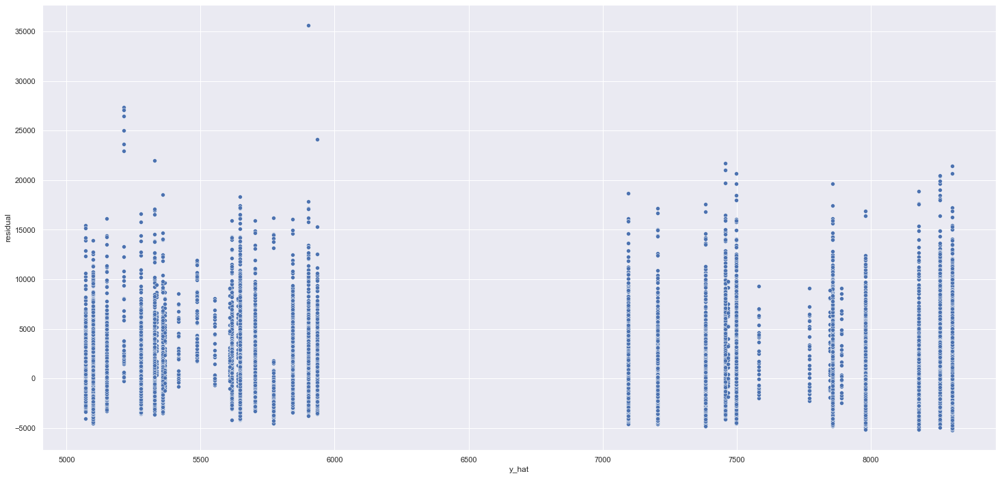

In [114]:
# PROMO + DAY OF WEEK SIN + ASSORMENT
kb_filter = ['date', 'store', 'store_type', 'store_cat', 'sales',
             'state_holiday', 'school_holiday', 'competition_time_days',
             'competition_distance', 'promo2_on', 'promo2_time_days',
             'year', 'day_of_week_cos', 'month_sin', 'month_cos',
             'day_sin', 'day_cos', 'week_of_year_sin','week_of_year_cos']

import statsmodels.api as sm
#model
x_train_ols = sm.add_constant(X_train.drop(kb_filter, axis=1))
ols = sm.OLS(y_train, x_train_ols).fit()
print(ols.summary())

#prediction
x_test_ols = sm.add_constant(X_test.drop(kb_filter, axis=1))
yhat_ols = ols.predict(x_test_ols)

#performance
ols_result = ml_error('Linear Regression', np.expm1(y_test), np.expm1(yhat_ols))
print(ols_result)


res_plot(y_test, yhat_ols);

#### 4º STEP

C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\statsmodels\tsa\tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.182
Model:                            OLS   Adj. R-squared:                  0.182
Method:                 Least Squares   F-statistic:                 4.470e+04
Date:                Mon, 25 Oct 2021   Prob (F-statistic):               0.00
Time:                        17:30:21   Log-Likelihood:            -3.7298e+05
No. Observations:              802942   AIC:                         7.460e+05
Df Residuals:                  802937   BIC:                         7.460e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               8.5093      0.001   83

C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\statsmodels\tsa\tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


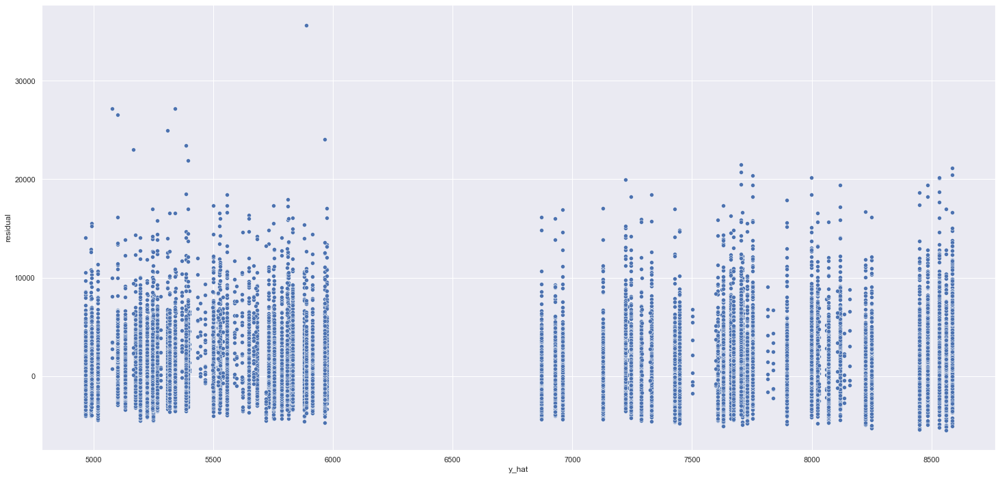

In [115]:
# PROMO + DAY OF WEEK SIN + ASSORMENT + DAY_COS
kb_filter = ['date', 'store', 'store_type', 'store_cat', 'sales',
             'state_holiday', 'school_holiday', 'competition_time_days',
             'competition_distance', 'promo2_on', 'promo2_time_days',
             'year', 'day_of_week_cos', 'month_sin', 'month_cos',
             'day_sin', 'week_of_year_sin', 'week_of_year_cos']

import statsmodels.api as sm
#model
x_train_ols = sm.add_constant(X_train.drop(kb_filter, axis=1))
ols = sm.OLS(y_train, x_train_ols).fit()
print(ols.summary())

#prediction
x_test_ols = sm.add_constant(X_test.drop(kb_filter, axis=1))
yhat_ols = ols.predict(x_test_ols)

#performance
ols_result = ml_error('Linear Regression', np.expm1(y_test), np.expm1(yhat_ols))
print(ols_result)


res_plot(y_test, yhat_ols);

#### 5º STEP

C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\statsmodels\tsa\tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.185
Model:                            OLS   Adj. R-squared:                  0.185
Method:                 Least Squares   F-statistic:                 3.657e+04
Date:                Mon, 25 Oct 2021   Prob (F-statistic):               0.00
Time:                        17:31:01   Log-Likelihood:            -3.7134e+05
No. Observations:              802942   AIC:                         7.427e+05
Df Residuals:                  802936   BIC:                         7.428e+05
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               8.5201      0.001   82

C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\statsmodels\tsa\tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


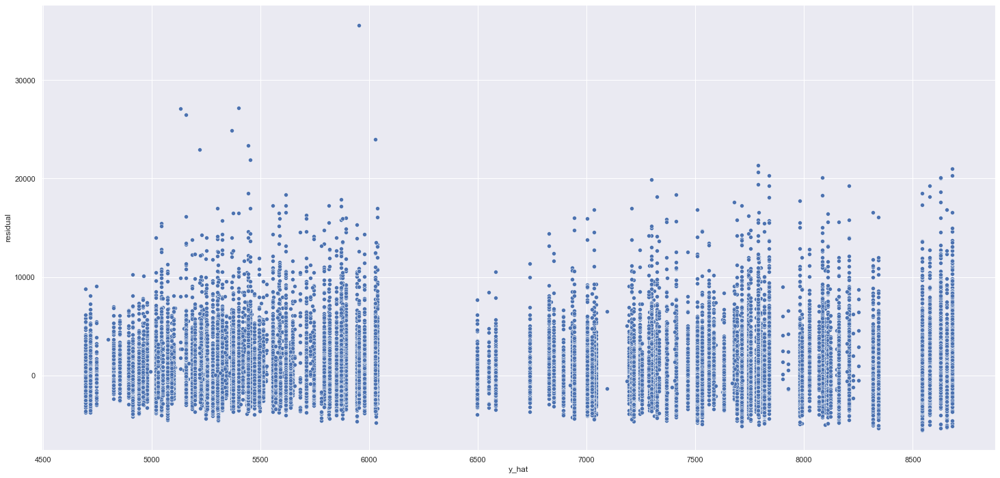

In [116]:
# PROMO + DAY OF WEEK SIN + ASSORMENT + DAY_COS + PROMO 2 ON
kb_filter = ['date', 'store', 'store_type', 'store_cat', 'sales',
             'state_holiday', 'school_holiday', 'competition_time_days',
             'competition_distance', 'promo2_time_days',
             'year', 'day_of_week_cos', 'month_sin', 'month_cos',
             'day_sin', 'week_of_year_sin', 'week_of_year_cos']

import statsmodels.api as sm
#model
x_train_ols = sm.add_constant(X_train.drop(kb_filter, axis=1))
ols = sm.OLS(y_train, x_train_ols).fit()
print(ols.summary())

#prediction
x_test_ols = sm.add_constant(X_test.drop(kb_filter, axis=1))
yhat_ols = ols.predict(x_test_ols)

#performance
ols_result = ml_error('Linear Regression', np.expm1(y_test), np.expm1(yhat_ols))
print(ols_result)


res_plot(y_test, yhat_ols);

#### 6º STEP

C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\statsmodels\tsa\tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.187
Model:                            OLS   Adj. R-squared:                  0.187
Method:                 Least Squares   F-statistic:                 3.075e+04
Date:                Mon, 25 Oct 2021   Prob (F-statistic):               0.00
Time:                        17:31:32   Log-Likelihood:            -3.7067e+05
No. Observations:              802942   AIC:                         7.413e+05
Df Residuals:                  802935   BIC:                         7.414e+05
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               8.5204      0.001   82

C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\statsmodels\tsa\tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


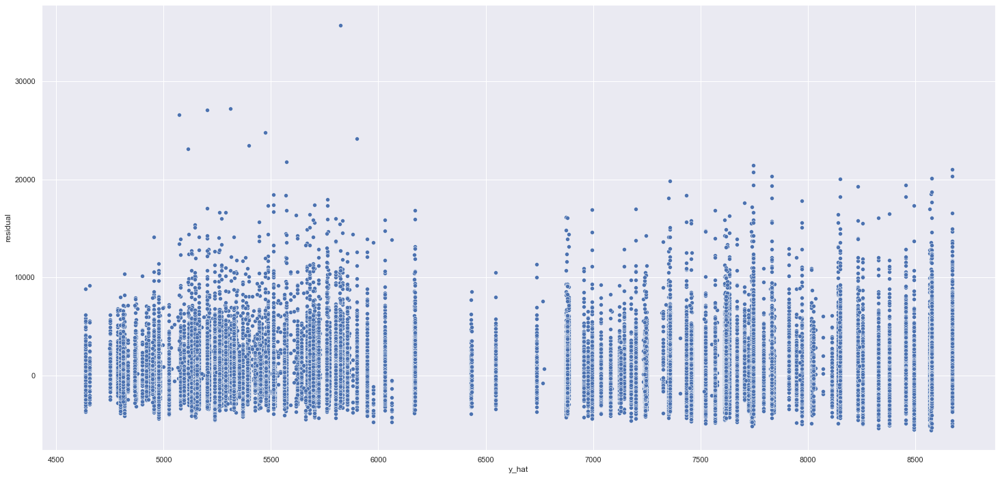

In [117]:
# PROMO + DAY OF WEEK SIN + ASSORMENT + DAY_COS + PROMO 2 ON + DAY SIN
kb_filter = ['date', 'store', 'store_type', 'store_cat', 'sales',
             'state_holiday', 'school_holiday', 'competition_time_days',
             'competition_distance', 'promo2_time_days',
             'year', 'day_of_week_cos', 'month_sin', 'month_cos',
             'week_of_year_sin', 'week_of_year_cos']

import statsmodels.api as sm
#model
x_train_ols = sm.add_constant(X_train.drop(kb_filter, axis=1))
ols = sm.OLS(y_train, x_train_ols).fit()
print(ols.summary())

#prediction
x_test_ols = sm.add_constant(X_test.drop(kb_filter, axis=1))
yhat_ols = ols.predict(x_test_ols)

#performance
ols_result = ml_error('Linear Regression', np.expm1(y_test), np.expm1(yhat_ols))
print(ols_result)


res_plot(y_test, yhat_ols);

#### 7º STEP

                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.188
Model:                            OLS   Adj. R-squared:                  0.188
Method:                 Least Squares   F-statistic:                 2.660e+04
Date:                Mon, 25 Oct 2021   Prob (F-statistic):               0.00
Time:                        17:32:17   Log-Likelihood:            -3.6997e+05
No. Observations:              802942   AIC:                         7.400e+05
Df Residuals:                  802934   BIC:                         7.400e+05
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
assortment          0.0510      0.000    1

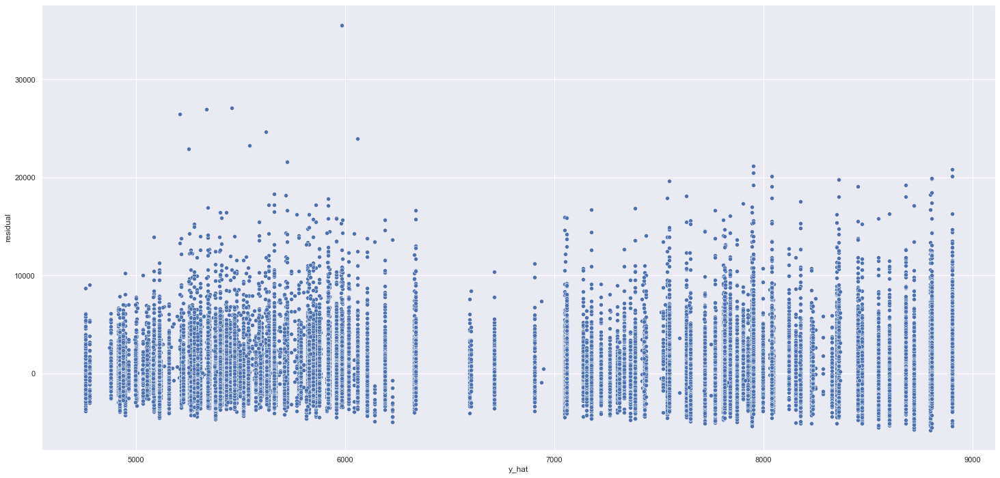

In [118]:
# PROMO + DAY OF WEEK SIN + ASSORMENT + DAY_COS + PROMO 2 ON + DAY SIN + YEAR
kb_filter = ['date', 'store', 'store_type', 'store_cat', 'sales',
             'state_holiday', 'school_holiday', 'competition_time_days',
             'competition_distance', 'promo2_time_days',
             'day_of_week_cos', 'month_sin', 'month_cos',
             'week_of_year_sin','week_of_year_cos']

import statsmodels.api as sm
#model
x_train_ols = X_train.drop(kb_filter, axis=1)
x_train_ols['const'] = 1.0
ols = sm.OLS(y_train, x_train_ols).fit()
print(ols.summary())

#prediction
x_test_ols = X_test.drop(kb_filter, axis=1)
x_test_ols['const'] = 1.0
yhat_ols = ols.predict(x_test_ols)

#performance
ols_result = ml_error('Linear Regression', np.expm1(y_test), np.expm1(yhat_ols))
print(ols_result)


res_plot(y_test, yhat_ols);

#### 8º STEP

                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.190
Model:                            OLS   Adj. R-squared:                  0.190
Method:                 Least Squares   F-statistic:                 2.349e+04
Date:                Mon, 25 Oct 2021   Prob (F-statistic):               0.00
Time:                        17:33:01   Log-Likelihood:            -3.6926e+05
No. Observations:              802942   AIC:                         7.385e+05
Df Residuals:                  802933   BIC:                         7.387e+05
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
assortment           0.0505      0.000  

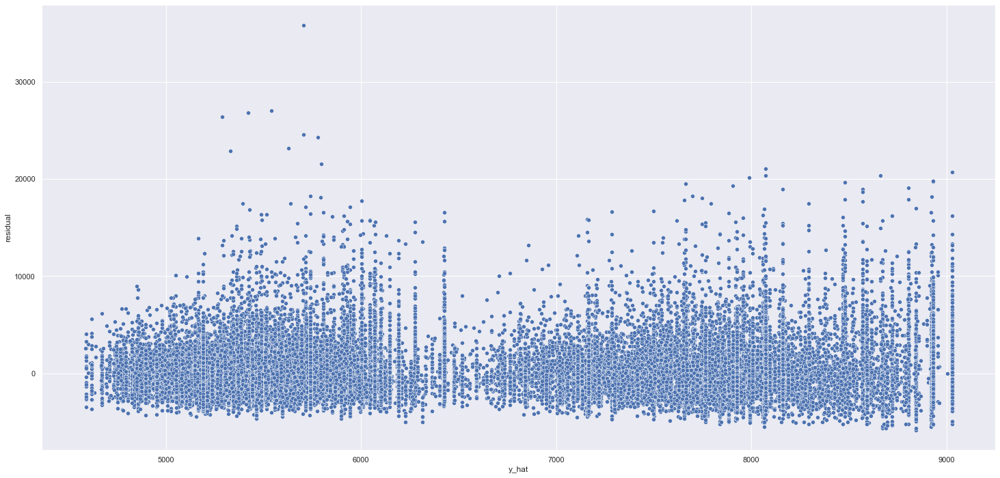

In [119]:
# PROMO + DAY OF WEEK SIN + ASSORMENT + DAY_COS + PROMO 2 ON + DAY SIN + YEAR + PROMO 2 TIME DAYS
kb_filter = ['date', 'store', 'store_type', 'store_cat', 'sales',
             'state_holiday', 'school_holiday', 'competition_time_days',
             'competition_distance',
             'day_of_week_cos', 'month_sin', 'month_cos',
             'week_of_year_sin','week_of_year_cos']

import statsmodels.api as sm
#model
x_train_ols = X_train.drop(kb_filter, axis=1)
x_train_ols['const'] = 1.0
ols = sm.OLS(y_train, x_train_ols).fit()
print(ols.summary())

#prediction
x_test_ols = X_test.drop(kb_filter, axis=1)
x_test_ols['const'] = 1.0
yhat_ols = ols.predict(x_test_ols)

#performance
ols_result = ml_error('Linear Regression', np.expm1(y_test), np.expm1(yhat_ols))
print(ols_result)


res_plot(y_test, yhat_ols);

#### 9º STEP

                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.190
Model:                            OLS   Adj. R-squared:                  0.190
Method:                 Least Squares   F-statistic:                 2.088e+04
Date:                Mon, 25 Oct 2021   Prob (F-statistic):               0.00
Time:                        17:33:41   Log-Likelihood:            -3.6926e+05
No. Observations:              802942   AIC:                         7.385e+05
Df Residuals:                  802932   BIC:                         7.387e+05
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
assortment           0.0507      0.000  

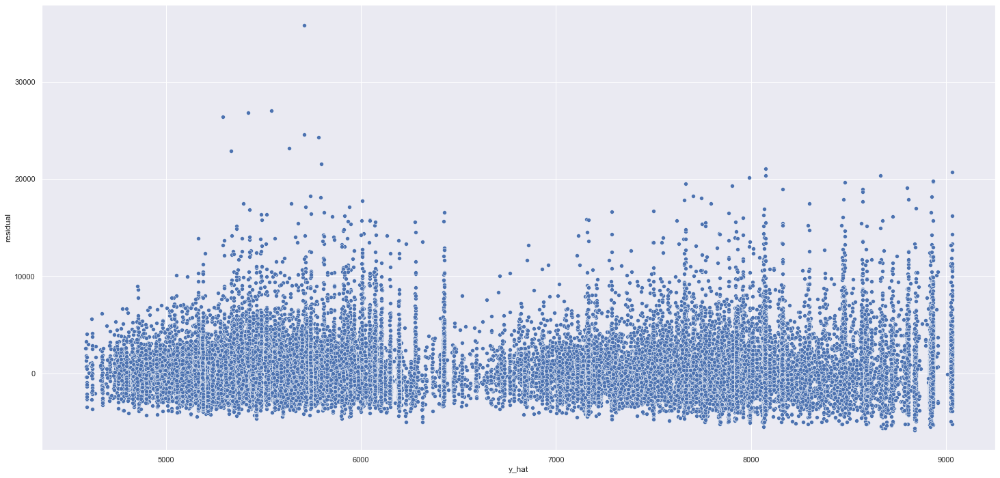

In [120]:
# PROMO + DAY OF WEEK SIN + ASSORMENT + DAY_COS + PROMO 2 ON + DAY SIN + YEAR + PROMO 2 TIME DAYS + STORE CAT
kb_filter = ['date', 'store', 'store_type', 'sales',
             'state_holiday', 'school_holiday', 'competition_time_days',
             'competition_distance',
             'day_of_week_cos', 'month_sin', 'month_cos',
             'week_of_year_sin','week_of_year_cos']

import statsmodels.api as sm
#model
x_train_ols = X_train.drop(kb_filter, axis=1)
x_train_ols['const'] = 1.0
ols = sm.OLS(y_train, x_train_ols).fit()
print(ols.summary())

#prediction
x_test_ols = X_test.drop(kb_filter, axis=1)
x_test_ols['const'] = 1.0
yhat_ols = ols.predict(x_test_ols)

#performance
ols_result = ml_error('Linear Regression', np.expm1(y_test), np.expm1(yhat_ols))
print(ols_result)


res_plot(y_test, yhat_ols);

#### 10º STEP

                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.190
Model:                            OLS   Adj. R-squared:                  0.190
Method:                 Least Squares   F-statistic:                 2.097e+04
Date:                Mon, 25 Oct 2021   Prob (F-statistic):               0.00
Time:                        17:34:09   Log-Likelihood:            -3.6896e+05
No. Observations:              802942   AIC:                         7.379e+05
Df Residuals:                  802932   BIC:                         7.381e+05
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
assortment           0.0505      0.000  

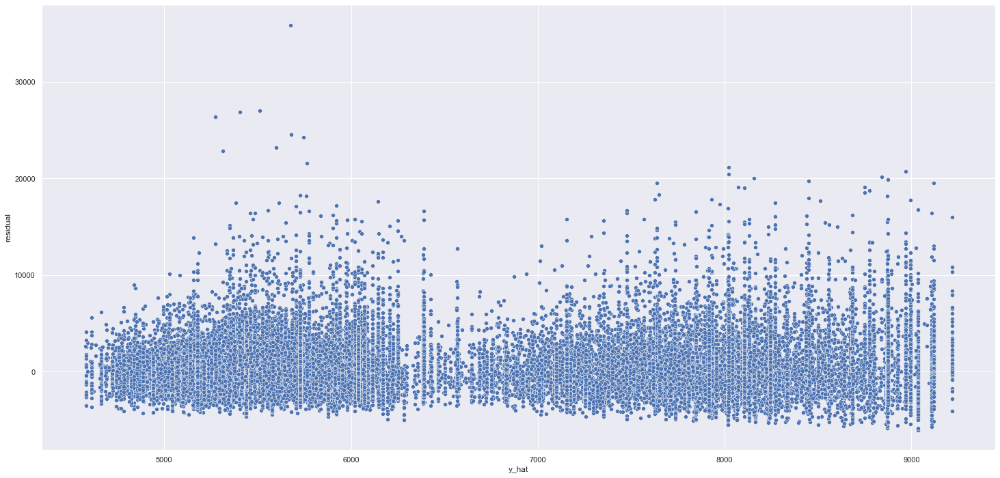

In [121]:
# PROMO + DAY OF WEEK SIN + ASSORMENT + DAY_COS + PROMO 2 ON + DAY SIN + YEAR + PROMO 2 TIME DAYS + SCHOOL HOLIDAY
kb_filter = ['date', 'store', 'store_type', 'sales', 'store_cat',
             'state_holiday', 'competition_time_days',
             'competition_distance',
             'day_of_week_cos', 'month_sin', 'month_cos',
             'week_of_year_sin','week_of_year_cos']

import statsmodels.api as sm
#model
x_train_ols = X_train.drop(kb_filter, axis=1)
x_train_ols['const'] = 1.0
ols = sm.OLS(y_train, x_train_ols).fit()
print(ols.summary())

#prediction
x_test_ols = X_test.drop(kb_filter, axis=1)
x_test_ols['const'] = 1.0
yhat_ols = ols.predict(x_test_ols)

#performance
ols_result = ml_error('Linear Regression', np.expm1(y_test), np.expm1(yhat_ols))
print(ols_result)


res_plot(y_test, yhat_ols);

#### 11º STEP

                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.193
Model:                            OLS   Adj. R-squared:                  0.193
Method:                 Least Squares   F-statistic:                 1.926e+04
Date:                Mon, 25 Oct 2021   Prob (F-statistic):               0.00
Time:                        17:34:38   Log-Likelihood:            -3.6740e+05
No. Observations:              802942   AIC:                         7.348e+05
Df Residuals:                  802931   BIC:                         7.349e+05
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
assortment               0.0542 

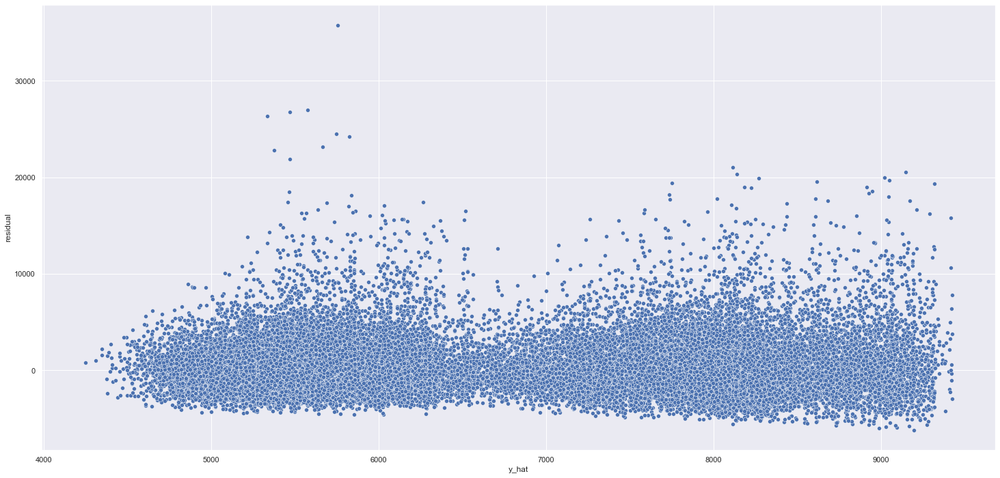

In [122]:
# PROMO + DAY OF WEEK SIN + ASSORMENT + DAY_COS + PROMO 2 ON + DAY SIN + YEAR + PROMO 2 TIME DAYS + SCHOOL HOLIDAY + COMP DIST
kb_filter = ['date', 'store', 'store_type', 'sales', 'store_cat',
             'state_holiday', 'competition_time_days',
             'day_of_week_cos', 'month_sin', 'month_cos',
             'week_of_year_sin','week_of_year_cos']

import statsmodels.api as sm
#model
x_train_ols = X_train.drop(kb_filter, axis=1)
x_train_ols['const'] = 1.0
ols = sm.OLS(y_train, x_train_ols).fit()
print(ols.summary())

#prediction
x_test_ols = X_test.drop(kb_filter, axis=1)
x_test_ols['const'] = 1.0
yhat_ols = ols.predict(x_test_ols)

#performance
ols_result = ml_error('Linear Regression', np.expm1(y_test), np.expm1(yhat_ols))
print(ols_result)


res_plot(y_test, yhat_ols);

#### 12º STEP

                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.193
Model:                            OLS   Adj. R-squared:                  0.193
Method:                 Least Squares   F-statistic:                 1.751e+04
Date:                Mon, 25 Oct 2021   Prob (F-statistic):               0.00
Time:                        17:35:23   Log-Likelihood:            -3.6740e+05
No. Observations:              802942   AIC:                         7.348e+05
Df Residuals:                  802930   BIC:                         7.350e+05
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
store_type               0.0003 

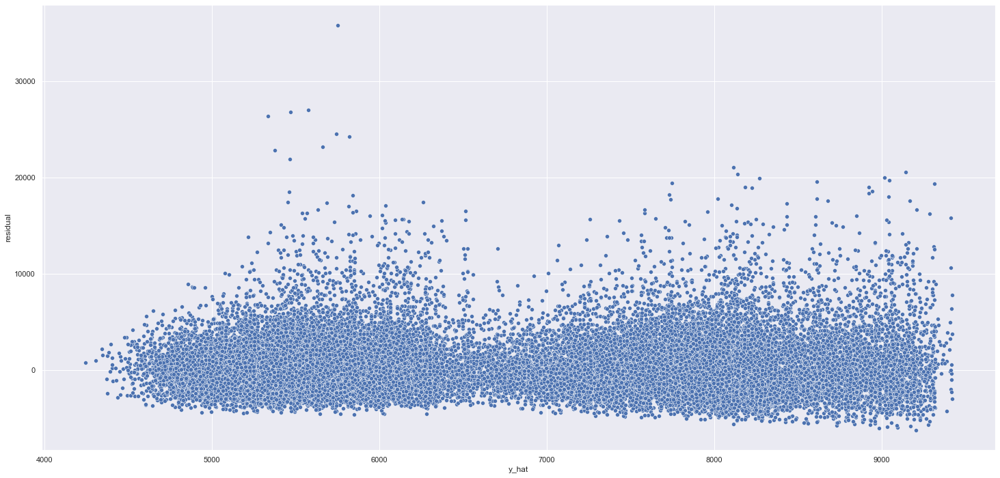

In [123]:
# PROMO + DAY OF WEEK SIN + ASSORMENT + DAY_COS + PROMO 2 ON + DAY SIN + YEAR + PROMO 2 TIME DAYS + SCHOOL HOLIDAY + COMP DIST
# + STORE_TYPE
kb_filter = ['date', 'store', 'sales', 'store_cat',
             'state_holiday', 'competition_time_days',
             'day_of_week_cos', 'month_sin', 'month_cos',
             'week_of_year_sin','week_of_year_cos']

import statsmodels.api as sm
#model
x_train_ols = X_train.drop(kb_filter, axis=1)
x_train_ols['const'] = 1.0
ols = sm.OLS(y_train, x_train_ols).fit()
print(ols.summary())

#prediction
x_test_ols = X_test.drop(kb_filter, axis=1)
x_test_ols['const'] = 1.0
yhat_ols = ols.predict(x_test_ols)

#performance
ols_result = ml_error('Linear Regression', np.expm1(y_test), np.expm1(yhat_ols))
print(ols_result)


res_plot(y_test, yhat_ols);

#### 13º STEP

                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.194
Model:                            OLS   Adj. R-squared:                  0.194
Method:                 Least Squares   F-statistic:                 1.756e+04
Date:                Mon, 25 Oct 2021   Prob (F-statistic):               0.00
Time:                        17:35:58   Log-Likelihood:            -3.6716e+05
No. Observations:              802942   AIC:                         7.343e+05
Df Residuals:                  802930   BIC:                         7.345e+05
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
assortment               0.0542 

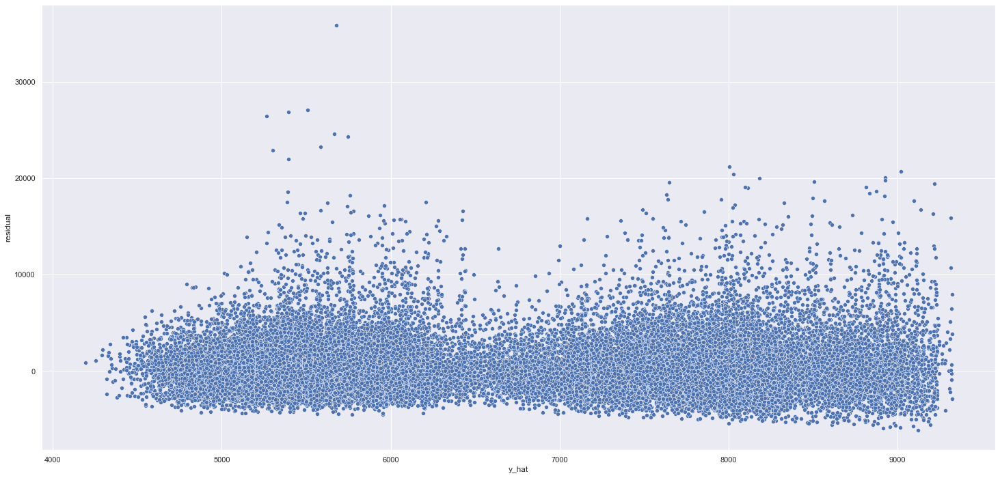

In [124]:
# PROMO + DAY OF WEEK SIN + ASSORMENT + DAY_COS + PROMO 2 ON + DAY SIN + YEAR + PROMO 2 TIME DAYS + SCHOOL HOLIDAY + COMP DIST
# + WEEK OF YEAR COS
kb_filter = ['date', 'store', 'sales', 'store_cat', 'store_type',
             'state_holiday', 'competition_time_days',
             'day_of_week_cos', 'month_sin', 'month_cos', 'week_of_year_sin'
             ]

import statsmodels.api as sm
#model
x_train_ols = X_train.drop(kb_filter, axis=1)
x_train_ols['const'] = 1.0
ols = sm.OLS(y_train, x_train_ols).fit()
print(ols.summary())

#prediction
x_test_ols = X_test.drop(kb_filter, axis=1)
x_test_ols['const'] = 1.0
yhat_ols = ols.predict(x_test_ols)

#performance
ols_result = ml_error('Linear Regression', np.expm1(y_test), np.expm1(yhat_ols))
print(ols_result)


res_plot(y_test, yhat_ols);

#### 14º STEP

                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.194
Model:                            OLS   Adj. R-squared:                  0.194
Method:                 Least Squares   F-statistic:                 1.610e+04
Date:                Mon, 25 Oct 2021   Prob (F-statistic):               0.00
Time:                        17:36:45   Log-Likelihood:            -3.6716e+05
No. Observations:              802942   AIC:                         7.343e+05
Df Residuals:                  802929   BIC:                         7.345e+05
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
assortment               0.0542 

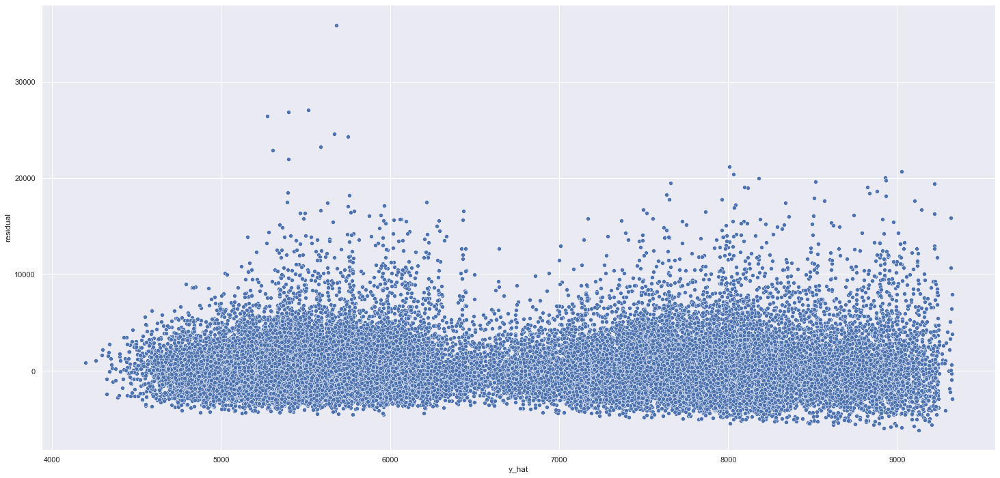

In [125]:
# PROMO + DAY OF WEEK SIN + ASSORMENT + DAY_COS + PROMO 2 ON + DAY SIN + YEAR + PROMO 2 TIME DAYS + SCHOOL HOLIDAY + COMP DIST
# + WEEK OF YEAR COS + MONTH SIN
kb_filter = ['date', 'store', 'sales', 'store_cat', 'store_type',
             'state_holiday', 'competition_time_days',
             'day_of_week_cos', 'month_cos', 'week_of_year_sin'
             ]

import statsmodels.api as sm
#model
x_train_ols = X_train.drop(kb_filter, axis=1)
x_train_ols['const'] = 1.0
ols = sm.OLS(y_train, x_train_ols).fit()
print(ols.summary())

#prediction
x_test_ols = X_test.drop(kb_filter, axis=1)
x_test_ols['const'] = 1.0
yhat_ols = ols.predict(x_test_ols)

#performance
ols_result = ml_error('Linear Regression', np.expm1(y_test), np.expm1(yhat_ols))
print(ols_result)


res_plot(y_test, yhat_ols);

#### 15º STEP

                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.194
Model:                            OLS   Adj. R-squared:                  0.194
Method:                 Least Squares   F-statistic:                 1.486e+04
Date:                Mon, 25 Oct 2021   Prob (F-statistic):               0.00
Time:                        17:37:51   Log-Likelihood:            -3.6714e+05
No. Observations:              802942   AIC:                         7.343e+05
Df Residuals:                  802928   BIC:                         7.345e+05
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
assortment               0.0542 

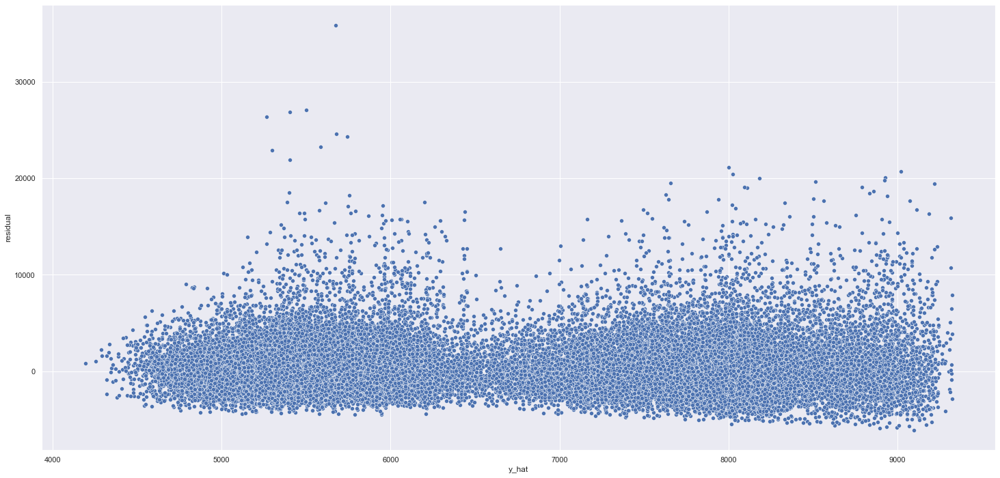

In [126]:
# PROMO + DAY OF WEEK SIN + ASSORMENT + DAY_COS + PROMO 2 ON + DAY SIN + YEAR + PROMO 2 TIME DAYS + SCHOOL HOLIDAY + COMP DIST
# + WEEK OF YEAR COS + MONTH COS
kb_filter = ['date', 'store', 'sales', 'store_cat', 'store_type',
             'state_holiday', 'competition_time_days',
             'day_of_week_cos', 'week_of_year_sin'
             ]

import statsmodels.api as sm
#model
x_train_ols = X_train.drop(kb_filter, axis=1)
x_train_ols['const'] = 1.0
ols = sm.OLS(y_train, x_train_ols).fit()
print(ols.summary())

#prediction
x_test_ols = X_test.drop(kb_filter, axis=1)
x_test_ols['const'] = 1.0
yhat_ols = ols.predict(x_test_ols)

#performance
ols_result = ml_error('Linear Regression', np.expm1(y_test), np.expm1(yhat_ols))
print(ols_result)


res_plot(y_test, yhat_ols);

#### 16º STEP

                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.194
Model:                            OLS   Adj. R-squared:                  0.194
Method:                 Least Squares   F-statistic:                 1.380e+04
Date:                Mon, 25 Oct 2021   Prob (F-statistic):               0.00
Time:                        17:38:30   Log-Likelihood:            -3.6714e+05
No. Observations:              802942   AIC:                         7.343e+05
Df Residuals:                  802927   BIC:                         7.345e+05
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
assortment                0.05

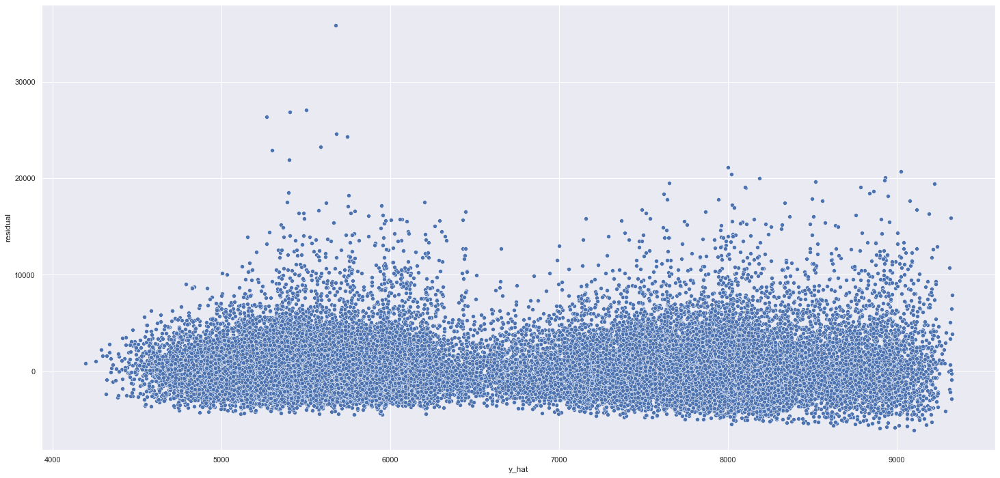

In [127]:
# PROMO + DAY OF WEEK SIN + ASSORMENT + DAY_COS + PROMO 2 ON + DAY SIN + YEAR + PROMO 2 TIME DAYS + SCHOOL HOLIDAY + COMP DIST
# + WEEK OF YEAR COS + MONTH COS + COMP TIME DAYS
kb_filter = ['date', 'store', 'sales', 'store_cat', 'store_type',
             'state_holiday', 
             'day_of_week_cos', 'week_of_year_sin'
             ]

import statsmodels.api as sm
#model
x_train_ols = X_train.drop(kb_filter, axis=1)
x_train_ols['const'] = 1.0
ols = sm.OLS(y_train, x_train_ols).fit()
print(ols.summary())

#prediction
x_test_ols = X_test.drop(kb_filter, axis=1)
x_test_ols['const'] = 1.0
yhat_ols = ols.predict(x_test_ols)

#performance
ols_result = ml_error('Linear Regression', np.expm1(y_test), np.expm1(yhat_ols))
print(ols_result)


res_plot(y_test, yhat_ols);

#### 17º STEP

                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.194
Model:                            OLS   Adj. R-squared:                  0.194
Method:                 Least Squares   F-statistic:                 1.289e+04
Date:                Mon, 25 Oct 2021   Prob (F-statistic):               0.00
Time:                        17:39:03   Log-Likelihood:            -3.6710e+05
No. Observations:              802942   AIC:                         7.342e+05
Df Residuals:                  802926   BIC:                         7.344e+05
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
assortment                0.05

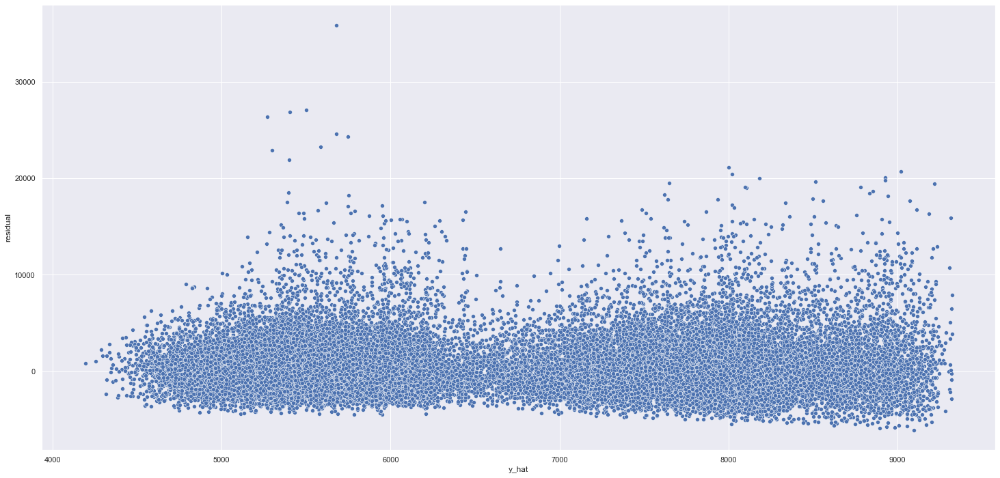

In [128]:
# PROMO + DAY OF WEEK SIN + ASSORMENT + DAY_COS + PROMO 2 ON + DAY SIN + YEAR + PROMO 2 TIME DAYS + SCHOOL HOLIDAY + COMP DIST
# + WEEK OF YEAR COS + MONTH COS + COMP TIME DAYS + STATE HOLIDAY
kb_filter = ['date', 'store', 'sales', 'store_cat', 'store_type',
             'day_of_week_cos', 'week_of_year_sin'
             ]

import statsmodels.api as sm
#model
x_train_ols = X_train.drop(kb_filter, axis=1)
x_train_ols['const'] = 1.0
ols = sm.OLS(y_train, x_train_ols).fit()
print(ols.summary())

#prediction
x_test_ols = X_test.drop(kb_filter, axis=1)
x_test_ols['const'] = 1.0
yhat_ols = ols.predict(x_test_ols)

#performance
ols_result = ml_error('Linear Regression', np.expm1(y_test), np.expm1(yhat_ols))
print(ols_result)


res_plot(y_test, yhat_ols);

#### FINAL MODEL

                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.190
Model:                            OLS   Adj. R-squared:                  0.190
Method:                 Least Squares   F-statistic:                 2.092e+04
Date:                Mon, 25 Oct 2021   Prob (F-statistic):               0.00
Time:                        17:47:16   Log-Likelihood:            -3.6914e+05
No. Observations:              802942   AIC:                         7.383e+05
Df Residuals:                  802932   BIC:                         7.384e+05
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
assortment               0.0539 

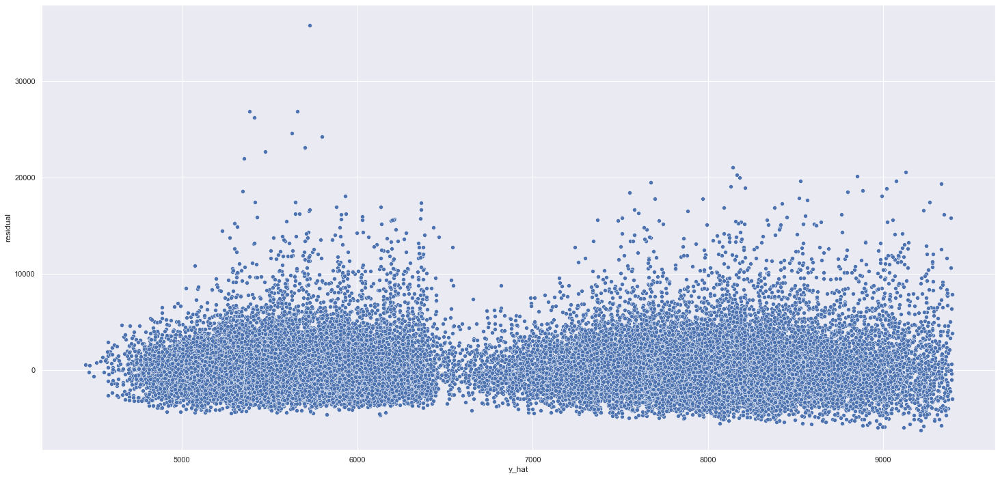

In [139]:
# PROMO + DAY OF WEEK SIN + ASSORMENT + DAY_COS + YEAR + PROMO 2 TIME DAYS + SCHOOL HOLIDAY + COMP DIST
# + WEEK OF YEAR COS + MONTH SIN
kb_filter = ['date', 'store', 'sales', 'store_cat', 'store_type',
             'day_of_week_cos', 'week_of_year_sin', 
             'promo2_on',
             'state_holiday', 'competition_time_days', 'month_cos', 'week_of_year_cos', 'day_sin'
             ]

import statsmodels.api as sm
#model
x_train_ols = X_train.drop(kb_filter, axis=1)
x_train_ols['const'] = 1.0
ols = sm.OLS(y_train, x_train_ols).fit()
print(ols.summary())

#prediction
x_test_ols = X_test.drop(kb_filter, axis=1)
x_test_ols['const'] = 1.0
yhat_ols = ols.predict(x_test_ols)

#performance
ols_result = ml_error('Linear Regression', np.expm1(y_test), np.expm1(yhat_ols))
print(ols_result)

res_plot(y_test, yhat_ols);

                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.202
Model:                            OLS   Adj. R-squared:                  0.202
Method:                 Least Squares   F-statistic:                 1.132e+04
Date:                Mon, 25 Oct 2021   Prob (F-statistic):               0.00
Time:                        19:06:15   Log-Likelihood:            -3.6294e+05
No. Observations:              802942   AIC:                         7.259e+05
Df Residuals:                  802923   BIC:                         7.261e+05
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
store_type              -0.0398 

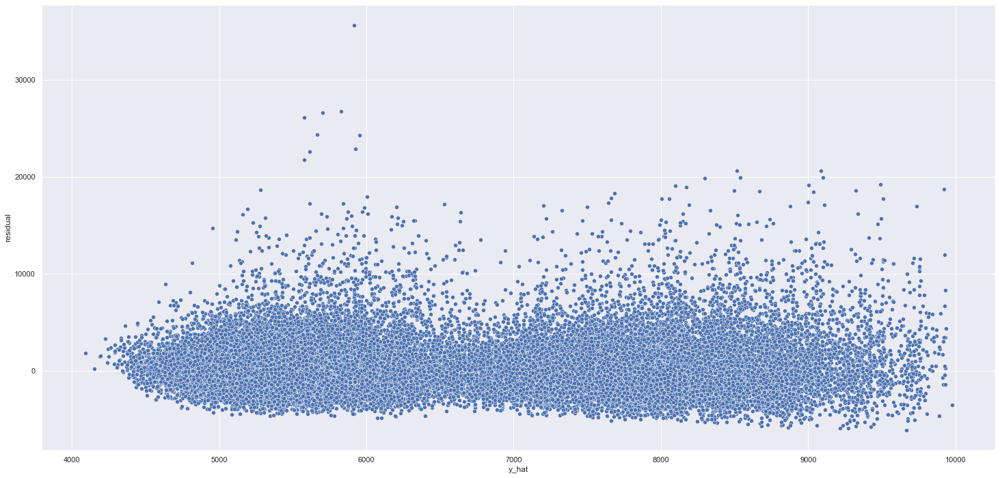

In [157]:
kb_r = ['store_type', 'assortment', 'store_cat', 'state_holiday', 'school_holiday', 'competition_distance',
        'promo', 'promo2_on', 'promo2_time_days', 'year', 'day_of_week_sin', 'day_of_week_cos', 'month_sin',
        'month_cos', 'day_sin', 'day_cos','week_of_year_sin', 'week_of_year_cos'
       ]

import statsmodels.api as sm
#model
x_train_ols = X_train[kb_r].copy()
x_train_ols['const'] = 1.0
ols = sm.OLS(y_train, x_train_ols).fit()
print(ols.summary())

#prediction
x_test_ols = X_test[kb_r].copy()
x_test_ols['const'] = 1.0
yhat_ols = ols.predict(x_test_ols)

#performance
ols_result = ml_error('Linear Regression', np.expm1(y_test), np.expm1(yhat_ols))
print(ols_result)

res_plot(y_test, yhat_ols);

##### STATUS MODEL

In [37]:
import statsmodels.api as sm
#model
x_train_ols = sm.add_constant(x_train)
ols = sm.OLS(y_train, x_train_ols).fit()
print(ols.summary())

#prediction
x_test_ols = sm.add_constant(x_test)
yhat_ols = ols.predict(x_test_ols)

#performance
ols_result = ml_error('Linear Regression', np.expm1(y_test), np.expm1(yhat_ols))
ols_result

C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\statsmodels\tsa\tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.196
Model:                            OLS   Adj. R-squared:                  0.196
Method:                 Least Squares   F-statistic:                 1.402e+04
Date:                Sun, 24 Oct 2021   Prob (F-statistic):               0.00
Time:                        16:32:20   Log-Likelihood:            -3.6591e+05
No. Observations:              802942   AIC:                         7.319e+05
Df Residuals:                  802927   BIC:                         7.320e+05
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     8.53

C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\statsmodels\tsa\tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


,Model Name,MAE,MAPE,RMSE,R2
0,Linear Regression,1900.331889,0.283141,2767.732835,0.173285


### 7.2.1. LINEAR REGRESSION MODEL - CROSS VALIDATION

In [158]:
kb_filter_final = ['store_type', 'assortment', 'store_cat', 'state_holiday', 'school_holiday', 'competition_distance',
                   'promo', 'promo2_on', 'promo2_time_days', 'year', 'day_of_week_sin', 'day_of_week_cos', 'month_sin',
                   'month_cos', 'day_sin', 'day_cos','week_of_year_sin', 'week_of_year_cos', 'date', 'sales']

lr_result_cv = cross_validation(X_train[kb_filter_final], 5, 'Linear Regression', lr)
lr_result_cv

,Model Name,MAE CV,MAPE CV,RMSE CV,R2 CV
0,Linear Regression,2125.77+/-339.85,0.3+/-0.02,3030.3+/-529.09,0.09+/-0.1


## 7.3 LINEAR REGRESSION REGULARIZED MODEL - LASSO

In [159]:
kb_filter_sel = ['store_type', 'assortment', 'store_cat', 'state_holiday', 'school_holiday', 'competition_distance',
                   'promo', 'promo2_on', 'promo2_time_days', 'year', 'day_of_week_sin', 'day_of_week_cos', 'month_sin',
                   'month_cos', 'day_sin', 'day_cos','week_of_year_sin', 'week_of_year_cos']

x_train = X_train[kb_filter_sel]
x_test = X_test[kb_filter_sel]

#model
lrr = Lasso(alpha=0.01).fit(x_train, y_train)

#prediction
yhat_lrr = lrr.predict(x_test)

#performance
lrr_result = ml_error('Linear Regression - Lasso', np.expm1(y_test), np.expm1(yhat_lrr))
lrr_result

,Model Name,MAE,MAPE,RMSE,R2
0,Linear Regression - Lasso,1916.605837,0.292564,2783.915743,0.16359


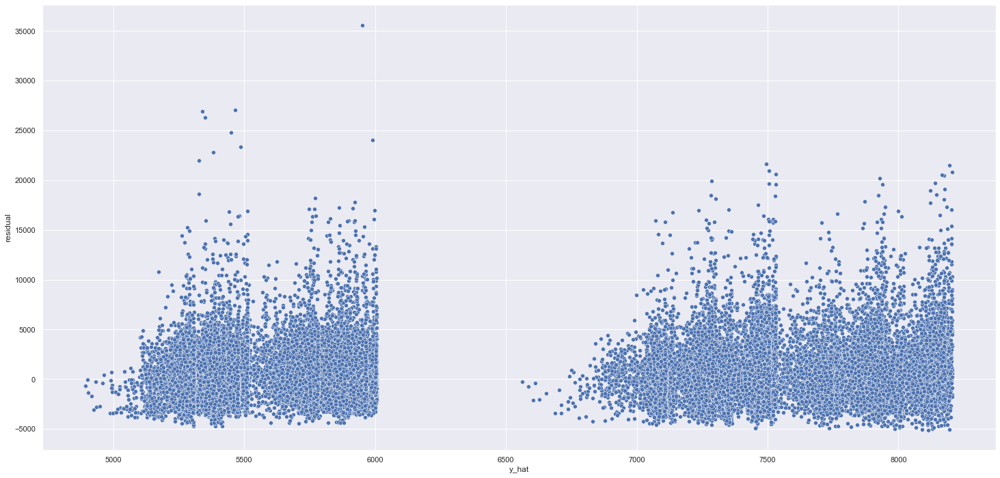

In [151]:
res_plot(y_test, yhat_lrr);

### 7.3.1. LINEAR REGRESSION REGULARIZED MODEL - LASSO - CROSS VALIDATION

In [160]:
kb_filter_final = ['store_type', 'assortment', 'store_cat', 'state_holiday', 'school_holiday', 'competition_distance',
                   'promo', 'promo2_on', 'promo2_time_days', 'year', 'day_of_week_sin', 'day_of_week_cos', 'month_sin',
                   'month_cos', 'day_sin', 'day_cos','week_of_year_sin', 'week_of_year_cos', 'date', 'sales']

lrr_result_cv = cross_validation(X_train[kb_filter_final], 5, 'Linear Regression - Lasso', lrr)
lrr_result_cv

,Model Name,MAE CV,MAPE CV,RMSE CV,R2 CV
0,Linear Regression - Lasso,2145.23+/-370.03,0.3+/-0.01,3090.55+/-552.86,0.06+/-0.11


## 7.4. RANDOM FOREST REGRESSOR

In [19]:
#model
rf = RandomForestRegressor(n_estimators=100, n_jobs=-1, random_state=42).fit(x_train, y_train)

#prediction
yhat_rf = rf.predict(x_test)

#performance
rf_result = ml_error('Random Forest Regressor', np.expm1(y_test), np.expm1(yhat_rf))
rf_result

,Model Name,MAE,MAPE,RMSE,R2
0,Random Forest Regressor,759.301061,0.113163,1116.071019,0.865572


In [104]:
ml_error('Random Forest Regressor', np.expm1(y_train), np.expm1(rf.predict(x_train)))['R2']

0    0.97864
Name: R2, dtype: float64

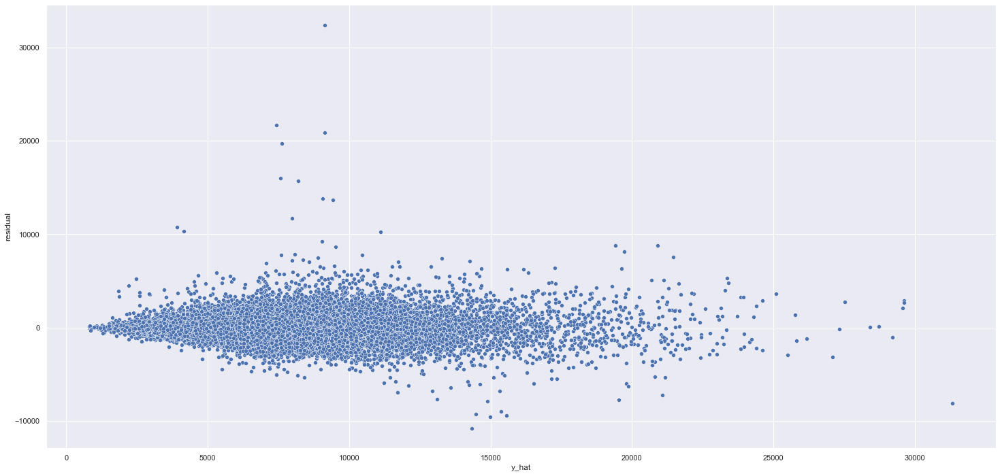

In [73]:
res_plot(y_test, yhat_rf);

### 7.4.1. RANDOM FOREST REGRESSOR - CROSS VALIDATION

In [79]:
rf_result_cv = cross_validation(x_training, 5, 'Random Forest Regressor', rf, True)
rf_result_cv


 KFold Number: 5

 KFold Number: 4

 KFold Number: 3

 KFold Number: 2

 KFold Number: 1


,Model Name,MAE CV,MAPE CV,RMSE CV,R2 CV
0,Random Forest Regressor,922.91+/-273.9,0.13+/-0.03,1377.05+/-394.82,0.81+/-0.07


## 7.5. XGBOOST REGRESSOR

###### PARAMETERS

**GENERAL**

*booster* [default=gbtree]
* Which booster to use. Can be gbtree, gblinear or dart; gbtree and dart use tree based models while gblinear uses linear functions.

*nthread*
* auto (default) / This is used for parallel processing and number of cores in the system should be entered

**BOOSTER PARAMETERS**

*eta* [default=0.3]
* Shrinks the feature weights to make the boosting process more conservative.
* Learning rate / Typical final values to be used: 0.01-0.2

*min_child_weight* [default=1] 
* Defines the minimum sum of weights of all observations required in a child
* Used to control over-fitting. Too high values can lead to under-fitting hence, it should be tuned using CV.

*max_depth* [default=6]
* The maximum depth of a tree, same as GBM.
* Typical values: 3-10. Should be tuned using CV.

*max_leaf_nodes* [OPTIONAL - alternative to max_depth]
* The maximum number of terminal nodes or leaves in a tree.

*gamma* [default=0]
* A node is split only when the resulting split gives a positive reduction in the loss function. Gamma specifies the minimum loss reduction required to make a split.
* Makes the algorithm conservative. The values can vary depending on the loss function and should be tuned.

*max_delta_step* [default=0]
* In maximum delta step we allow each tree’s weight estimation to be.
* If the value is set to 0, it means there is no constraint. If it is set to a positive value, it can help making the update step more conservative.
* Usually this parameter is not needed, but it might help in logistic regression when class is extremely imbalanced.

*subsample* [default=1]
* Same as the subsample of GBM. Denotes the fraction of observations to be randomly samples for each tree.
* Lower values make the algorithm more conservative and prevents overfitting but too small values might lead to under-fitting.
* Typical values: 0.5-1

*colsample_bytree* [default=1]
* Similar to max_features in GBM. Denotes the fraction of columns to be randomly samples for each tree.
* Typical values: 0.5-1

*colsample_bylevel* [default=1]
* Denotes the subsample ratio of columns for each split, in each level.
* I don’t use this often because subsample and colsample_bytree will do the job for you. but you can explore further if you feel so.

*lambda* [default=1]
* L2 regularization term on weights (analogous to Ridge regression)
* This used to handle the regularization part of XGBoost. Though many data scientists don’t use it often, it should be explored to reduce overfitting.

*alpha* [default=0]
* L1 regularization term on weight (analogous to Lasso regression)
* Can be used in case of very high dimensionality so that the algorithm runs faster when implemented

*scale_pos_weight* [default=1]
* A value greater than 0 should be used in case of high class imbalance as it helps in faster convergence.

**LEARNING TASK**

*objective* [default=reg:linear]
* This defines the loss function to be minimized. Mostly used values are:
 - binary:logistic –logistic regression for binary classification, returns predicted probability (not class)
 - multi:softmax –multiclass classification using the softmax objective, returns predicted class (not probabilities)
 - multi:softprob –same as softmax, but returns predicted probability of each data point belonging to each class.
 
*eval_metric* [ default according to objective]
* The metric to be used for validation data.
* The default values are rmse for regression and error for classification.
* Typical values are:
 - rmse – root mean square error
 - mae – mean absolute error
 - logloss – negative log-likelihood
 - error – Binary classification error rate (0.5 threshold)
 - merror – Multiclass classification error rate
 - mlogloss – Multiclass logloss
 - auc: Area under the curve
 
*seed* [default=0]
* The random number seed.
* Can be used for generating reproducible results and also for parameter tuning.

###### MODEL

In [40]:
param = {
         'n_estimators': 1, # 3000 - número de árvores
         'eta': 0.05, # 0.03 - taxa de aprendizado - quanto mais alto, mais rápido o modelo converge
         'max_depth': 6, # 5 - profundidade máxima da árvore
         'subsample': 0.7, # 0.7 - fração de observações que serão amostras aleatórias para cada árvore.
         'colsample_bytree': 0.7,
         'reg_lambda': 0
         #'min_child_weight': [3] # 3 - utilizado para controlar o overfitting. poda?
        }

print(param)
#model
model_xgb = xgb.XGBRegressor(
                            objective='reg:squarederror',
                            eval_metric='rmse',
                            n_estimators=param['n_estimators'],
                            eta=param['eta'],
                            max_depth=param['max_depth'],
                            subsample=param['subsample'],
                            colsample_bytree= param['colsample_bytree'],
                            reg_lambda=param['reg_lambda']
                            ).fit(x_train, y_train, verbose=True)

#prediction
yhat_xgb = model_xgb.predict(x_test)

#performance
xgb_result = ml_error('XGBoost Regressor', np.expm1(y_test), np.expm1(yhat_xgb))
xgb_result

{'n_estimators': 1, 'eta': 0.05, 'max_depth': 6, 'subsample': 0.7, 'colsample_bytree': 0.7, 'reg_lambda': 0}


,Model Name,MAE,MAPE,RMSE,R2
0,XGBoost Regressor,6993.67,1.0,7627.41,-5.2786


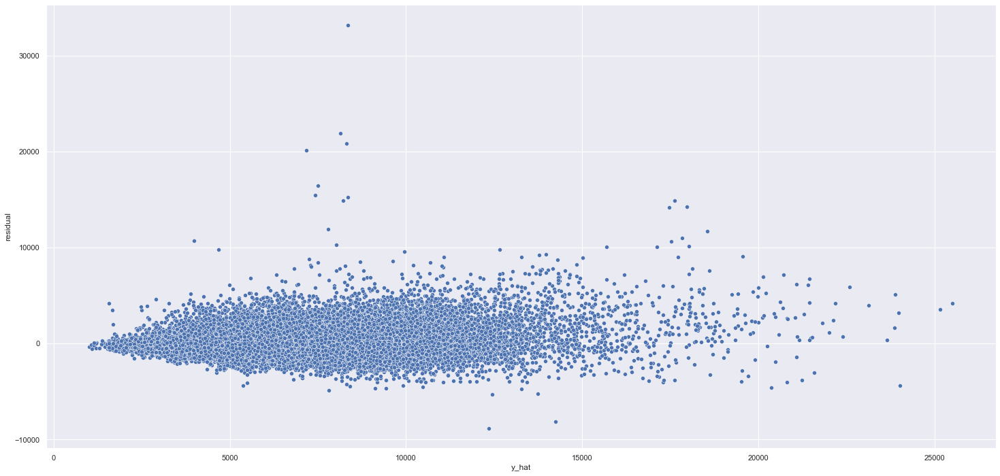

In [85]:
res_plot(y_test, yhat_xgb);

### 7.5.1. XGBOOST REGRESSOR - CROSS VALIDATION

In [86]:
xgb_result_cv = cross_validation(x_training, 5, 'XGBoost Regressor', model_xgb, True)
xgb_result_cv


 KFold Number: 5

 KFold Number: 4

 KFold Number: 3

 KFold Number: 2

 KFold Number: 1


,Model Name,MAE CV,MAPE CV,RMSE CV,R2 CV
0,XGBoost Regressor,1083.84+/-149.47,0.15+/-0.01,1555.87+/-209.5,0.76+/-0.02


## 7.6 COMPARE MODEL´S PERFORMANCE

### 7.6.1 SINGLE PERFORMANCE

In [87]:
modelling_result = pd.concat([baseline_result, lr_result, lrr_result, rf_result, xgb_result])
modelling_result.sort_values('RMSE')

,Model Name,MAE,MAPE,RMSE,R2
0,Random Forest Regressor,759.301061,0.113163,1116.071019,0.865572
0,XGBoost Regressor,931.592060,0.135981,1350.618994,0.803133
0,Average Model,1354.800353,0.206400,1835.135542,0.636551
0,Linear Regression,1900.331889,0.283141,2767.732835,0.173285
0,Linear Regression - Lasso,1918.108502,0.291231,2791.265220,0.159168


### 7.6.2 REAL PERFORMANCE - CROSS VALIDATION

In [88]:
modelling_result_cv = pd.concat([lr_result_cv, lrr_result_cv, rf_result_cv, xgb_result_cv])
modelling_result_cv.sort_values('RMSE CV')

,Model Name,MAE CV,MAPE CV,RMSE CV,R2 CV
0,Random Forest Regressor,922.91+/-273.9,0.13+/-0.03,1377.05+/-394.82,0.81+/-0.07
0,XGBoost Regressor,1083.84+/-149.47,0.15+/-0.01,1555.87+/-209.5,0.76+/-0.02
0,Linear Regression,2132.55+/-358.69,0.29+/-0.01,3061.99+/-542.69,0.07+/-0.11
0,Linear Regression - Lasso,2145.23+/-370.02,0.3+/-0.01,3090.54+/-552.86,0.06+/-0.11


# 8.0 HYPERPARAMETER FINE TUNNING

## 8.1. RANDOM SEARCH

In [255]:
param = {
         'n_estimators': [3000, 3500, 4000],
         'eta': [0.2], 
         'max_depth': [5],
         'subsample': [0.7], 
         'colsample_bytree': [1],
         'min_child_weight':[1]
        }

MAX_EVAL = len(param['n_estimators'])
#modelo demora muito, mas os n_estimators * 100

In [256]:
prev_result = pd.DataFrame()
model_info = pd.DataFrame()

for i in range(MAX_EVAL):
    model_info = pd.DataFrame({'n_estimators': list(param.values())[0][i],
                               'eta' : list(param.values())[1][0],
                               'max_depth' : list(param.values())[2][0],
                               'subsample': list(param.values())[3][0],
                               'colsample_bytree': list(param.values())[4][0],
                               'min_child_weight': list(param.values())[5][0],
                               }, index=[0])
    
    print(model_info)
    
    #model
    model_xgb = xgb.XGBRegressor(objective='reg:squarederror',
                                 eval_metric='rmse',
                                 n_estimators=list(param.values())[0][i],
                                 eta=list(param.values())[1][0],
                                 max_depth=list(param.values())[2][0],
                                 subsample=list(param.values())[3][0],
                                 colsample_bytree= list(param.values())[4][0],
                                 min_child_weight=list(param.values())[5][0],                                                                           
                                 ).fit(x_train, y_train)
    
    #prediction
    yhat_train_xgb = model_xgb.predict(x_train)
    yhat_xgb = model_xgb.predict(x_test)
    
    #performance
    result = ml_error_(np.expm1(y_test), np.expm1(yhat_xgb), np.expm1(y_train), np.expm1(yhat_train_xgb))
    result = pd.concat([model_info, result], axis=1)
    prev_result = pd.concat([prev_result, result])

prev_result

   n_estimators  eta  max_depth  subsample  colsample_bytree  min_child_weight
0          3000  0.2          5        0.7                 1                 1
   n_estimators  eta  max_depth  subsample  colsample_bytree  min_child_weight
0          3500  0.2          5        0.7                 1                 1
   n_estimators  eta  max_depth  subsample  colsample_bytree  min_child_weight
0          4000  0.2          5        0.7                 1                 1


,n_estimators,eta,max_depth,subsample,colsample_bytree,min_child_weight,R2_TRAIN,R2_TEST,RMSE_TRAIN,RMSE_TEST
0,3000,0.2,5,0.7,1,1,0.9496,0.8757,697.59,1073.25
0,3500,0.2,5,0.7,1,1,0.9518,0.8756,682.06,1073.45
0,4000,0.2,5,0.7,1,1,0.9537,0.8757,668.34,1073.39


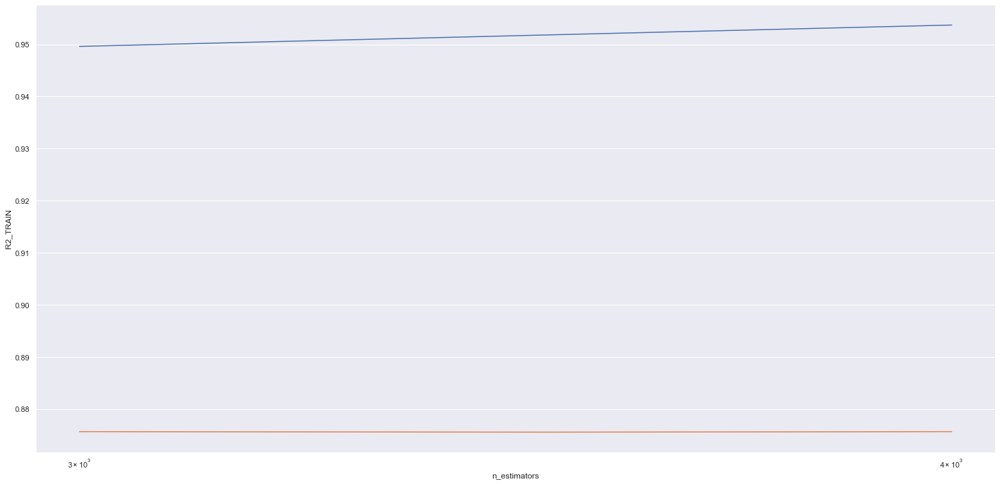

In [257]:
a = sns.lineplot(data=prev_result, x='n_estimators', y='R2_TRAIN')
a = sns.lineplot(data=prev_result, x='n_estimators', y='R2_TEST')
a.set(xscale='log');

In [258]:
final_result = pd.concat([final_result, prev_result])
final_result

,n_estimators,eta,max_depth,subsample,colsample_bytree,min_child_weight,R2_TRAIN,R2_TEST,RMSE_TRAIN,RMSE_TEST
0,1,0.30,5,1.0,1.0,1,-4.9825,-5.2523,7599.11,7611.40
0,10,0.30,5,1.0,1.0,1,-0.0323,-0.0831,3156.67,3167.94
0,100,0.30,5,1.0,1.0,1,0.7702,0.7324,1489.48,1574.81
0,1000,0.30,5,1.0,1.0,1,0.9360,0.8648,785.73,1119.29
0,1500,0.30,5,1.0,1.0,1,0.9450,0.8675,728.68,1108.20
0,2000,0.30,5,1.0,1.0,1,0.9503,0.8664,692.40,1112.79
0,1500,0.05,5,1.0,1.0,1,0.8777,0.8387,1086.70,1222.60
0,1500,0.10,5,1.0,1.0,1,0.9135,0.8649,913.92,1118.81
0,1500,0.15,5,1.0,1.0,1,0.9278,0.8724,834.67,1087.29
0,1500,0.20,5,1.0,1.0,1,0.9364,0.8741,783.64,1079.95


In [3]:
final_result = pd.read_csv('xgboost.csv')
final_result.sort_values('RMSE_TEST')
#final_result.to_csv('xgboost.csv', index=False)

,n_estimators,eta,max_depth,subsample,colsample_bytree,min_child_weight,R2_TRAIN,R2_TEST,RMSE_TRAIN,RMSE_TEST
69,3000,0.20,5,0.7,1.0,1,0.9496,0.8757,697.59,1073.25
71,4000,0.20,5,0.7,1.0,1,0.9537,0.8757,668.34,1073.39
70,3500,0.20,5,0.7,1.0,1,0.9518,0.8756,682.06,1073.45
67,2500,0.20,5,0.7,1.0,1,0.9467,0.8755,717.39,1074.04
45,1800,0.20,5,0.7,1.0,1,0.9407,0.8750,756.48,1076.05
52,1800,0.20,5,0.7,1.0,10,0.9399,0.8749,761.53,1076.85
30,6000,0.10,5,1.0,1.0,1,0.9500,0.8748,694.42,1077.05
29,5000,0.10,5,1.0,1.0,1,0.9467,0.8748,717.36,1077.11
26,3000,0.10,5,1.0,1.0,1,0.9355,0.8748,788.74,1077.12
15,1800,0.20,5,1.0,1.0,1,0.9407,0.8747,756.86,1077.53


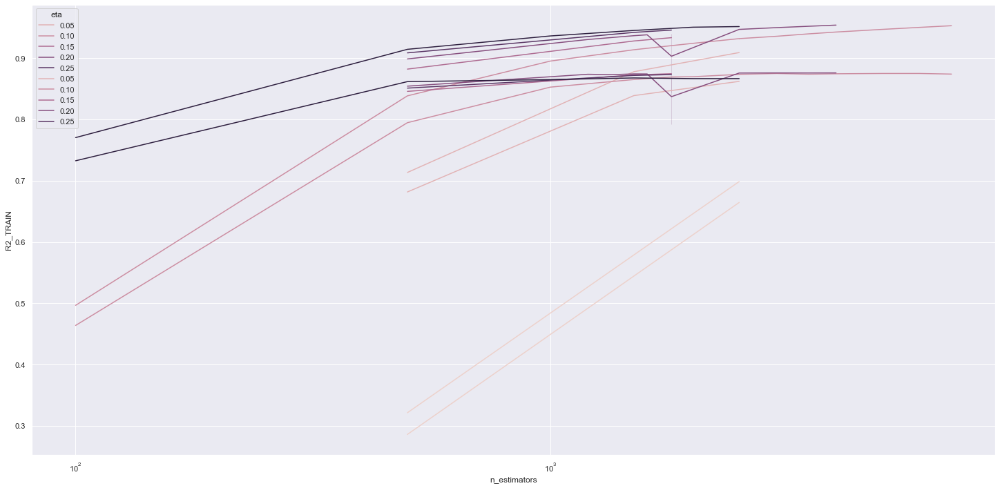

In [4]:
aux = final_result[final_result['n_estimators'] >= 100]
a = sns.lineplot(data=aux, x='n_estimators', y='R2_TRAIN', hue='eta')
a = sns.lineplot(data=aux, x='n_estimators', y='R2_TEST', hue='eta')
a.set(xscale='log');

In [ ]:
param = {
         'n_estimators': [1000], # 3000 - número de árvores
         'eta': [0.3], # 0.03 - taxa de aprendizado - quanto mais alto, mais rápido o modelo converge
         'max_depth': [6], # 5 - profundidade máxima da árvore
         'subsample': [0.7], # 0.7 - fração de observações que serão amostras aleatórias para cada árvore.
         'colsample_bytree': [0.7]
         #'min_child_weight': [3] # 3 - utilizado para controlar o overfitting. poda?
        }

MAX_EVAL = 1
#modelo demora muito, mas os n_estimators * 100

In [110]:
final_result =  pd.DataFrame()

for i in range(MAX_EVAL):
    # choose values for parameters randomly
    warnings.filterwarnings('ignore')
    hp = {k : random.choice(v) for k, v in param.items()}
    print(hp)
    #model
    model_xgb = xgb.XGBRegressor(objective='reg:squarederror',
                                n_estimators=hp['n_estimators'],
                                eta=hp['eta'],
                                max_depth=hp['max_depth'],
                                subsample=hp['subsample'],
                                colsample_bytree= hp['colsample_bytree']
                                #min_child_weight=hp['min_child_weight']                                                                               
                                ).fit(x_train, y_train)
    
    #prediction
    yhat_xgb = model_xgb.predict(x_test)
    
    #performance
    result = cross_validation(x_training, 2, 'XGBoost Regressor', model_xgb, verbose=False)
    final_result = pd.concat([final_result, result])

final_result

{'n_estimators': 1, 'eta': 0.3, 'max_depth': 5, 'subsample': 0.7, 'colsample_bytree': 0.7, 'min_child_weight': 3}


,Model Name,MAE CV,MAPE CV,RMSE CV,R2 CV
0,XGBoost Regressor,7406.92+/-128.23,1.0+/-0.0,8061.98+/-175.37,-5.43+/-0.31


## 8.2 FINAL MODEL

In [12]:
param_tuned = {'n_estimators': 1800,
               'eta': 0.2,
               'max_depth': 5,
               'subsample': 0.7,
               'colsample_bytree': 1,
               'min_child_weight': 1
           }

In [13]:
#model
model_xgb_tuned = xgb.XGBRegressor(objective='reg:squarederror',
                                    n_estimators=param_tuned['n_estimators'],
                                    eta=param_tuned['eta'],
                                    max_depth=param_tuned['max_depth'],
                                    subsample=param_tuned['subsample'],
                                    colsample_bytree=param_tuned['colsample_bytree'],
                                    min_child_weight=param_tuned['min_child_weight']                                                                               
                                    ).fit(x_train, y_train)
        
#prediction
yhat_xgb_tuned = model_xgb_tuned.predict(x_test)

#performance
xgb_result_tuned = ml_error('XGBoost Regressor', np.expm1(y_test), np.expm1(yhat_xgb_tuned))
xgb_result_tuned


,Model Name,MAE,MAPE,RMSE,R2
0,XGBoost Regressor,752.3,0.11,1076.05,0.875


In [14]:
#pickle.dump(model_xgb_tuned, open('model_rossmann_c02.pkl', 'wb'))

In [15]:
mpe = mean_percentage_error(np.expm1(y_test), np.expm1(yhat_xgb_tuned))
mpe

0.0172076720944416

## 8.3 RELOAD MODEL

In [11]:
model_xgb_tuned = pickle.load(open('model_rossmann_c02.pkl', 'rb'))
yhat_xgb_tuned = model_xgb_tuned.predict(x_test)

# 9.0 TRADUÇÃO E INTERPRETAÇÃO DO ERRO

In [12]:
df9 = X_test[cols_selected_boruta_full].copy()

#rescale
df9['sales'] = np.expm1(df9['sales'])
df9['predictions'] = np.expm1(yhat_xgb_tuned)

## 9.1. BUSINESS PERFORMANCE

In [13]:
# sum of predictions
df91 = df9[['store', 'predictions']].groupby('store').sum().reset_index()

# MAE and MAPE
df9_aux1 = df9[['store', 'sales', 'predictions']].groupby('store').apply(lambda x: mean_absolute_error(x['sales'], x['predictions'])).reset_index().rename(columns={0:'MAE'})
df9_aux2 = df9[['store', 'sales', 'predictions']].groupby('store').apply(lambda x: mean_absolute_percentage_error(x['sales'], x['predictions'])).reset_index().rename(columns={0:'MAPE'})

#Merge
df9_aux3 = pd.merge(df9_aux1, df9_aux2, how='inner', on='store')
df92 = pd.merge(df91, df9_aux3, how='inner', on='store')

#Scenarios
df92['worst_scenario'] = df92['predictions'] - df92['MAE']
df92['best_scenario'] = df92['predictions'] + df92['MAE']

#order columns
df92 = df92[['store', 'predictions', 'worst_scenario', 'best_scenario', 'MAE', 'MAPE']]
df92.head()

,store,predictions,worst_scenario,best_scenario,MAE,MAPE
0,1,157859.296875,157514.117062,158204.476688,345.179813,0.078453
1,2,175121.187500,174749.434946,175492.940054,371.752554,0.076014
2,3,262485.125000,261894.388137,263075.861863,590.736863,0.085529
3,4,341765.375000,340682.497651,342848.252349,1082.877349,0.105325
4,5,180448.812500,179950.823605,180946.801395,497.988895,0.111706


In [14]:
df92.sort_values('MAPE', ascending=False).head()

,store,predictions,worst_scenario,best_scenario,MAE,MAPE
908,909,231347.656250,223190.483993,239504.828507,8157.172257,0.561616
291,292,103022.500000,99732.503893,106312.496107,3289.996107,0.551586
840,841,125819.015625,124932.339900,126705.691350,886.675725,0.319013
875,876,200336.640625,196454.368249,204218.913001,3882.272376,0.291309
838,839,169082.281250,168237.638916,169926.923584,844.642334,0.259289


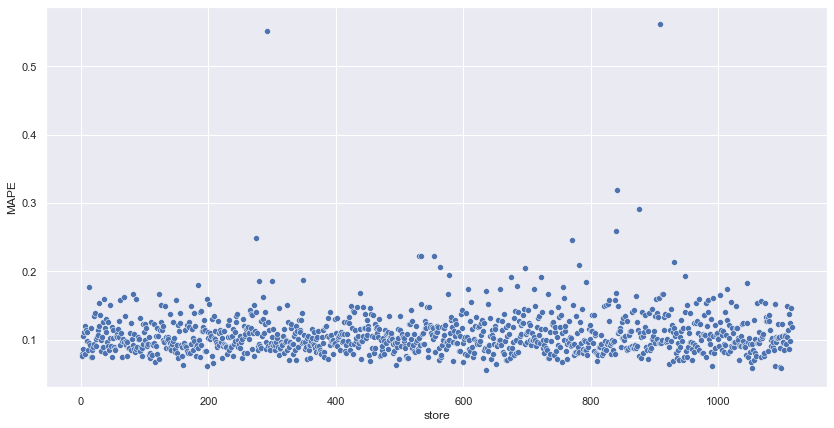

In [15]:
plt.figure(figsize=(14, 7))
sns.scatterplot(x='store', y='MAPE', data=df92)
plt.show()

## 9.2. TOTAL PERFORMANCE

In [21]:
df93 = df92[['predictions', 'worst_scenario', 'best_scenario']].apply(lambda x: np.sum(x), axis=0).reset_index().rename(columns={'index': 'Scenarios', 0:'Values'})
df93['Values'] = df93['Values'].map('R${:,.2f}'.format)
df93

,Scenarios,Values
0,predictions,"R$280,355,104.00"
1,worst_scenario,"R$279,513,259.00"
2,best_scenario,"R$281,196,961.83"


## 9.3. MACHINE LEARNING PERFORMANCE

In [74]:
df9['error'] = df9['sales'] - df9['predictions']
df9['error_rate'] = df9['predictions'] / df9['sales']

C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='predictions', ylabel='error'>

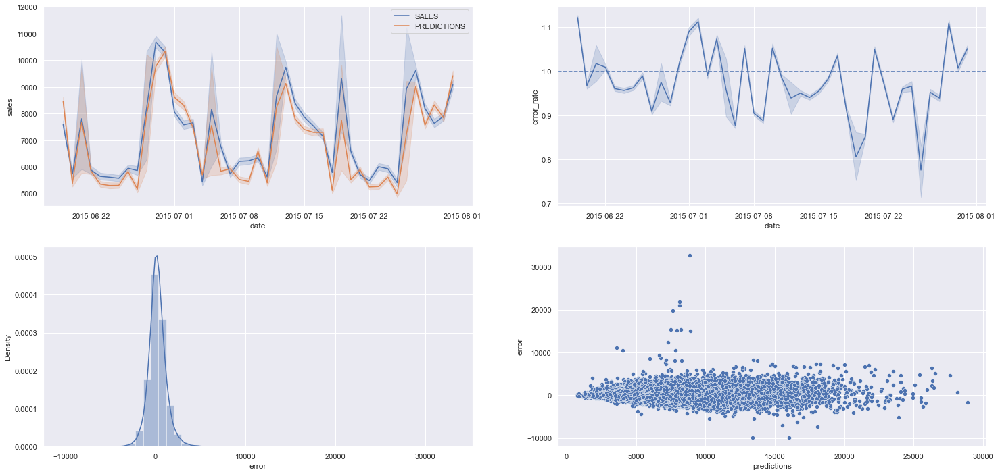

In [100]:
#plt.figure(figsize=(14, 7))
fig, axes = plt.subplots(2, 2)

sns.lineplot(x='date', y='sales', data=df9, label='SALES', ax=axes[0][0])
sns.lineplot(x='date', y='predictions', data=df9, label='PREDICTIONS', ax=axes[0][0])

g = sns.lineplot(x='date', y='error_rate', data=df9, ax=axes[0][1])
g.axhline(1, linestyle='--')

sns.distplot(df9['error'], ax=axes[1][0])

sns.scatterplot(df9['predictions'], df9['error'], ax=axes[1][1])

## 9.4 VERIFIFY ERRORS

In [124]:
dfv1 = df9.copy()

In [128]:
dfv1.columns

Index(['store', 'store_type', 'assortment', 'store_cat',
       'competition_time_days', 'competition_distance', 'promo',
       'promo2_time_days', 'date', 'sales', 'predictions', 'error',
       'error_rate', 'year', 'month', 'day', 'day_of_week', 'week_of_year'],
      dtype='object')

In [125]:
# tranforming back
home_path = 'C:/Users/kaotc/Documents/repos/rossmann_ds/'
competition_distance_scaler = pickle.load(open(home_path + 'parameter/C02/competition_distance_scaler.pkl', 'rb'))
competition_time_days_scaler = pickle.load(open(home_path + 'parameter/C02/competition_time_days_scaler.pkl', 'rb'))
promo2_time_days_scaler = pickle.load(open(home_path + 'parameter/C02/promo2_time_days_scaler.pkl', 'rb'))
store_type_scaler = pickle.load(open(home_path + 'parameter/C02/store_type_scaler.pkl', 'rb'))
store_cat_scaler = pickle.load(open(home_path + 'parameter/C02/store_cat_scaler.pkl', 'rb'))
state_holiday_scaler = pickle.load(open(home_path + 'parameter/C02/state_holiday_scaler.pkl', 'rb'))

dfv1['competition_distance'] = competition_distance_scaler.inverse_transform(dfv1[['competition_distance']].values)
dfv1['competition_time_days'] = competition_time_days_scaler.inverse_transform(dfv1[['competition_time_days']].values)
dfv1['promo2_time_days'] = promo2_time_days_scaler.inverse_transform(dfv1[['promo2_time_days']].values)
dfv1['store_type'] = store_type_scaler.inverse_transform(dfv1[['store_type']].values)
dfv1['store_cat'] = store_cat_scaler.inverse_transform(dfv1[['store_cat']].values)

C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


In [126]:
dfv1 = dfv1.drop(['day_of_week_sin', 'day_of_week_cos', 'month_cos', 'day_sin', 'day_cos', 'week_of_year_cos'], axis=1)

# year
dfv1['year'] = dfv1['date'].dt.year
# month
dfv1['month'] = dfv1['date'].dt.month
# day
dfv1['day'] = dfv1['date'].dt.day
# day
dfv1['day_of_week'] = dfv1['date'].dt.dayofweek
# week of year
dfv1['week_of_year'] = dfv1['date'].dt.isocalendar().week
dfv1['week_of_year2'] = dfv1['date'].dt.isocalendar().year
dfv1['week_of_year'] = dfv1.apply(lambda x: str(x['week_of_year2']) + '/0' + str(x['week_of_year']) if x['week_of_year'] < 10 else str(x['week_of_year2']) + '/' + str(x['week_of_year']), axis=1)
dfv1 = dfv1.drop(['week_of_year2'], axis=1)

In [129]:
arranged = ['date', 'store', 'sales', 'predictions', 'error','store_type', 'error_rate', 'assortment', 'store_cat',
            'competition_time_days', 'competition_distance', 'promo',
            'promo2_time_days', 'day_of_week', 'year', 'month', 'day', 'week_of_year']
dfv1 = dfv1[arranged]

In [135]:
dfv1[dfv1['day_of_week']==6].head()

,date,store,sales,predictions,error,store_type,error_rate,assortment,store_cat,competition_time_days,competition_distance,promo,promo2_time_days,day_of_week,year,month,day,week_of_year
5565,2015-07-26,85,11421.0,10451.252930,969.747070,b,0.915091,1,b-basic,1394.0,1870.0,0,508.000000,6,2015,7,26,2015/30
5566,2015-07-26,122,5773.0,1835.943237,3937.056763,a,0.318022,3,a-extended,846.0,58260.0,0,508.000000,6,2015,7,26,2015/30
5567,2015-07-26,209,3742.0,1817.522705,1924.477295,a,0.485709,3,a-extended,1424.0,11680.0,0,1246.261048,6,2015,7,26,2015/30
5568,2015-07-26,259,15998.0,12708.787109,3289.212891,b,0.794398,2,b-extra,25.0,210.0,0,508.000000,6,2015,7,26,2015/30
5569,2015-07-26,262,32547.0,26274.958984,6272.041016,b,0.807293,1,b-basic,816.0,1180.0,0,508.000000,6,2015,7,26,2015/30


In [134]:
dfv1.dtypes

date                     datetime64[ns]
store                             int64
sales                           float64
predictions                     float32
error                           float64
store_type                       object
error_rate                      float64
assortment                        int64
store_cat                        object
competition_time_days           float64
competition_distance            float64
promo                             int64
promo2_time_days                float64
day_of_week                       int64
year                              int64
month                             int64
day                               int64
week_of_year                     object
dtype: object

## 9.4 KAGGLE SUBMISSION

### 9.4.1. FUNCTIONS

In [16]:
def data_description(df1):
    # storing columns names
    cols_old = list(df1.columns)
    
    # transforming to underscore the names and put into lowcase
    snakecase = lambda x: inflection.underscore( x )
    
    # creating a list with a new snakecase columns name and indicating the new one
    cols_new = list( map( snakecase, cols_old ) )
    
    #renaming columns name
    df1.columns = cols_new
    
    df1['date'] = pd.to_datetime(df1['date'])
    
    # competition_distance
    df1['competition_distance'] = df1['competition_distance'].apply( lambda x: 5430.0 if math.isnan(x) else x)
    
    aux1 = df1['date'][0]

    # competition_open_since_month
    df1['competition_open_since_month'] = df1.apply(lambda x: aux1.month if math.isnan(x['competition_open_since_month']) else x['competition_open_since_month'], axis=1)
    
    # competition_open_since_year
    df1['competition_open_since_year'] = df1.apply(lambda x: aux1.year if math.isnan(x['competition_open_since_year']) else x['competition_open_since_year'], axis=1)
    
    df1['promo2_since_week'] = df1.apply(lambda x: 0 if math.isnan(x['promo2_since_week']) else x['promo2_since_week'], axis=1)

    # promo2_since_year
    df1['promo2_since_year'] = df1.apply(lambda x: 0 if math.isnan(x['promo2_since_year']) else x['promo2_since_year'], axis=1)
    
    # promo_interval
    df1['promo_interval'].fillna(0, inplace=True)
    
    df1['day_of_week'] = df1['day_of_week'].astype('str')
    df1['open'] = df1['open'].astype('str')
    df1['promo'] = df1['promo'].astype('str')
    df1['state_holiday'] = df1['state_holiday'].astype('str')
    df1['school_holiday'] = df1['school_holiday'].astype('str')
    df1['competition_open_since_month'] = df1['competition_open_since_month'].astype('int64')
    df1['competition_open_since_month'] = df1['competition_open_since_month'].astype('str')
    df1['competition_open_since_year'] = df1['competition_open_since_year'].astype('int64')
    df1['competition_open_since_year'] = df1['competition_open_since_year'].astype('str')
    df1['promo2'] = df1['promo2'].astype('str')
    df1['promo2_since_week'] = df1['promo2_since_week'].astype('int64')
    df1['promo2_since_week'] = df1['promo2_since_week'].astype('str')
    df1['promo2_since_year'] = df1['promo2_since_year'].astype('int64')
    df1['promo2_since_year'] = df1['promo2_since_year'].astype('str')
    return df1

In [17]:
def feature_engineering(df2):
    # year week
    df2['year_week'] = df2['date'].dt.strftime('%Y-%W')
    
    # promo since
    df2['promo2_since'] = df2['promo2_since_year'].astype(str) + '-' + df2['promo2_since_week'].astype(str)
    df2['promo2_since'] = df2['promo2_since'].apply(lambda x: (datetime.datetime.strptime(x + '-1', '%Y-%W-%w') - datetime.timedelta(days=7)) if x != '0-0' else datetime.datetime(year=2015, month=7, day=31))
    df2['promo2_time_days'] = df2.apply(lambda x: 0 if (x['date'] < x['promo2_since']) else (x['date'] - x['promo2_since']), axis=1)
    df2['promo2_time_days'] = df2['promo2_time_days'].apply(lambda x: 0 if isinstance(x, int) else x.days).astype('int64')
    
    # assortment
    df2['assortment'] = df2['assortment'].apply(lambda x: 'basic' if x=='a' else 'extra' if x=='b' else 'extended')
    
    # state holiday
    df2['state_holiday'] = df2['state_holiday'].apply(lambda x: 'public holiday' if x=='a' else 'eastern_holiday' if x=='b' else 'christimas' if x=='c' else 'regular_day')
    # competition since
    df2['competition_open_since_month'] = df2['competition_open_since_month'].astype('int64')
    df2['competition_open_since_year'] = df2['competition_open_since_year'].astype('int64')
    df2['competition_since'] = df2.apply(lambda x: datetime.datetime(year=x['competition_open_since_year'], month=x['competition_open_since_month'], day=1), axis=1)
    df2['competition_time_days'] = df2.apply(lambda x: 0 if (x['date'] < x['competition_since']) else (x['date'] - x['competition_since']), axis=1)
    df2['competition_time_days'] = df2['competition_time_days'].apply( lambda x: 0 if isinstance(x, int) else x.days).astype('int64')
    
    month_map = {1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun', 7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'}
    df2['month_map'] = df2['date'].dt.month.map(month_map)
    
    df2['promo2_on'] = df2[['promo_interval', 'month_map']].apply(lambda x: 0 if x['promo_interval']==0 else 1 if x['month_map'] in x['promo_interval'].split(',') else 0, axis=1)
    
    df2['store_cat'] = df2['store_type'] + '-' + df2['assortment']
    
    # year
    df2['year'] = df2['date'].dt.year
    # month
    df2['month'] = df2['date'].dt.month
    # day
    df2['day'] = df2['date'].dt.day
    # week of year
    df2['week_of_year'] = df2['date'].dt.isocalendar().week
    df2['week_of_year2'] = df2['date'].dt.isocalendar().year
    df2['week_of_year'] = df2.apply(lambda x: str(x['week_of_year2']) + '/0' + str(x['week_of_year']) if x['week_of_year'] < 10 else str(x['week_of_year2']) + '/' + str(x['week_of_year']), axis=1)
    
    df2 = df2.drop(['competition_open_since_month', 'competition_open_since_year', 
                'promo2_since_week', 'promo2_since_year', 'promo_interval',
                'year_week', 'promo2_since', 'competition_since', 'month_map', 'week_of_year2'
               ], axis=1)
    return df2

In [61]:
def preparation(df5):
    home_path = 'C:/Users/kaotc/Documents/repos/rossmann_ds/'
    competition_distance_scaler = pickle.load(open(home_path + 'parameter/C02/competition_distance_scaler.pkl', 'rb'))
    competition_time_days_scaler = pickle.load(open(home_path + 'parameter/C02/competition_time_days_scaler.pkl', 'rb'))
    promo2_time_days_scaler = pickle.load(open(home_path + 'parameter/C02/promo2_time_days_scaler.pkl', 'rb'))
    store_type_scaler = pickle.load(open(home_path + 'parameter/C02/store_type_scaler.pkl', 'rb'))
    store_cat_scaler = pickle.load(open(home_path + 'parameter/C02/store_cat_scaler.pkl', 'rb'))
    state_holiday_scaler = pickle.load(open(home_path + 'parameter/C02/state_holiday_scaler.pkl', 'rb'))
    
    df5['date'] = pd.to_datetime(df5['date'])
    df5['school_holiday'] = df5['school_holiday'].astype('str')
    df5['day_of_week'] = df5['day_of_week'].astype('int64')
    df5['open'] = df5['open'].astype('float64')
    df5['promo'] = df5['promo'].astype('str')
    df5['promo2_on'] = df5['promo2_on'].astype('str')
    
    #df5 = df5[(df5['open']==1)]
    df5 = df5.drop('open', axis=1)
    
    df5['competition_distance'] = competition_distance_scaler.fit_transform(df5[['competition_distance']].values)
    df5['competition_time_days'] = competition_time_days_scaler.fit_transform(df5[['competition_time_days']].values)
    df5['promo2_time_days'] = promo2_time_days_scaler.fit_transform(df5[['promo2_time_days']].values)
    
    assortment_dict = {'basic': 1, 'extra' : 2, 'extended' : 3}
    df5['assortment'] = df5['assortment'].map(assortment_dict)
    
    df5['store_type'] = store_type_scaler.fit_transform(df5[['store_type']].values)
    df5['store_cat'] = store_cat_scaler.fit_transform(df5[['store_cat']].values)
    df5['state_holiday'] = state_holiday_scaler.fit_transform(df5[['state_holiday']].values)
    
    #day of the week
    df5['day_of_week_sin'] = df5['day_of_week'].apply(lambda x: np.sin(x*(2.*np.pi/7)))
    df5['day_of_week_cos'] = df5['day_of_week'].apply(lambda x: np.cos(x*(2.*np.pi/7)))
    #month
    df5['month_sin'] = df5['month'].apply(lambda x: np.sin(x*(2.*np.pi/12)))
    df5['month_cos'] = df5['month'].apply(lambda x: np.cos(x*(2.*np.pi/12)))
    #day
    df5['day_sin'] = df5['day'].apply(lambda x: np.sin(x*(2.*np.pi/30)))
    df5['day_cos'] = df5['day'].apply(lambda x: np.cos(x*(2.*np.pi/30)))
    #week of year
    df5['week_of_year'] = df5['week_of_year'].apply(lambda x: x.split('/')[1])
    df5['week_of_year'] = df5['week_of_year'].astype('int64')
    df5['week_of_year_sin'] = df5['week_of_year'].apply(lambda x: np.sin(x*(2.*np.pi/52)))
    df5['week_of_year_cos'] = df5['week_of_year'].apply(lambda x: np.cos(x*(2.*np.pi/52)))
    return df5

In [55]:
def feature_selection(df6):
    cols_selected_boruta = ['store',
                            'store_type',
                            'assortment',
                            'store_cat',
                            'competition_time_days',
                            'competition_distance',
                            'promo',
                            'promo2_time_days',
                            'day_of_week_sin',
                            'day_of_week_cos',
                            'month_cos',
                            'day_sin',
                            'day_cos',
                            'week_of_year_cos']
    df6 = df6[cols_selected_boruta]
    return df6

### 9.4.2. KAGGLE TEST SET

In [139]:
df_test_kg = pd.read_csv('dataset/test.csv')
df_store_raw = pd.read_csv( 'dataset/store.csv', low_memory=False)

#merge - MAIN: SALES MERGING LEFT - Because all sales are related to a store.
df_test_raw = pd.merge( df_test_kg, df_store_raw, how='left', on='Store')

In [63]:
df1_kg = data_description(df_test_raw)
df2_kg = feature_engineering(df1_kg)
df5_kg = preparation(df2_kg)
df6_kg = feature_selection(df5_kg)
df6_kg.head()

C:\Users\kaotc\anaconda3\envs\DSemproducao\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


,store,store_type,assortment,store_cat,competition_time_days,competition_distance,promo,promo2_time_days,day_of_week_sin,day_of_week_cos,month_cos,day_sin,day_cos,week_of_year_cos
0,1,2,1,5,0.679208,-0.206474,1,-0.341357,-0.433884,-0.900969,-1.836970e-16,-0.406737,-0.913545,-0.120537
1,3,0,1,0,0.932673,2.043745,1,0.806878,-0.433884,-0.900969,-1.836970e-16,-0.406737,-0.913545,-0.120537
2,7,0,3,1,0.016634,3.770779,1,-0.341357,-0.433884,-0.900969,-1.836970e-16,-0.406737,-0.913545,-0.120537
3,8,0,1,0,-0.200396,0.887139,1,-0.341357,-0.433884,-0.900969,-1.836970e-16,-0.406737,-0.913545,-0.120537
4,9,0,3,1,1.848713,-0.073491,1,-0.341357,-0.433884,-0.900969,-1.836970e-16,-0.406737,-0.913545,-0.120537


### 4.4.3. MACHINE LEARNING

In [58]:
model_xgb_tuned = pickle.load(open('model_rossmann_c02.pkl', 'rb'))

In [64]:
#prediction
yhat_xgb_tuned_kg = model_xgb_tuned.predict(df6_kg)

In [65]:
yhat_xgb_tuned_kg = np.expm1(yhat_xgb_tuned_kg)
yhat_xgb_tuned_kg.shape

(41088,)

### 4.4.4. SUBMITTION

In [66]:
submission = pd.read_csv('dataset/sample_submission.csv')
submission['Sales'] = yhat_xgb_tuned_kg
submission.to_csv('dataset/submission01.csv', index=False)

In [67]:
submission.head()

,Id,Sales
0,1,4584.753906
1,2,7376.702637
2,3,8248.839844
3,4,5894.759766
4,5,5822.422363


In [142]:
total_kg = pd.concat([df6_kg, submission['Sales'], df_test_kg['DayOfWeek'],df_test_kg['Open']], axis=1)

In [145]:
rearange = ['store', 'store_type', 'assortment', 'store_cat',
            'competition_time_days', 'competition_distance', 'promo',
            'promo2_time_days', 'Sales', 'DayOfWeek', 'Open']
total_kg = total_kg[rearange]
total_kg.head()

,store,store_type,assortment,store_cat,competition_time_days,competition_distance,promo,promo2_time_days,Sales,DayOfWeek,Open
0,1,2,1,5,0.679208,-0.206474,1,-0.341357,4584.753906,4,1.0
1,3,0,1,0,0.932673,2.043745,1,0.806878,7376.702637,4,1.0
2,7,0,3,1,0.016634,3.770779,1,-0.341357,8248.839844,4,1.0
3,8,0,1,0,-0.200396,0.887139,1,-0.341357,5894.759766,4,1.0
4,9,0,3,1,1.848713,-0.073491,1,-0.341357,5822.422363,4,1.0


In [146]:
total_kg[total_kg['Open'] == 0]

,store,store_type,assortment,store_cat,competition_time_days,competition_distance,promo,promo2_time_days,Sales,DayOfWeek,Open
543,703,0,1,0,1.149703,-0.414698,1,-0.341357,4351.358887,4,0.0
676,879,3,1,7,-0.333069,0.521435,1,0.320362,4619.790527,4,0.0
840,1097,1,2,4,1.620198,-0.302712,1,-0.341357,10164.501953,4,0.0
1399,703,0,1,0,1.149307,-0.414698,1,-0.342081,4277.454590,3,0.0
1532,879,3,1,7,-0.333465,0.521435,1,0.319638,4693.125977,3,0.0
1696,1097,1,2,4,1.619802,-0.302712,1,-0.342081,10091.725586,3,0.0
2255,703,0,1,0,1.148911,-0.414698,1,-0.342805,5099.229004,2,0.0
2388,879,3,1,7,-0.333861,0.521435,1,0.318914,5401.277344,2,0.0
2552,1097,1,2,4,1.619406,-0.302712,1,-0.342805,10860.536133,2,0.0
3111,703,0,1,0,1.148515,-0.414698,1,-0.343529,5402.601562,1,0.0


# 10.0 DEPLOY MODEL TO PRODUCTION

## 10.1. ROSSMAN CLASS

In [ ]:
import pickle
import inflection
import pandas as pd
import numpy as np
import math
import datetime

class Rossmann(object):
    def __init__(self):
        #state = 1
        self.home_path = 'C:/Users/kaotc/Documents/repos/sales_prediction/'
        self.competititon_distance_scaler = pickle.load(open(self.home_path + 'parameter/competition_distance_scaler.pkl', 'rb'))
        self.competititon_time_month_scaler = pickle.load(open(self.home_path + 'parameter/competition_time_month_scaler.pkl', 'rb'))
        self.promo_time_week_scaler = pickle.load(open(self.home_path + 'parameter/promo_time_week_scaler.pkl', 'rb'))
        self.year_scaler = pickle.load(open(self.home_path + 'parameter/year_scaler.pkl', 'rb'))
        self.store_type_scaler = pickle.load(open(self.home_path + 'parameter/store_type_scaler.pkl', 'rb'))
        
    def data_cleaning(self, df1):
        
        ## 1.1 Rename Colums

        cols_old = ['Store', 'DayOfWeek', 'Date',
                    #'Sales', 'Customers',
                    'Open', 'Promo',
                    'StateHoliday', 'SchoolHoliday', 'StoreType', 'Assortment',
                    'CompetitionDistance', 'CompetitionOpenSinceMonth',
                    'CompetitionOpenSinceYear', 'Promo2', 'Promo2SinceWeek',
                    'Promo2SinceYear', 'PromoInterval']

        snakecase = lambda x: inflection.underscore( x )
        
        cols_new = list( map( snakecase, cols_old ) )

        #rename
        df1.columns = cols_new

        ## 1.3 Data Types

        df1['date'] = pd.to_datetime(df1['date'])
        
        ## 1.5 Fillout NA

        df1['competition_distance'].max()

        # competition_distance
        df1['competition_distance'] = df1['competition_distance'].apply( lambda x: 200000.0 if math.isnan(x) else x)

        # competition_open_since_month
        df1['competition_open_since_month'] = df1.apply(lambda x: x['date'].month if math.isnan(x['competition_open_since_month']) else x['competition_open_since_month'], axis=1)

        # competition_open_since_year
        df1['competition_open_since_year'] = df1.apply(lambda x: x['date'].year if math.isnan(x['competition_open_since_year']) else x['competition_open_since_year'], axis=1)

        # promo2_since_week
        df1['promo2_since_week'] = df1.apply(lambda x: x['date'].week if math.isnan(x['promo2_since_week']) else x['promo2_since_week'], axis=1)

        # promo2_since_year
        df1['promo2_since_year'] = df1.apply(lambda x: x['date'].year if math.isnan(x['promo2_since_year']) else x['promo2_since_year'], axis=1)

        # promo_interval
        month_map = {1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun', 7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'}
        df1['promo_interval'].fillna(0, inplace=True)

        df1['month_map'] = df1['date'].dt.month.map(month_map)

        df1['is_promo'] = df1[['promo_interval', 'month_map']].apply(lambda x: 0 if x['promo_interval']==0 else 1 if x['month_map'] in x['promo_interval'].split(',') else 0, axis=1)

        ## 1.6 Change Types

        df1.dtypes
        
        df1['competition_open_since_month'] = df1['competition_open_since_month'].astype('int64')
        df1['competition_open_since_year'] = df1['competition_open_since_year'].astype('int64')
        df1['promo2_since_week'] = df1['promo2_since_week'].astype('int64')
        df1['promo2_since_year'] = df1['promo2_since_year'].astype('int64')
        
        return df1
    
    def feature_engineering(self,df2):

        # year
        df2['year'] = df2['date'].dt.year
        # month
        df2['month'] = df2['date'].dt.month
        # day
        df2['day'] = df2['date'].dt.day
        # week of year
        df2['week_of_year'] = df2['date'].dt.isocalendar().week
        # year week
        df2['year_week'] = df2['date'].dt.strftime('%Y-%W')

        # competition since
        df2['competition_since'] = df2.apply(lambda x: datetime.datetime(year=x['competition_open_since_year'], month=x['competition_open_since_month'], day=1), axis=1)
        df2['competition_time_month'] = ((df2['date'] - df2['competition_since'])/30).apply( lambda x: x.days).astype('int64')

        # promo since
        df2['promo_since'] = df2['promo2_since_year'].astype(str) + '-' + df2['promo2_since_week'].astype(str)
        df2['promo_since'] = df2['promo_since'].apply(lambda x: datetime.datetime.strptime(x + '-1', '%Y-%W-%w') - datetime.timedelta(days=7))
        df2['promo_time_week'] = ((df2['date'] - df2['promo_since']) / 7).apply( lambda x: x.days).astype('int64')

        # assortment
        df2['assortment'] = df2['assortment'].apply(lambda x: 'basic' if x=='a' else 'extra' if x=='b' else 'extended')

        # state holiday
        df2['state_holiday'] = df2['state_holiday'].apply(lambda x: 'public holiday' if x=='a' else 'eastern_holiday' if x=='b' else 'christimas' if x=='c' else 'regular_day')
        
        ## 3.1. Filtragem das linhas
        
        df2 = df2[(df2['open'] != 0)]

        # 3.2. Seleção das Colunas
        cols_drop = ['open', 'promo_interval', 'month_map']
        df2 = df2.drop(cols_drop, axis=1)
        
        return df2

    def data_preparation(self, df5):
        ## 5.2. RESCALLING

        #competition distance
        df5['competition_distance'] = self.competititon_distance_scaler.fit_transform(df5[['competition_distance']].values)
        
        #competition time month
        df5['competition_time_month'] = self.competititon_time_month_scaler.fit_transform(df5[['competition_time_month']].values)

        #promo time week
        df5['promo_time_week'] = self.promo_time_week_scaler.fit_transform(df5[['promo_time_week']].values)

        #year
        df5['year'] = self.year_scaler.fit_transform(df5[['year']].values)

        ## 5.3. TRANSFORMAÇÃO

        ### 5.3.1 ENCODING

        # state_holiday - One Hot Encoding
        df5 = pd.get_dummies(df5, prefix=['state_holiday'], columns=['state_holiday'])

        #store type - Label Encoding
        df5['store_type'] = self.store_type_scaler.fit_transform(df5['store_type'])


        #assortment - Oridinal Encoding
        assortment_dict = {'basic': 1, 'extra' : 2, 'extended' : 3}
        df5['assortment'] = df5['assortment'].map(assortment_dict)

        ### 5.3.2. NATURE TRANSFORMATION

        #day of the week
        df5['day_of_week_sin'] = df5['day_of_week'].apply(lambda x: np.sin(x*(2.*np.pi/7)))
        df5['day_of_week_cos'] = df5['day_of_week'].apply(lambda x: np.cos(x*(2.*np.pi/7)))
        #month
        df5['month_sin'] = df5['month'].apply(lambda x: np.sin(x*(2.*np.pi/12)))
        df5['month_cos'] = df5['month'].apply(lambda x: np.cos(x*(2.*np.pi/12)))
        #day
        df5['day_sin'] = df5['day'].apply(lambda x: np.sin(x*(2.*np.pi/30)))
        df5['day_cos'] = df5['day'].apply(lambda x: np.cos(x*(2.*np.pi/30)))
        #week of year
        df5['week_of_year_sin'] = df5['week_of_year'].apply(lambda x: np.sin(x*(2.*np.pi/52)))
        df5['week_of_year_cos'] = df5['week_of_year'].apply(lambda x: np.cos(x*(2.*np.pi/52)))
        
        cols_selected = ['store',
                        'promo',
                        'store_type',
                        'assortment',
                        'competition_distance',
                        'competition_open_since_month',
                        'competition_open_since_year',
                        'promo2',
                        'promo2_since_week',
                        'promo2_since_year',
                        'competition_time_month',
                        'promo_time_week',
                        'day_of_week_sin',
                        'day_of_week_cos',
                        'month_cos',
                        'month_sin',
                        'day_sin',
                        'day_cos',
                        'week_of_year_sin',
                        'week_of_year_cos']
        
        return df5[cols_selected]
                  
    def get_prediction(self, model, original_data, test_data):
        # prediction
        pred = model.predict(test_data)
        
        # join pred into the original data
        original_data['prediction'] = np.expm1(pred)
        
        return original_data.to_json(orient='records', date_format='iso')

## 10.2. API HANDLER

In [ ]:
import pandas as pd
import pickle
from flask import Flask, request, Response
from rossmann.Rossmann import Rossmann

#loading model
model = pickle.load(open('C:/Users/kaotc/Documents/repos/sales_prediction/model_rossmann.pkl', 'rb'))

#initialize API
app = Flask(__name__)

@app.route('/rossmann/predict', methods=['POST'])

def rossmann_predict():
    test_json = request.get_json()
    
    if test_json: # there is data
        if isinstance(test_json, dict): #Unique example
            test_raw = pd.DataFrame(test_json, index=[0])
        else: #Multiple example
            test_raw = pd.DataFrame(test_json, columns=test_json[0].keys())
            
        # Instaciate Rossmann Class
        pipeline = Rossmann()
        
        # Data Cleaning
        df1 = pipeline.data_cleaning(test_raw)
        
        # Feature Engineering
        df2 = pipeline.feature_engineering(df1)
        
        # Data Preparation
        df3 = pipeline.data_preparation(df2)
        
        # Prediction
        df_response = pipeline.get_prediction(model, test_raw, df3)
        
        return df_response
        
    else:
        return Response('{}', status=200, mimetype='application/json')
    

if __name__ == '__main__':
    app.run( host = "192.168.15.77", port= 5000, debug=True)

## 10.3 API TESTER

In [3]:
import requests

In [4]:
# loading test dataset
df10 = pd.read_csv('dataset/test.csv')

In [5]:
# merge test dataset + store
df_test = pd.merge(df10, df_store_raw, how='left', on='Store')

# choose store for prediction
df_test = df_test[df_test['Store'].isin([24, 12, 22])]

# remove closed days
df_test = df_test[df_test['Open'] != 0]
df_test = df_test[~df_test['Open'].isnull()] #~ não pega os campos vazios
df_test = df_test.drop('Id', axis=1)

In [6]:
# convert DataFrame to json
data = json.dumps(df_test.to_dict(orient='records'))
data

'[{"Store": 12, "DayOfWeek": 4, "Date": "2015-09-17", "Open": 1.0, "Promo": 1, "StateHoliday": "0", "SchoolHoliday": 0, "StoreType": "a", "Assortment": "c", "CompetitionDistance": 1070.0, "CompetitionOpenSinceMonth": NaN, "CompetitionOpenSinceYear": NaN, "Promo2": 1, "Promo2SinceWeek": 13.0, "Promo2SinceYear": 2010.0, "PromoInterval": "Jan,Apr,Jul,Oct"}, {"Store": 22, "DayOfWeek": 4, "Date": "2015-09-17", "Open": 1.0, "Promo": 1, "StateHoliday": "0", "SchoolHoliday": 0, "StoreType": "a", "Assortment": "a", "CompetitionDistance": 1040.0, "CompetitionOpenSinceMonth": NaN, "CompetitionOpenSinceYear": NaN, "Promo2": 1, "Promo2SinceWeek": 22.0, "Promo2SinceYear": 2012.0, "PromoInterval": "Jan,Apr,Jul,Oct"}, {"Store": 24, "DayOfWeek": 4, "Date": "2015-09-17", "Open": 1.0, "Promo": 1, "StateHoliday": "0", "SchoolHoliday": 0, "StoreType": "a", "Assortment": "c", "CompetitionDistance": 4590.0, "CompetitionOpenSinceMonth": 3.0, "CompetitionOpenSinceYear": 2000.0, "Promo2": 1, "Promo2SinceWeek": 

In [7]:
# API Call
#url = 'https://geordano-model.herokuapp.com/rossmann/predict'
url = 'https://rosmann-model-test.herokuapp.com/rossmann/predict'
#url = 'http://192.168.15.77:5000/rossmann/predict'
#url = 'http://192.168.15.6:5000/rossmann/predict'
header = {'Content-type':'application/json'}
data = data

r = requests.post(url, data, headers=header)
print('Status Code {}'.format(r.status_code))

Status Code 200


In [8]:
# DEPOIS DE RODAR O API CALL
d1 = pd.DataFrame(r.json(), columns=r.json()[0].keys())

In [9]:
d1.head()

,store,day_of_week,date,open,promo,state_holiday,school_holiday,store_type,assortment,competition_distance,...,year,month,day,week_of_year,year_week,competition_since,competition_time_month,promo_since,promo_time_week,prediction
0,12,4,2015-09-17T00:00:00.000Z,1.0,1,regular_day,0,a,extended,1070.0,...,2015,9,17,38,2015-37,2015-09-01T00:00:00.000Z,0,2010-03-22T00:00:00.000Z,286,6868.093262
1,22,4,2015-09-17T00:00:00.000Z,1.0,1,regular_day,0,a,basic,1040.0,...,2015,9,17,38,2015-37,2015-09-01T00:00:00.000Z,0,2012-05-21T00:00:00.000Z,173,4234.729004
2,24,4,2015-09-17T00:00:00.000Z,1.0,1,regular_day,0,a,extended,4590.0,...,2015,9,17,38,2015-37,2000-03-01T00:00:00.000Z,189,2011-09-26T00:00:00.000Z,207,7839.891113
3,12,3,2015-09-16T00:00:00.000Z,1.0,1,regular_day,0,a,extended,1070.0,...,2015,9,16,38,2015-37,2015-09-01T00:00:00.000Z,0,2010-03-22T00:00:00.000Z,286,6988.126465
4,22,3,2015-09-16T00:00:00.000Z,1.0,1,regular_day,0,a,basic,1040.0,...,2015,9,16,38,2015-37,2015-09-01T00:00:00.000Z,0,2012-05-21T00:00:00.000Z,173,4299.241699


In [10]:
d2 = d1[['store', 'prediction']].groupby('store').sum().reset_index()

for i in range (len(d2)):
    print('Store Number {} will sell R$ {:,.2f} in the next 6 weeks'.format(d2.loc[i, 'store'], d2.loc[i, 'prediction']))

Store Number 12 will sell R$ 258,738.96 in the next 6 weeks
Store Number 22 will sell R$ 155,993.56 in the next 6 weeks
Store Number 24 will sell R$ 291,482.27 in the next 6 weeks


## HEROKU

1. Criar a pasta model / parameter / rossmann

2. Copiar os arquivos
    model 
        - model_rossmann.pkl
    parameter
        - competition_distance_scaler.pkl
        - competition_time_month_scaler.pkl
        - promo_time_week_scaler.pkl
        - store_type_scaler.pkl
        - year_scaler.pkl
    rossmann
        - Rossmann.py

3. Atualizar os arquivos handler.py e rossmann.py para que fiquem com o caminho relativo, portas e bibliotecas

4. pip freeze - mostra todas as bibliotecas que estão utilizadas pip freeze > requeriments.txt

5. Iniciar com git init na pasta que irá rodar (webapp)

6. Rodar o Heroku

In [ ]:
pipreqs